<h1 style="text-align:center;font-size:30px;" > Quora Question Pairs Similarity Detection </h1>

<img src='images/quora.jpg'/>

<h1> 1. Business Problem </h1>

<h2> 1.1 Description </h2>

<p>Quora is a place to gain and share knowledge—about anything. It’s a platform to ask questions and connect with people who contribute unique insights and quality answers. This empowers people to learn from each other and to better understand the world.</p>
<p>
Over 100 million people visit Quora every month, so it's no surprise that many people ask similarly worded questions. Multiple questions with the same intent can cause seekers to spend more time finding the best answer to their question, and make writers feel they need to answer multiple versions of the same question. Quora values canonical questions because they provide a better experience to active seekers and writers, and offer more value to both of these groups in the long term.
</p>
<br>
> Credits: Kaggle 


__ Problem Statement __
- Identify which questions asked on Quora are duplicates of questions that have already been asked. 
- This could be useful to instantly provide answers to questions that have already been answered. 
- We are tasked with predicting whether a pair of questions are duplicates or not. 

<h2> 1.2 Sources/Useful Links</h2>

- Source : https://www.kaggle.com/c/quora-question-pairs
<br><br>____ Useful Links ____
- Discussions : https://www.kaggle.com/anokas/data-analysis-xgboost-starter-0-35460-lb/comments
- Kaggle Winning Solution and other approaches: https://www.dropbox.com/sh/93968nfnrzh8bp5/AACZdtsApc1QSTQc7X0H3QZ5a?dl=0
- Blog 1 : https://engineering.quora.com/Semantic-Question-Matching-with-Deep-Learning
- Blog 2 : https://towardsdatascience.com/identifying-duplicate-questions-on-quora-top-12-on-kaggle-4c1cf93f1c30

<h2>1.3 Real world/Business Objectives and Constraints </h2>

1. The cost of a mis-classification can be very high.
2. You would want a probability of a pair of questions to be duplicates so that you can choose any threshold of choice.
3. No strict latency concerns.
4. Interpretability is partially important.

<h1>2. Machine Learning Probelm </h1>

<h2> 2.1 Data </h2>

<h3> 2.1.1 Data Overview </h3>

<p> 
- Data will be in a file Train.csv <br>
- Train.csv contains 5 columns : qid1, qid2, question1, question2, is_duplicate <br>
- Size of Train.csv - 60MB <br>
- Number of rows in Train.csv = 404,290
</p>

<h3> 2.1.2 Example Data point </h3>

<pre>
"id","qid1","qid2","question1","question2","is_duplicate"
"0","1","2","What is the step by step guide to invest in share market in india?","What is the step by step guide to invest in share market?","0"
"1","3","4","What is the story of Kohinoor (Koh-i-Noor) Diamond?","What would happen if the Indian government stole the Kohinoor (Koh-i-Noor) diamond back?","0"
"7","15","16","How can I be a good geologist?","What should I do to be a great geologist?","1"
"11","23","24","How do I read and find my YouTube comments?","How can I see all my Youtube comments?","1"
</pre>

<h2> 2.2 Mapping the real world problem to an ML problem </h2>

<h3> 2.2.1 Type of Machine Leaning Problem </h3>

<p> It is a binary classification problem, for a given pair of questions we need to predict if they are duplicate or not. </p>

<h3> 2.2.2 Performance Metric </h3>

Source: https://www.kaggle.com/c/quora-question-pairs#evaluation

Metric(s): 
* log-loss : https://www.kaggle.com/wiki/LogarithmicLoss
* Binary Confusion Matrix

<h2> 2.3 Train and Test Construction </h2>

<p>  </p>
<p> We build train and test by randomly splitting in the ratio of 70:30 or 80:20 whatever we choose as we have sufficient points to work with. </p>

<h1>1. Importing all the libraries </h1>

In [1]:

import warnings
warnings.filterwarnings("ignore")
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from subprocess import check_output
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import os
import gc
import re
from nltk.corpus import stopwords
import distance
from nltk.stem import PorterStemmer
from bs4 import BeautifulSoup
import re
from nltk.corpus import stopwords
# This package is used for finding longest common subsequence between two strings
# you can write your own dp code for this
from nltk.stem import PorterStemmer
from bs4 import BeautifulSoup
from fuzzywuzzy import fuzz
from sklearn.manifold import TSNE
# Import the Required lib packages for WORD-Cloud generation
# https://stackoverflow.com/questions/45625434/how-to-install-wordcloud-in-python3-6
from wordcloud import WordCloud, STOPWORDS
from os import path
from PIL import Image
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
import pandas as pd
import matplotlib.pyplot as plt
import re
import time
import warnings
import numpy as np
from nltk.corpus import stopwords
from sklearn.preprocessing import normalize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
import sys
import os 
import pandas as pd
import numpy as np
from tqdm import tqdm
import spacy
import sqlite3
from sqlalchemy import create_engine # database connection
import csv
import os
from datetime import datetime as dt
import numpy as np
from nltk.corpus import stopwords
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.metrics.classification import log_loss
from sklearn.feature_extraction.text import TfidfVectorizer
from collections import Counter
from scipy.sparse import hstack
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold, RandomizedSearchCV, train_test_split, GridSearchCV
from collections import Counter, defaultdict
from sklearn.calibration import CalibratedClassifierCV
import math
from sklearn.linear_model import SGDClassifier
from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
import pickle
warnings.filterwarnings("ignore")

<h1> 2. Reading data and basic stats </h1>

In [2]:
dataset = pd.read_csv("train.csv")
print("Number of data points:",dataset.shape[0])

Number of data points: 404290


In [3]:
dataset.head()

,id,qid1,qid2,question1,question2,is_duplicate
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0


In [6]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 404290 entries, 0 to 404289
Data columns (total 6 columns):
id              404290 non-null int64
qid1            404290 non-null int64
qid2            404290 non-null int64
question1       404289 non-null object
question2       404288 non-null object
is_duplicate    404290 non-null int64
dtypes: int64(4), object(2)
memory usage: 18.5+ MB


As we can see from the information above, there are two null entries for question2. We will take care of this in later stages of our analysis. Typically the approach is to replace the null values with an empty string " ". The logic behind is that the similairty between any string and an empty string is always 0. So the tqo questions won't be duplicate of each other. The other approach is we can simply remove the datapoints corresponding to the null value. 

We are given a minimal number of data fields here, consisting of:

- id:  Looks like a simple rowID
- qid{1, 2}:  The unique ID of each question in the pair
- question{1, 2}:  The actual textual contents of the questions.
- is_duplicate:  The label that we are trying to predict - whether the two questions are duplicates of each other.

<h1> 3. Exploratory Data Analysis on the given dataset</h1>

<h3> 3.1 Distribution of data points among output classes </h3>

- Number of duplicate(smilar) and non-duplicate(non similar) questions

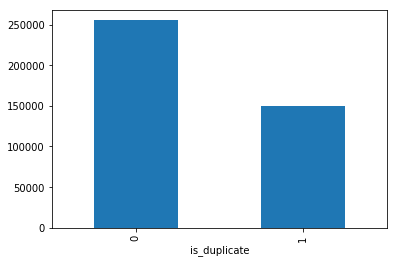

In [0]:
dataset.groupby("is_duplicate")['id'].count().plot.bar()

In [8]:
print('Total number of question pairs for training: {}'.format(len(dataset)))

Total number of question pairs for training: 404290


In [42]:
duplicate=dataset['is_duplicate'].value_counts()[0]
not_duplicate=dataset['is_duplicate'].value_counts()[1]
total = duplicate+not_duplicate

print('Question pairs that are not similar (is_duplicate = 0): {}%'.format(np.round((not_duplicate/total*100),3)))
print('Question pairs that are similar (is_duplicate = 1) {}%'.format(np.round((duplicate/total*100),3)))

Question pairs that are not similar (is_duplicate = 0): 36.92%
Question pairs that are similar (is_duplicate = 1) 63.08%


<h3> 3.2 Number of unique questions </h3>

In [46]:
qids = pd.Series(dataset['qid1'].tolist() + dataset['qid2'].tolist())
unique_qs = len(np.unique(qids)) #Another approach unique=len(set(qids))
qs_morethan_onetime = np.sum(qids.value_counts() > 1) #qids.value_counts() will give the number of times each questions appear.
print ('Total number of questions that are unique: {}'.format(unique_qs))

print ('Number of unique questions that appear more than one time: {} ({}%)'.format(qs_morethan_onetime,np.round(qs_morethan_onetime/unique_qs*100,2)))
print ('Max number of times a single question is repeated: {}'.format(max(qids.value_counts()))) 

q_vals=qids.value_counts()
q_vals=q_vals.values

Total number of questions that are unique: 537933
Number of unique questions that appear more than one time: 111780 (20.78%)
Max number of times a single question is repeated: 157


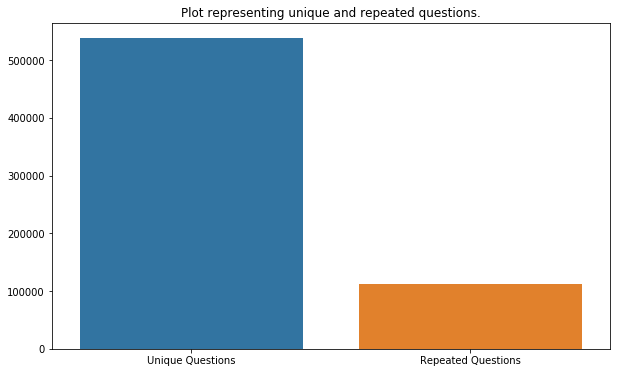

In [47]:
#Bar plot for unique and repeated questions.
x = ["Unique Questions" , "Repeated Questions"]
y =  [unique_qs , qs_morethan_onetime]

plt.figure(figsize=(10, 6))
plt.title ("Plot representing unique and repeated questions.")
sns.barplot(x,y)
plt.show()

<h3>3.3 Checking for Duplicates pairs of questions.</h3>

In [52]:
#Checking whether there are any repeated pair of questions.
pair_duplicates = dataset.groupby(['qid1','qid2']).count().reset_index()
print ("Number of duplicate questions:",(pair_duplicates).shape[0] - dataset.shape[0])

Number of duplicate questions: 0


<h3> 3.4 Number of occurrences of each question </h3>

Text(0,0.5,'Number of questions that occurs x number of times.')

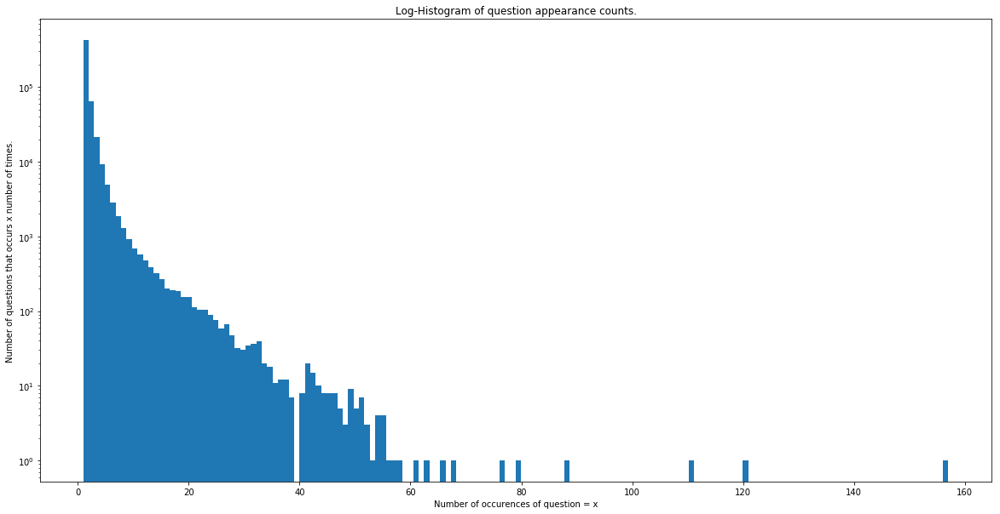

In [56]:
plt.figure(figsize=(20, 10))
plt.hist(qids.value_counts(), bins=160) #Max value of a single question being repeated is 157, hence we chose 160 as th bin size.
plt.yscale('log', nonposy='clip')
plt.title('Log-Histogram of question appearance counts.')
plt.xlabel('Number of occurences of question = x')
plt.ylabel('Number of questions that occurs x number of times.')

### Observation:

1. Our dataset is not totally imabalanced. We have almost 63% pairs of questions which belongs to the "Not Duplicate" category, and 33% questions which belongs to the "Duplicate" category!
2. The total number of unique questions that we have is 537933 (80%). Almost 20% of the questions are repeated more than 1 times!
3. The maximum number of occurence for any single question is 157! 
4. If we look at the Log Histogram above, we see that most questions occurs once between 1-20 times.

<h3> 3.5 Checking for NULL values </h3>

In [61]:
#Checking the rows with null values.
nan_rows = dataset[dataset.isnull().any(1)]
print(nan_rows)

            id    qid1    qid2                         question1  \
105780  105780  174363  174364    How can I develop android app?   
201841  201841  303951  174364  How can I create an Android app?   
363362  363362  493340  493341                               NaN   

                                                question2  is_duplicate  
105780                                                NaN             0  
201841                                                NaN             0  
363362  My Chinese name is Haichao Yu. What English na...             0  


- There are two rows with null values in question2 

In [63]:
# Filling the null values with ' '
dataset = dataset.fillna('')
nan_rows = dataset[dataset.isnull().any(1)]
print(nan_rows)

Empty DataFrame
Columns: [id, qid1, qid2, question1, question2, is_duplicate]
Index: []


In [65]:
#Save the dataset after filling it with null values.
dataset.to_csv('train_without_NAN.csv') 

<h1>4. Basic Feature Extraction (before cleaning) </h1>

Let us now construct a few features like:
 - ____freq_qid1____ = Frequency of qid1's
 - ____freq_qid2____ = Frequency of qid2's 
 - ____q1len____ = Length of q1
 - ____q2len____ = Length of q2
 - ____q1_n_words____ = Number of words in Question 1
 - ____q2_n_words____ = Number of words in Question 2
 - ____word_Common____ = (Number of common unique words in Question 1 and Question 2)
 - ____word_Total____ =(Total num of words in Question 1 + Total num of words in Question 2)
 - ____word_share____ = (word_common)/(word_Total)
 - ____freq_q1+freq_q2____ = sum total of frequency of qid1 and qid2 
 - ____freq_q1-freq_q2____ = absolute difference of frequency of qid1 and qid2 

<h3> 4.1 Extracting Basic Features</h3>

In [3]:
if os.path.isfile('dataset_fe_without_preprocessing_train.csv'):
    dataset = pd.read_csv("dataset_fe_without_preprocessing_train.csv",encoding='latin-1')
else:
    
    def freq(question):
        count=0
        for i in range(0,dataset.shape[0]):
            if(question==dataset['question1'][i]):
                count+=1
        return count

    dataset['freq_qid1'] = dataset.groupby('qid1')['qid1'].transform('count') #This part is not clear.
    dataset['freq_qid2'] = dataset.groupby('qid2')['qid2'].transform('count')
    dataset['q1len'] = dataset['question1'].str.len() 
    dataset['q2len'] = dataset['question2'].str.len()
    dataset['q1_n_words'] = dataset['question1'].apply(lambda row: len(row.split(" ")))
    dataset['q2_n_words'] = dataset['question2'].apply(lambda row: len(row.split(" ")))

    def normalized_word_Common(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
        return 1.0 * len(w1 & w2)
    dataset['word_Common'] = dataset.apply(normalized_word_Common, axis=1)

    def normalized_word_Total(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
        return 1.0 * (len(w1) + len(w2))
    dataset['word_Total'] = dataset.apply(normalized_word_Total, axis=1)

    def normalized_word_share(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))    
        return 1.0 * len(w1 & w2)/(len(w1) + len(w2))
    dataset['word_share'] = dataset.apply(normalized_word_share, axis=1)

    dataset['freq_q1+q2'] = dataset['freq_qid1']+dataset['freq_qid2']
    dataset['freq_q1-q2'] = abs(dataset['freq_qid1']-dataset['freq_qid2'])

    dataset.to_csv("dataset_fe_without_preprocessing_train.csv", index=False)

dataset.head()

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,freq_q1-q2
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0,1,1,66,57,14,12,10.0,23.0,0.434783,2,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0,4,1,51,88,8,13,4.0,20.0,0.200000,5,3
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0,1,1,73,59,14,10,4.0,24.0,0.166667,2,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0,1,1,50,65,11,9,0.0,19.0,0.000000,2,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0,3,1,76,39,13,7,2.0,20.0,0.100000,4,2


<h3>4.2 EDA using dataset description</h3>

In [95]:
dataset.describe()

,id,qid1,qid2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,freq_q1-q2
count,404290.000000,404290.000000,404290.000000,404290.000000,404290.000000,404290.000000,404290.000000,404290.000000,404290.000000,404290.000000,404290.000000,404290.000000,404290.000000,404290.000000,404290.000000
mean,202144.500000,217243.942418,220955.655337,0.369198,2.827609,3.046961,59.536709,60.108365,10.944592,11.185120,4.511610,21.126112,0.223362,5.874570,1.845715
std,116708.614502,157751.700002,159903.182629,0.482588,4.487418,6.026871,29.940655,33.863870,5.431949,6.311076,3.098656,8.592622,0.128336,9.091068,5.187882
min,0.000000,1.000000,2.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,3.000000,0.000000,2.000000,0.000000
25%,101072.250000,74437.500000,74727.000000,0.000000,1.000000,1.000000,39.000000,39.000000,7.000000,7.000000,2.000000,15.000000,0.125000,2.000000,0.000000
50%,202144.500000,192182.000000,197052.000000,0.000000,1.000000,1.000000,52.000000,51.000000,10.000000,10.000000,4.000000,19.000000,0.217391,3.000000,0.000000
75%,303216.750000,346573.500000,354692.500000,1.000000,3.000000,2.000000,72.000000,72.000000,13.000000,13.000000,6.000000,25.000000,0.318182,5.000000,2.000000
max,404289.000000,537932.000000,537933.000000,1.000000,50.000000,120.000000,623.000000,1169.000000,125.000000,237.000000,41.000000,166.000000,0.500000,157.000000,119.000000


### Observation: 

1. The average length of questions 1 is 52. This differs very slightly from the average length of question 2 which is 51.
2. There are only 25% questions which is greater than 72 units of length. The maximum length of question 1 is 623 and question 2 is 1169.

<h1> 5. Analysis and EDA of some of the basic extracted features </h1>

- Here are some questions have only one single words.

In [96]:
import os
if os.path.isfile('dataset_fe_without_preprocessing_train.csv'):
    dataset = pd.read_csv("dataset_fe_without_preprocessing_train.csv",encoding='latin-1')

print ("Minimum length of the questions in question1 : " , min(dataset['q1_n_words']))
print ("Minimum length of the questions in question2 : " , min(dataset['q2_n_words']))
print ("Number of Questions with minimum length [question1] :", dataset[dataset['q1_n_words']== 1].shape[0])
print ("Number of Questions with minimum length [question2] :", dataset[dataset['q2_n_words']== 1].shape[0])

Minimum length of the questions in question1 :  1
Minimum length of the questions in question2 :  1
Number of Questions with minimum length [question1] : 67
Number of Questions with minimum length [question2] : 24


### 5.1 Semantic Analysis of the given dataset

Used Referrence from: https://www.kaggle.com/anokas/data-analysis-xgboost-starter-0-35460-lb/notebook

In [36]:
ques = pd.Series(dataset['question1'].tolist() + dataset['question2'].tolist()).astype(str)

In [105]:
qmarks = np.mean(ques.apply(lambda x: x.__contains__('?')))
math = np.mean(ques.apply(lambda x: x.__contains__('[math]')))
fullstop = np.mean(ques.apply(lambda x: x.__contains__('.')))
capital_first = np.mean(ques.apply(lambda x: x[0].isupper()))
capitals = np.mean(ques.apply(lambda x: max([y.isupper() for y in x])))
numbers = np.mean(ques.apply(lambda x: max([y.isdigit() for y in x])))
href = np.mean(ques.apply(lambda x: x.__contains__('href')))
hack = np.mean(ques.apply(lambda x: x.__contains__('hack')))
prog = np.mean(ques.apply(lambda x: x.__contains__('program')))
sex = np.mean(ques.apply(lambda x: x.__contains__('sex')))
phone = np.mean(ques.apply(lambda x: x.__contains__('phone')))
rel = np.mean(ques.apply(lambda x: x.__contains__('religion')))
ind = np.mean(ques.apply(lambda x: x.__contains__('India')))
web = np.mean(ques.apply(lambda x: x.__contains__('web')))
quora = np.mean(ques.apply(lambda x: x.__contains__('Quora')))
trump = np.mean(ques.apply(lambda x: x.__contains__('Trump')))
girl = np.mean(ques.apply(lambda x: x.__contains__('girl')))

print('Questions with question marks: {:.2f}%'.format(qmarks * 100))
print('Questions with [math] tags: {:.2f}%'.format(math * 100))
print('Questions with full stops: {:.2f}%'.format(fullstop * 100))
print('Questions with capitalised first letters: {:.2f}%'.format(capital_first * 100))
print('Questions with capital letters: {:.2f}%'.format(capitals * 100))
print('Questions with numbers: {:.2f}%'.format(numbers * 100))
print('Questions with URLS: {:.2f}%'.format(href * 100))
print()
print('Questions related to hacking: {:.2f}%'.format(hack * 100))
print('Questions related to programming: {:.2f}%'.format(prog * 100))
print('Questions related to sexuality: {:.2f}%'.format(sex * 100))
print('Questions related to phones: {:.2f}%'.format(phone * 100))
print('Questions related to India: {:.2f}%'.format(ind * 100))
print('Questions related to web: {:.2f}%'.format(web * 100))
print('Questions related to the Quora company: {:.2f}%'.format(quora * 100))
print('Questions related to Donald Trump: {:.2f}%'.format(trump * 100))
print('Questions related to girls: {:.2f}%'.format(girl * 100))

Questions with question marks: 99.87%
Questions with [math] tags: 0.12%
Questions with full stops: 6.31%
Questions with capitalised first letters: 99.81%
Questions with capital letters: 99.95%
Questions with numbers: 11.85%
Questions with URLS: 0.00%

Questions related to hacking: 0.58%
Questions related to programming: 1.02%
Questions related to sexuality: 0.92%
Questions related to phones: 1.22%
Questions related to India: 4.70%
Questions related to web: 1.15%
Questions related to the Quora company: 2.21%
Questions related to Donald Trump: 1.26%
Questions related to girls: 1.44%


<h3> 5.2 Feature: word_share </h3>

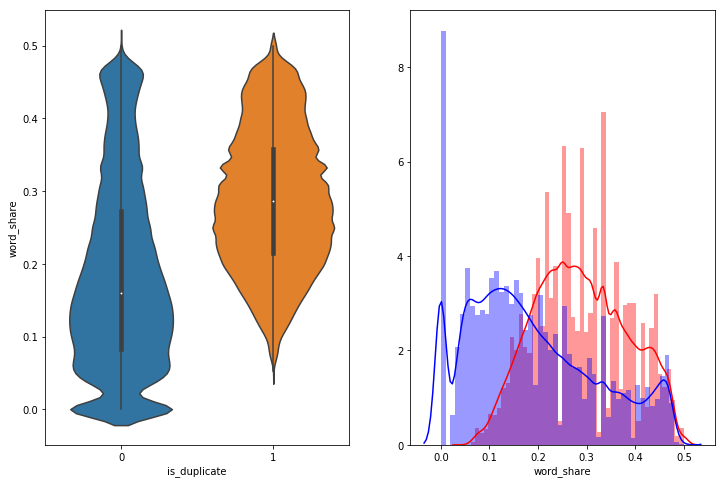

In [5]:
plt.figure(figsize=(12, 8))
plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'word_share', data = dataset[0:])
plt.subplot(1,2,2)
sns.distplot(dataset[dataset['is_duplicate'] == 1.0]['word_share'][0:] , label = "1", color = 'red')
sns.distplot(dataset[dataset['is_duplicate'] == 0.0]['word_share'][0:] , label = "0" , color = 'blue' )
plt.show()

- The distributions for normalized word_share have some overlap on the far right-hand side, i.e., there are quite a lot of questions with high word similarity
- The average word share and Common no. of words of qid1 and qid2 is more when they are duplicate(Similar)

<h3> 5.3 Feature: word_Common </h3>

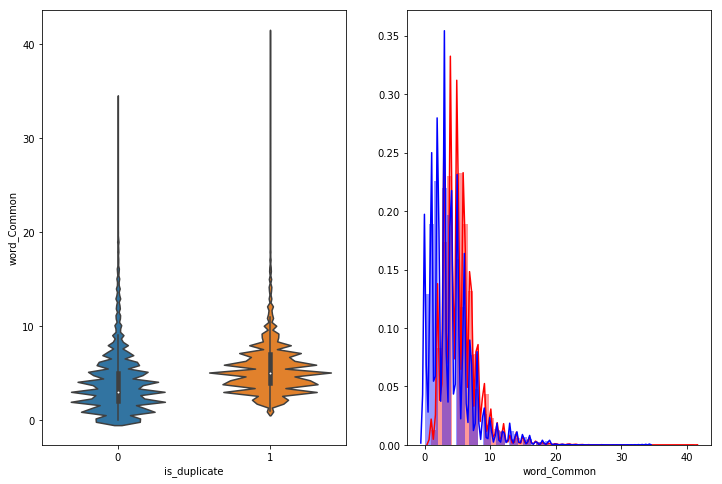

In [6]:
plt.figure(figsize=(12, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'word_Common', data = dataset[0:])

plt.subplot(1,2,2)
sns.distplot(dataset[dataset['is_duplicate'] == 1.0]['word_Common'][0:] , label = "1", color = 'red')
sns.distplot(dataset[dataset['is_duplicate'] == 0.0]['word_Common'][0:] , label = "0" , color = 'blue' )
plt.show()

<p> The distributions of the word_Common feature in similar and non-similar questions are highly overlapping. So word_Common alone cannot distinguish between the duplicate and non duplicate questions </p>

<h3> 5.4 Feature: word_Total </h3>

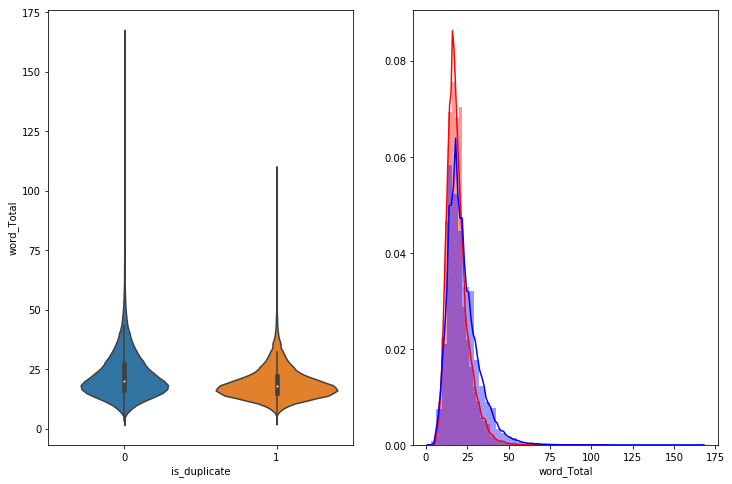

In [97]:
plt.figure(figsize=(12, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'word_Total', data = dataset[0:])

plt.subplot(1,2,2)
sns.distplot(dataset[dataset['is_duplicate'] == 1.0]['word_Total'][0:] , label = "1", color = 'red')
sns.distplot(dataset[dataset['is_duplicate'] == 0.0]['word_Total'][0:] , label = "0" , color = 'blue' )
plt.show()

The distribution of word_Total features for duplicate as well as non duplicate pairs of questions are heavily overlapping. This feature might not be the best of choice!

<h3> 5.5 Feature: q1len </h3>

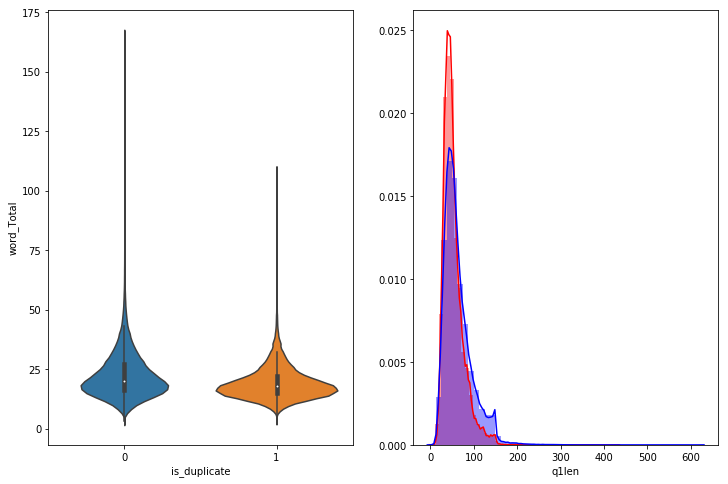

In [8]:
plt.figure(figsize=(12, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'word_Total', data = dataset[0:])

plt.subplot(1,2,2)
sns.distplot(dataset[dataset['is_duplicate'] == 1.0]['q1len'][0:] , label = "1", color = 'red')
sns.distplot(dataset[dataset['is_duplicate'] == 0.0]['q1len'][0:] , label = "0" , color = 'blue' )
plt.show()

The feature q1len is very overlapping for both the duplicate as well as non duplicate questions which suggests q1len alone cannot distinguish between the duplicate and the non duplicate questions. Also, we can see that the length of question 1 varies from 0 to a maximum of almost 200. This means most of the users posts questions which are less than 200 units of length.

<h3> 5.6 Feature: q2len </h3>

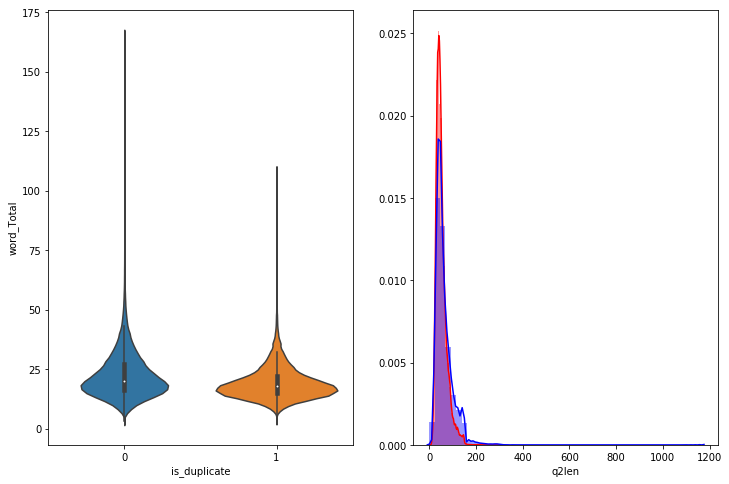

In [10]:
plt.figure(figsize=(12, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'word_Total', data = dataset[0:])

plt.subplot(1,2,2)
sns.distplot(dataset[dataset['is_duplicate'] == 1.0]['q2len'][0:] , label = "1", color = 'red')
sns.distplot(dataset[dataset['is_duplicate'] == 0.0]['q2len'][0:] , label = "0" , color = 'blue' )
plt.show()

The feature q2len is very overlapping for both the duplicate as well as non duplicate questions which suggests q1len alone cannot distinguish between the duplicate and the non duplicate questions. Also, we can see that the length of question 2 varies from 0 to a maximum of almost 200. This means most of the users posts questions which are less than 200 units of length.

<h3> 5.7 Draw pair plots for basic features:  'q1_n_words', 'q2_n_words', 'freq_q1-q2', 'freq_q1+q2','freq_qid1','freq_qid2'</h3>

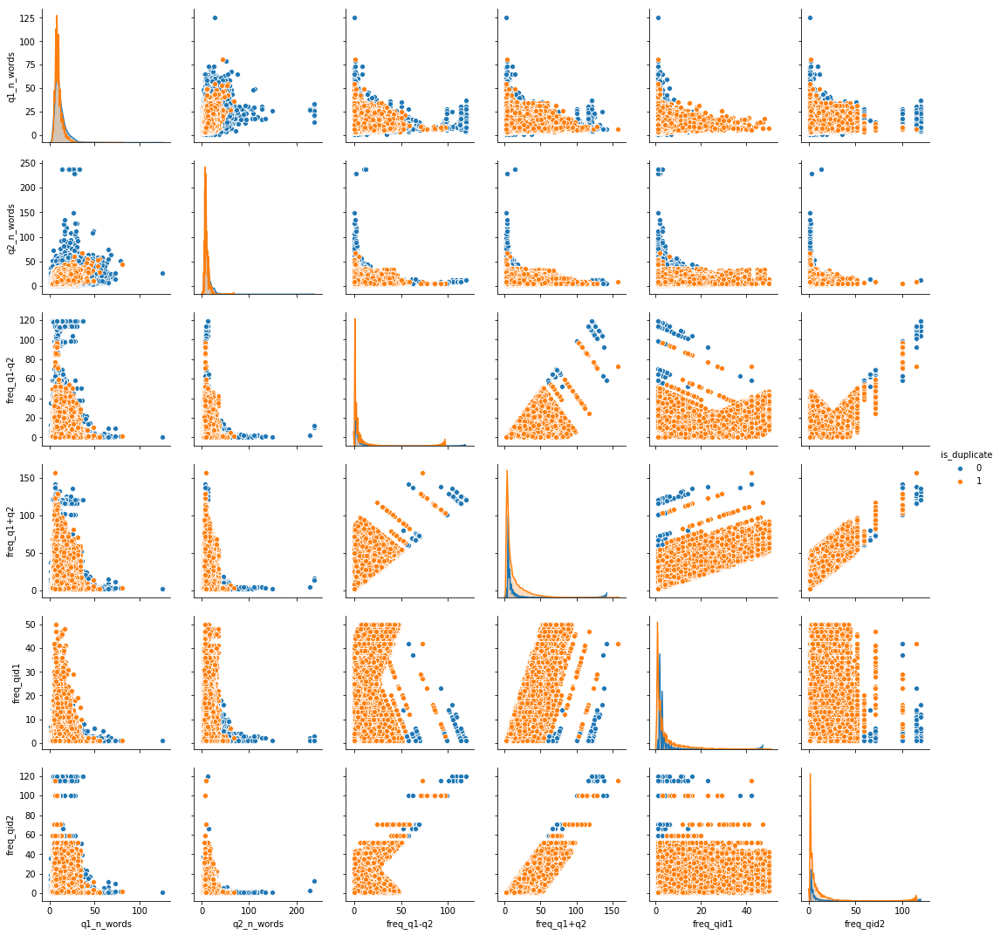

In [102]:
n = dataset.shape[0]
sns.pairplot(dataset[['q1_n_words', 'q2_n_words', 'freq_q1-q2', 'freq_q1+q2','freq_qid1','freq_qid2','is_duplicate']][0:n], hue='is_duplicate', vars=['q1_n_words', 'q2_n_words', 'freq_q1-q2', 'freq_q1+q2','freq_qid1','freq_qid2'])
plt.show()

### Observation:

1. From the above pair plot, we can see that some of the features are very useful in seperating the two classes (0 and 1). We can write simple if-else rules to classify the datapoints.
2. If we take a look at the distributions of each of these features, all of them are highly skewed towards the left. This suggests that the spread is very small. 
3. Some simple rule based systems we can write using the above pair plots are as follows: 

<p>a. if freq_qid2 < 60 and freq_q1+q2 <100, we can sya that it is more likely that the points belongs to the duplicate class.</p></br>
<p>b. if freq_qid1 > 10 and freq_q1+q2 < 50, the datapoint has a higher chance of belonging to the duplicate class. </p>


# 6. EDA: Advanced Feature Extraction.


In [2]:
#https://stackoverflow.com/questions/12468179/unicodedecodeerror-utf8-codec-cant-decode-byte-0x9c
if os.path.isfile('dataset_fe_without_preprocessing_train.csv'):
    dataset = pd.read_csv("dataset_fe_without_preprocessing_train.csv",encoding='latin-1')
    dataset = dataset.fillna('')
else:
    print("get dataset_fe_without_preprocessing_train.csv from drive or run the previous notebook")

<h2> 6.1. Preprocessing of Text </h2>

- Preprocessing:
    - Removing html tags 
    - Removing Punctuations
    - Performing stemming
    - Removing Stopwords
    - Expanding contractions etc.

In [13]:
def preprocess(x):
    x = str(x).lower()
    x = x.replace(",000,000", "m").replace(",000", "k").replace("′", "'").replace("’", "'")\
                           .replace("won't", "will not").replace("cannot", "can not").replace("can't", "can not")\
                           .replace("n't", " not").replace("what's", "what is").replace("it's", "it is")\
                           .replace("'ve", " have").replace("i'm", "i am").replace("'re", " are")\
                           .replace("he's", "he is").replace("she's", "she is").replace("'s", " own")\
                           .replace("%", " percent ").replace("₹", " rupee ").replace("$", " dollar ")\
                           .replace("€", " euro ").replace("'ll", " will")
    x = re.sub(r"([0-9]+)000000", r"\1m", x)
    x = re.sub(r"([0-9]+)000", r"\1k", x)
    
    
    porter = PorterStemmer()
    pattern = re.compile('\W')
    
    if type(x) == type(''):
        x = re.sub(pattern, ' ', x)
    
    
    if type(x) == type(''):
        x = porter.stem(x)
        example1 = BeautifulSoup(x)
        x = example1.get_text()
    return x

- Function to Compute and get the features : With 2 parameters of Question 1 and Question 2

<h2> 6.2. Advanced Feature Extraction (NLP and Fuzzy Features) </h2>

Definition:
- __Token__: You get a token by splitting sentence a space
- __Stop_Word__ : stop words as per NLTK.
- __Word__ : A token that is not a stop_word


Features:
- __cwc_min__ :  Ratio of common_word_count to min length of word count of Q1 and Q2 <br>cwc_min = common_word_count / (min(len(q1_words), len(q2_words))
<br>
<br>
- __cwc_max__ :  Ratio of common_word_count to max length of word count of Q1 and Q2 <br>cwc_max = common_word_count / (max(len(q1_words), len(q2_words))
<br>
<br>
- __csc_min__ :  Ratio of common_stop_count to min length of stop count of Q1 and Q2 <br> csc_min = common_stop_count / (min(len(q1_stops), len(q2_stops))
<br>
<br>
- __csc_max__ :  Ratio of common_stop_count to max length of stop count of Q1 and Q2<br>csc_max = common_stop_count / (max(len(q1_stops), len(q2_stops))
<br>
<br>
- __ctc_min__ :  Ratio of common_token_count to min length of token count of Q1 and Q2<br>ctc_min = common_token_count / (min(len(q1_tokens), len(q2_tokens))
<br>
<br>

- __ctc_max__ :  Ratio of common_token_count to max length of token count of Q1 and Q2<br>ctc_max = common_token_count / (max(len(q1_tokens), len(q2_tokens))
<br>
<br>
        
- __last_word_eq__ :  Check if First word of both questions is equal or not<br>last_word_eq = int(q1_tokens[-1] == q2_tokens[-1])
<br>
<br>

- __first_word_eq__ :  Check if First word of both questions is equal or not<br>first_word_eq = int(q1_tokens[0] == q2_tokens[0])
<br>
<br>
        
- __abs_len_diff__ :  Abs. length difference<br>abs_len_diff = abs(len(q1_tokens) - len(q2_tokens))
<br>
<br>

- __mean_len__ :  Average Token Length of both Questions<br>mean_len = (len(q1_tokens) + len(q2_tokens))/2
<br>
<br>


- __fuzz_ratio__ :  https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>

- __fuzz_partial_ratio__ :  https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>


- __token_sort_ratio__ : https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>


- __token_set_ratio__ : https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>





- __longest_substr_ratio__ :  Ratio of length longest common substring to min length of token count of Q1 and Q2<br>longest_substr_ratio = len(longest common substring) / (min(len(q1_tokens), len(q2_tokens))


In [9]:
# To get the results in 4 decimal points
SAFE_DIV = 0.0001 

STOP_WORDS = stopwords.words("english")

def get_token_features(q1, q2):
    token_features = [0.0]*10
    
    # Converting the Sentence into Tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()

    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return token_features
    
    # Get the non-stopwords in Questions
    q1_words = set([word for word in q1_tokens if word not in STOP_WORDS])
    q2_words = set([word for word in q2_tokens if word not in STOP_WORDS])
    
    #Get the stopwords in Questions
    q1_stops = set([word for word in q1_tokens if word in STOP_WORDS])
    q2_stops = set([word for word in q2_tokens if word in STOP_WORDS])
    
    # Get the common non-stopwords from Question pairs
    common_word_count = len(q1_words.intersection(q2_words))
    
    # Get the common stopwords from Question pair
    common_stop_count = len(q1_stops.intersection(q2_stops))
    
    # Get the common Tokens from Question pair
    common_token_count = len(set(q1_tokens).intersection(set(q2_tokens)))
    
    token_features[0] = common_word_count / (min(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[1] = common_word_count / (max(len(q1_words), len(q2_words)) + SAFE_DIV)
    token_features[2] = common_stop_count / (min(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[3] = common_stop_count / (max(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    token_features[4] = common_token_count / (min(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    token_features[5] = common_token_count / (max(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    
    # Last word of both question is same or not
    token_features[6] = int(q1_tokens[-1] == q2_tokens[-1])
    
    # First word of both question is same or not
    token_features[7] = int(q1_tokens[0] == q2_tokens[0])
    
    token_features[8] = abs(len(q1_tokens) - len(q2_tokens))
    
    #Average Token Length of both Questions
    token_features[9] = (len(q1_tokens) + len(q2_tokens))/2
    return token_features

# get the Longest Common sub string
def get_longest_substr_ratio(a, b):
    strs = list(distance.lcsubstrings(a, b)) #lcsubstrings("sedentar", "dentist") --> {'dent'}
    if len(strs) == 0:
        return 0
    else:
        return len(strs[0]) / (min(len(a), len(b)) + 1)

def extract_features(dataset):
    # preprocessing each question
    dataset["question1"] = dataset["question1"].fillna("").apply(preprocess)
    dataset["question2"] = dataset["question2"].fillna("").apply(preprocess)

    print("token features...")
    
    # Merging Features with dataset
    
    token_features = dataset.apply(lambda x: get_token_features(x["question1"], x["question2"]), axis=1)
    
    dataset["cwc_min"]       = list(map(lambda x: x[0], token_features))
    dataset["cwc_max"]       = list(map(lambda x: x[1], token_features))
    dataset["csc_min"]       = list(map(lambda x: x[2], token_features))
    dataset["csc_max"]       = list(map(lambda x: x[3], token_features))
    dataset["ctc_min"]       = list(map(lambda x: x[4], token_features))
    dataset["ctc_max"]       = list(map(lambda x: x[5], token_features))
    dataset["last_word_eq"]  = list(map(lambda x: x[6], token_features))
    dataset["first_word_eq"] = list(map(lambda x: x[7], token_features))
    dataset["abs_len_diff"]  = list(map(lambda x: x[8], token_features))
    dataset["mean_len"]      = list(map(lambda x: x[9], token_features))
   
    #Computing Fuzzy Features and Merging with Dataset
    
    # do read this blog: http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
    # https://stackoverflow.com/questions/31806695/when-to-use-which-fuzz-function-to-compare-2-strings
    # https://github.com/seatgeek/fuzzywuzzy
    print("fuzzy features...")

    dataset["token_set_ratio"]       = dataset.apply(lambda x: fuzz.token_set_ratio(x["question1"], x["question2"]), axis=1)
    # The token sort approach involves tokenizing the string in question, sorting the tokens alphabetically, and 
    # then joining them back into a string We then compare the transformed strings with a simple ratio().
    dataset["token_sort_ratio"]      = dataset.apply(lambda x: fuzz.token_sort_ratio(x["question1"], x["question2"]), axis=1)
    dataset["fuzz_ratio"]            = dataset.apply(lambda x: fuzz.QRatio(x["question1"], x["question2"]), axis=1)
    dataset["fuzz_partial_ratio"]    = dataset.apply(lambda x: fuzz.partial_ratio(x["question1"], x["question2"]), axis=1)
    dataset["longest_substr_ratio"]  = dataset.apply(lambda x: get_longest_substr_ratio(x["question1"], x["question2"]), axis=1)
    return dataset

In [10]:
if os.path.isfile('dataset_advance_features_preprocessed_train.csv'):
    dataset.fillna('')
    dataset = pd.read_csv("dataset_advance_features_preprocessed_train.csv",encoding='latin-1')
    
else:
    print("Extracting features for train:")
    dataset = pd.read_csv("train.csv")
    dataset = extract_features(dataset)
    dataset.to_csv("dataset_advance_features_preprocessed_train.csv", index=False)
    
dataset.head()

,id,qid1,qid2,question1,question2,is_duplicate,cwc_min,cwc_max,csc_min,csc_max,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio
0,0,1,2,what is the step by step guide to invest in sh...,what is the step by step guide to invest in sh...,0,0.999980,0.833319,0.999983,0.999983,...,0.785709,0.0,1.0,2.0,13.0,100,93,93,100,0.982759
1,1,3,4,what is the story of kohinoor koh i noor dia...,what would happen if the indian government sto...,0,0.799984,0.399996,0.749981,0.599988,...,0.466664,0.0,1.0,5.0,12.5,86,63,66,75,0.596154
2,2,5,6,how can i increase the speed of my internet co...,how can internet speed be increased by hacking...,0,0.399992,0.333328,0.399992,0.249997,...,0.285712,0.0,1.0,4.0,12.0,63,63,43,47,0.166667
3,3,7,8,why am i mentally very lonely how can i solve...,find the remainder when math 23 24 math i...,0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,2.0,12.0,28,24,9,14,0.039216
4,4,9,10,which one dissolve in water quikly sugar salt...,which fish would survive in salt water,0,0.399992,0.199998,0.999950,0.666644,...,0.307690,0.0,1.0,6.0,10.0,67,47,35,56,0.175000


<h3>6.3. Analysis of advance extracted features </h3>

<h4> 6.3.1 Plotting Word clouds</h4>

- Creating Word Cloud of Duplicates and Non-Duplicates Question pairs
- We can observe the most frequent occuring words

In [6]:
if os.path.isfile('dataset_advance_features_preprocessed_train.csv'):
    dataset = pd.read_csv("dataset_advance_features_preprocessed_train.csv",encoding='latin-1')
    dataset.fillna('')

dataset_duplicate = dataset[dataset['is_duplicate'] == 1]
dataset_nonduplicate = dataset[dataset['is_duplicate'] == 0]

# Converting 2d array of q1 and q2 and flatten the array: like {{1,2},{3,4}} to {1,2,3,4}
p = np.dstack([dataset_duplicate["question1"], dataset_duplicate["question2"]]).flatten()
n = np.dstack([dataset_nonduplicate["question1"], dataset_nonduplicate["question2"]]).flatten()

print ("Number of data points in class 1 (question duplicate pairs) :",len(p))
print ("Number of data points in class 0 (question non-duplicate pairs) :",len(n))

#Saving the np array into a text file
np.savetxt('train_p.txt', p, delimiter=' ', fmt='%s')
np.savetxt('train_n.txt', n, delimiter=' ', fmt='%s')

Number of data points in class 1 (question duplicate pairs) : 298526
Number of data points in class 0 (question non-duplicate pairs) : 510054


In [14]:
# reading the text files and removing the Stop Words:
d = path.dirname('.')

textp_w = open(path.join(d, 'train_p.txt')).read()
textn_w = open(path.join(d, 'train_n.txt')).read()

stopwords = set(STOPWORDS)
stopwords.add("said")
stopwords.add("br")
stopwords.add(" ")
stopwords.remove("not")
stopwords.remove("no")
stopwords.remove("like")
#stopwords.remove("!")
print ("Total number of words in duplicate pair questions :",len(textp_w))
print ("Total number of words in non duplicate pair questions :",len(textn_w))

Total number of words in duplicate pair questions : 16110763
Total number of words in non duplicate pair questions : 33201102


### 6.3.2. Word Clouds generated from  duplicate pair question's text 

Word Cloud for Duplicate Question pairs


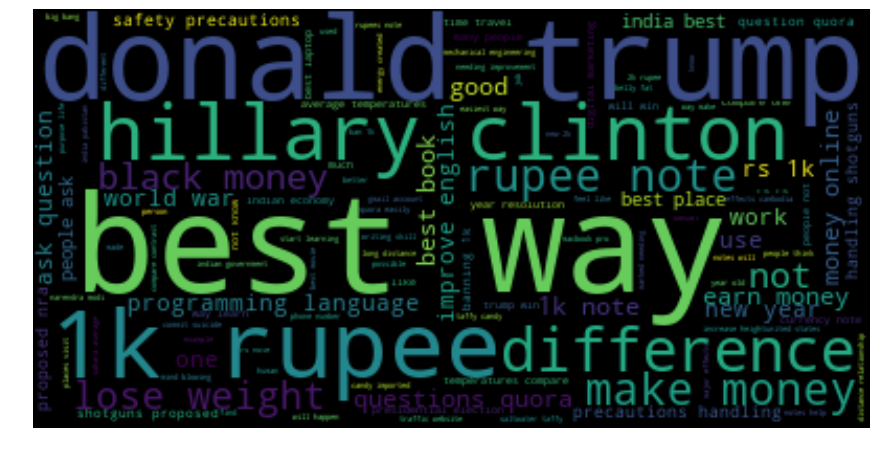

In [15]:
wc = WordCloud(background_color="black", max_words=len(textp_w), stopwords=stopwords)
wc.generate(textp_w)
print ("Word Cloud for Duplicate Question pairs")
plt.figure(figsize=(15,10))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

We see 'donald trump' is the most talked about subject in the duplicate questions category, followed by some of the words like 'best way', there are a lot of duplicte questions related to 'loosing weight', 'hillary clinton' etc. 

### 6.3.3. Word Clouds generated from non duplicate pair question's text 

Word Cloud for non-Duplicate Question pairs:


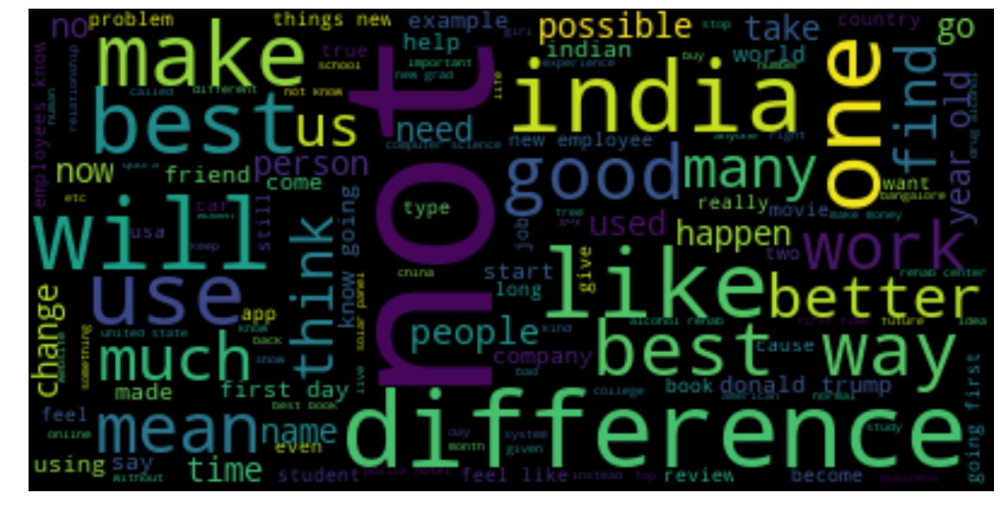

In [16]:
wc = WordCloud(background_color="black", max_words=len(textn_w),stopwords=stopwords)
# generate word cloud
wc.generate(textn_w)
print ("Word Cloud for non-Duplicate Question pairs:")
plt.figure(figsize=(20,12))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

<h2> 7.1 Pair plot of advance features ['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio'] </h2>

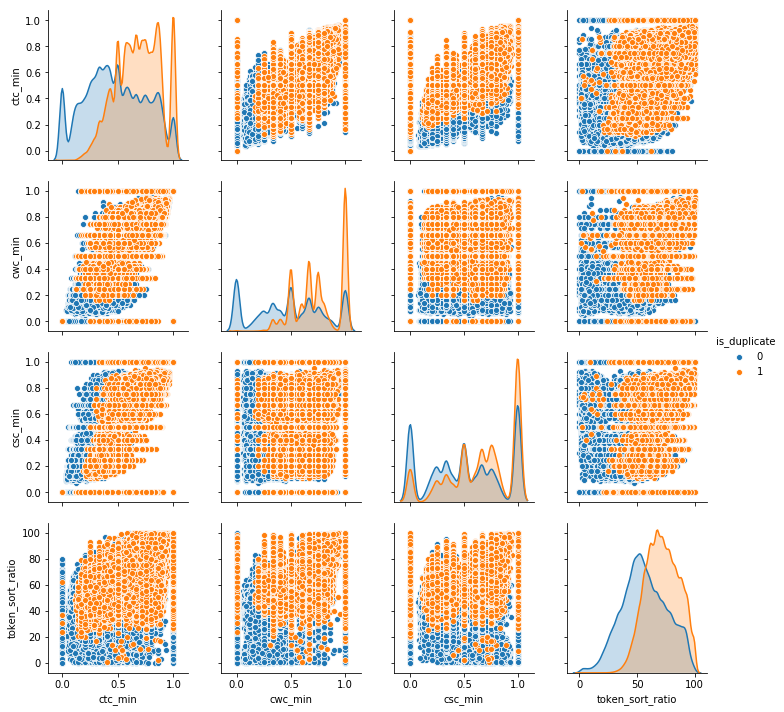

In [21]:
n = dataset.shape[0]
sns.pairplot(dataset[['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio', 'is_duplicate']][0:n], hue='is_duplicate', vars=['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio'])
plt.show()

Here by looking at the PDFs and scatter plots we can clearly see that the feature token_sort_ratio is well seperable from rest of the features! 'ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio' are indeed good features as they are able to partially seperate the duplicate and non duplicate questions. From the above pair plot we can come up with few conlusions. 

1. By looking at the 'ctc_min' distribution we can see that both the distibutions (for duplicate as well as non duplicate questions), the questions tends to be duplicate of one another as the value of 'ctc_min' increases. This means 'ctc_min' can partially seperate both the classes. This suggests that it's a good feature.

2. By looking at the 'cwc_min' distribution we can see that both the distibutions (for duplicate as well as non duplicate questions), the questions tends to be duplicate of one another as the value of 'cwc_min' increases. This means 'cwc_min' can partially seperate both the classes. This suggests that it's a good feature.

3. If we take a closer look at the distibutions of feature 'csc_min', we can see that the two classes are completely overlapping. There is no strict rule to seperate the two classes (duplicate or not) solely based on this feature.

4. 'token_sort_ratio' seperates the two classes partially. In general, as the value of 'toke_sort_ration' becomes higher, there is a higher chance of two questions being duplicate of one another.

<h2> 7.2 Pair plot of advance features ['cwc_max', 'csc_max', 'ctc_max', 'last_word_eq', 'first_word_eq', 'abs_len_diff', 'mean_len'] </h2>

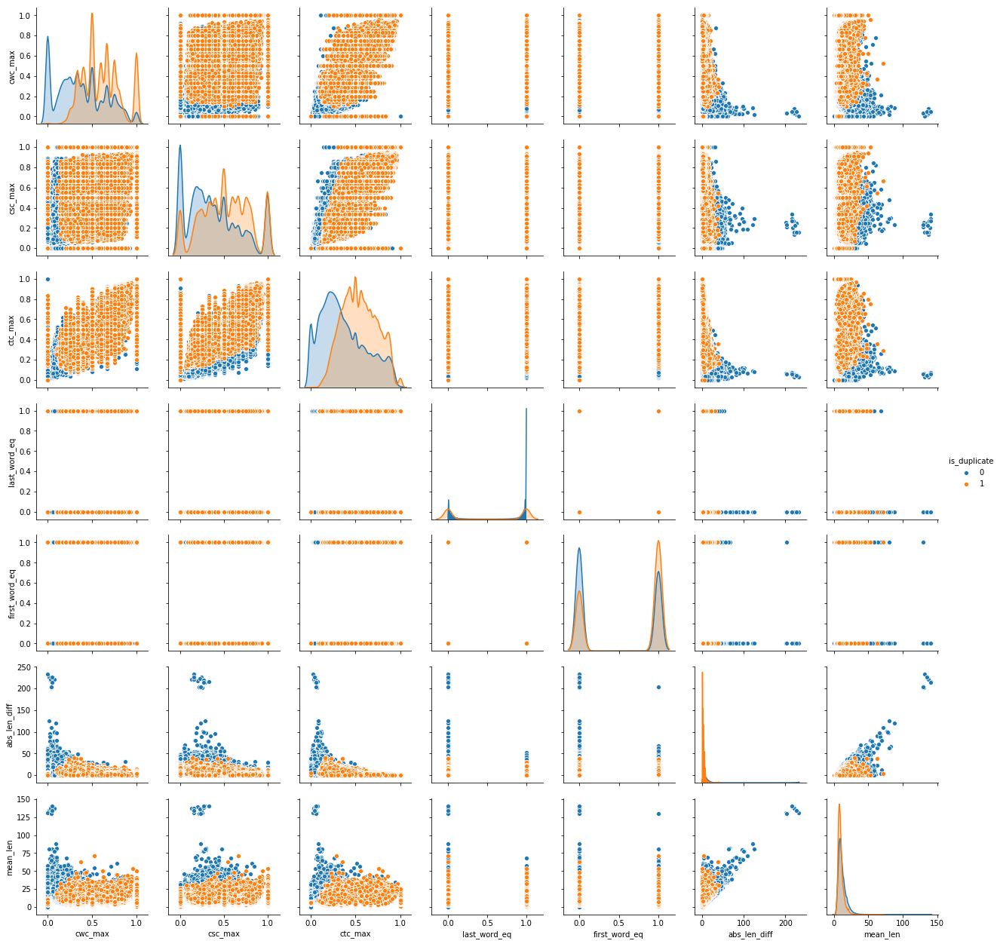

In [27]:
n = dataset.shape[0]
sns.pairplot(dataset[['cwc_max', 'csc_max', 'ctc_max', 'last_word_eq', 'first_word_eq', 'abs_len_diff', 'mean_len', 'is_duplicate']][0:n], hue='is_duplicate', vars=['cwc_max', 'csc_max', 'ctc_max', 'last_word_eq', 'first_word_eq', 'abs_len_diff', 'mean_len'])
plt.show()

1. By looking at the histogram generated by 'cwc_max', we can say that it can partially seperate the class values. In general as the value of 'cwc_max' increases there is a higher tendency of questions becoming duplicates of one another.
2. 'csc_max' alone cannot distinguish between the class labels that much. By looking at the histogram, we find that the two class distributions are overlapping. However, 'csc_max' vs 'mean_len' scatter plot suggests that the two classes can be well seperated by a simple if-else condition, i.e if mean_len > 50 there is a higher chance of two questions being duplicate of one another.
3. 'mean_len', 'abs_len_diff','first_word_eq', 'last_word_eq' are not very robust features when it comes to single handedly seperating both the classes. As we can see from each of their histograms, the classes are highly overlapping. 
4. 'ctc_max' vs 'mean_len' scatter plot can seperate both the classes using simple if-else conditions. We can say if ctc_max is strictly > 0.25 and 'mean_len' is strictly < 50, there is a higher chance of a data point belonging to the duplicate class.

<h2> 7.3 Pair plot of fuzzy features ['fuzz_ratio', 'fuzz_partial_ratio', 'longest_substr_ratio', 'token_sort_ratio'] </h2>

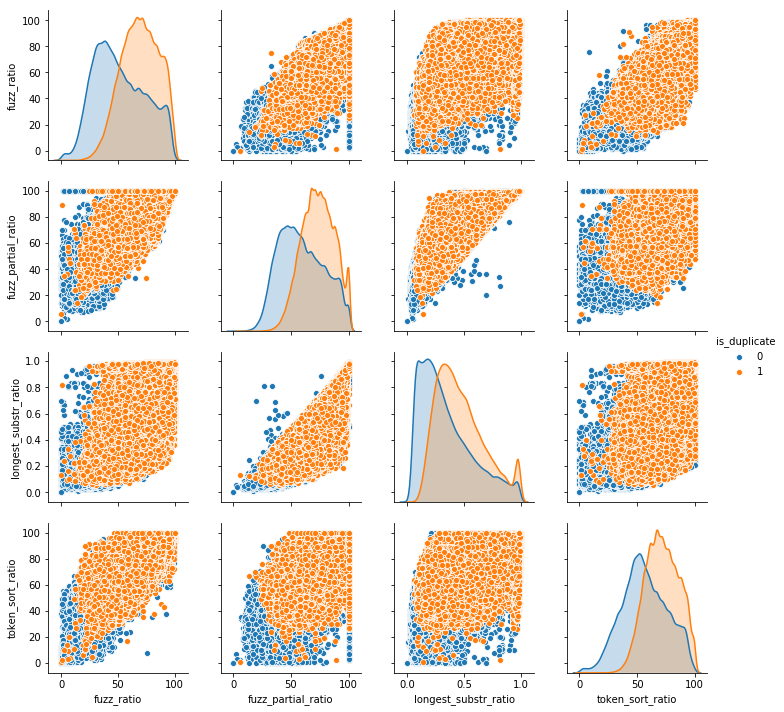

In [26]:
n = dataset.shape[0]
sns.pairplot(dataset[['fuzz_ratio', 'fuzz_partial_ratio', 'longest_substr_ratio', 'token_sort_ratio', 'is_duplicate']][0:n], hue='is_duplicate', vars=['fuzz_ratio', 'fuzz_partial_ratio', 'longest_substr_ratio', 'token_sort_ratio'])
plt.show()

Here by looking at the PDFs and scatter plots we can clearly see that the feature token_sort_ratio is well seperable from rest of the features! 'ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio' are indeed good features as they are able to partially seperate the duplicate and non duplicate questions. From the above pair plot we can come up with few conlusions. 

1. By looking at the 'fuzz_ratio' distribution we can see that both the distibutions (for duplicate as well as non duplicate questions), the questions tends to be duplicate of one another as the value of 'fuzz_ratio' increases. This means 'fuzz_ratio' can alone partially seperate both the classes. This suggests that it's a good feature.

2. By looking at the 'fuzz_partial_ratio' distribution we can see that both the distibutions (for duplicate as well as non duplicate questions), the questions tends to be duplicate of one another as the value of 'fuzz_partial_ratio' increases. This means 'fuzz_partial_ratio' can alone partially seperate both the classes which suggests that it's a good feature.

3. 'longest_substr_ratio' also seperates the two classes partially. In general, as the value of 'longest_substr_ratio' increases, the questions tends to duplicates of one another. 

4. 'token_sort_ratio' seperates the two classes partially. In general, as the value of 'toke_sort_ration' becomes higher, there is a higher chance of two questions being duplicate of one another.

5. For the scatter plot of 'fuzz_ratio' and 'longest_substr_ratio' we can see that the two classes can be easily seperated by using a simple if-else condition. If 'fuzz_ratio' > 50, we can mostly say that the questions are duplicates. 

6. 'token_sort_ratio' vs 'longest_substr_ratio' can also seperate the two classes based on simple if-else conditions. We can clearly say if token_sort_ratio > 45, there is a higher likelihood of questions becoming duplicates of one another.

7. for 'token_sort_ratio. vs 'fuzz_partial_ratio' we can say if token_sort_ratio > 30 and  fuzz_partial_ratio > 40, the questions are most likely  duplicates of one another. 

### 8.1. Distribution of the token_sort_ratio

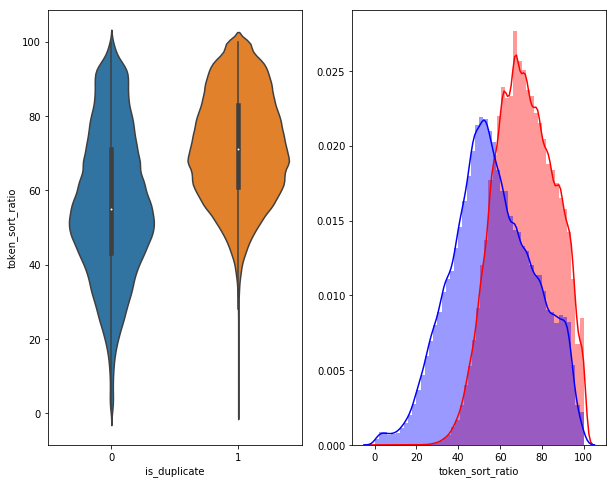

In [20]:
plt.figure(figsize=(10, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'token_sort_ratio', data = dataset[0:] , )

plt.subplot(1,2,2)
sns.distplot(dataset[dataset['is_duplicate'] == 1.0]['token_sort_ratio'][0:] , label = "1", color = 'red')
sns.distplot(dataset[dataset['is_duplicate'] == 0.0]['token_sort_ratio'][0:] , label = "0" , color = 'blue' )
plt.show()

The percentile ranges in the violin plot is also not very clearly seperable. The 75% percentile of token_sort_ratio in determining duplicates points coincides with the 25% percentile of the other class. This means the model will have a chance of making 25% error when it will try to predict a new data as duplicate or not solely based on this feature. Here we have a slight overlap between the distributions. But in general, we see as the token_sort_ration increases the tendency of the questions to be similar increases.

### 8.2. Distribution of the fuzz_ratio

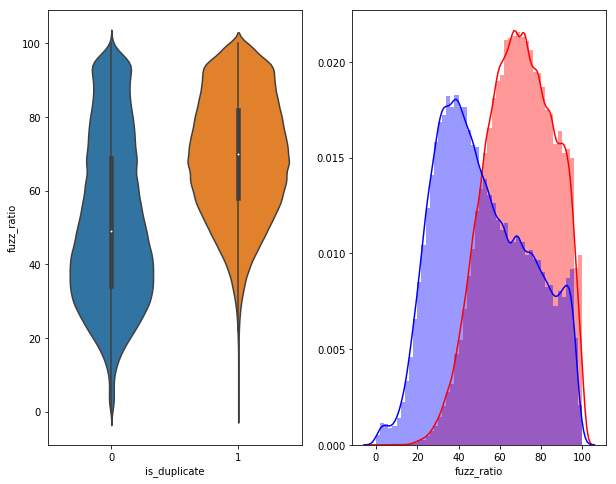

In [19]:
plt.figure(figsize=(10, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'fuzz_ratio', data = dataset[0:] , )

plt.subplot(1,2,2)
sns.distplot(dataset[dataset['is_duplicate'] == 1.0]['fuzz_ratio'][0:] , label = "1", color = 'red')
sns.distplot(dataset[dataset['is_duplicate'] == 0.0]['fuzz_ratio'][0:] , label = "0" , color = 'blue' )
plt.show()

Here again the same thing, the percentile ranges in the violin plot is also not very clearly seperable. The 75% percentile of 'fuzz_ratio' in determining duplicates points coincides with the 25% percentile of the other class. This means the model will have a chance of making 25% error when it will try to predict a new data as duplicate or not solely based on this feature. 
'fuzz_ratio' partially sperates the duplicate and non-duplicate classes. They are neither completely overlapping nor completely seperable. In general, we notice that as the value of 'fuzz_ratio' increases, the tendency of questions being duplicates of one another increases.

### 8.3. Distribution of the fuzz_partial_ratio

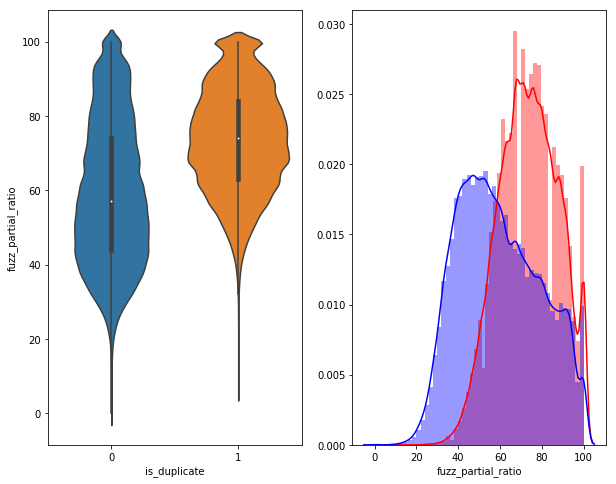

In [111]:
plt.figure(figsize=(10, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'fuzz_partial_ratio', data = dataset[0:] , )

plt.subplot(1,2,2)
sns.distplot(dataset[dataset['is_duplicate'] == 1.0]['fuzz_partial_ratio'][0:] , label = "1", color = 'red')
sns.distplot(dataset[dataset['is_duplicate'] == 0.0]['fuzz_partial_ratio'][0:] , label = "0" , color = 'blue' )
plt.show()

Here also, we see the overlapping of the percentiles. 'fuzz_partial_ratio' distirbutions are overlapping for the two classes. So there is not a concrete way to seperate the two classes. However, as wee see above, if the 'fuzz_partial_ratio' value is higher, more often than not the questions tends to be duplicate. If the PDF of 'fuzz_partial_ratio' higher than 0.020 we can mostly say that the questions are duplicates.

### 8.4. Distribution of the longest_substr_ratio

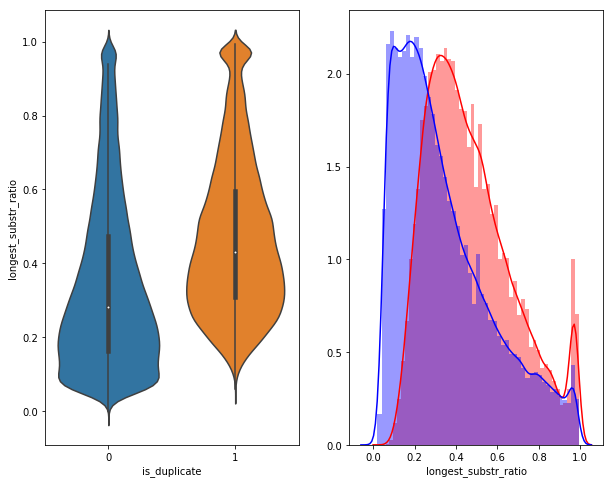

In [112]:
plt.figure(figsize=(10, 8))

plt.subplot(1,2,1)
sns.violinplot(x = 'is_duplicate', y = 'longest_substr_ratio', data = dataset[0:] , )

plt.subplot(1,2,2)
sns.distplot(dataset[dataset['is_duplicate'] == 1.0]['longest_substr_ratio'][0:] , label = "1", color = 'red')
sns.distplot(dataset[dataset['is_duplicate'] == 0.0]['longest_substr_ratio'][0:] , label = "0" , color = 'blue' )
plt.show()

'fuzz_partial_ratio' distirbutions are overlapping for the two classes. So there is not a concrete way to seperate the two classes. However, as wee see above, if the 'fuzz_partial_ratio' value is higher, more often than not the questions tends to be duplicate.

<h3> 9. Data Visualization </h3>

### 9.1 Using TSNE for Dimentionality reduction on the advance features

In [116]:
# Using TSNE for Dimentionality reduction for 15 Features(Generated after cleaning the data) to 3 dimention

from sklearn.preprocessing import MinMaxScaler

dfp_subsampled = dataset.sample(n=10000, random_state=0)
X = MinMaxScaler().fit_transform(dfp_subsampled[['cwc_min', 'cwc_max', 'csc_min', 'csc_max' , 'ctc_min' , 'ctc_max' , 'last_word_eq', 'first_word_eq' , 'abs_len_diff' , 'mean_len' , 'token_set_ratio' , 'token_sort_ratio' ,  'fuzz_ratio' , 'fuzz_partial_ratio' , 'longest_substr_ratio']])
y = dfp_subsampled['is_duplicate'].values


T-SNE Plot for perplexity = 5


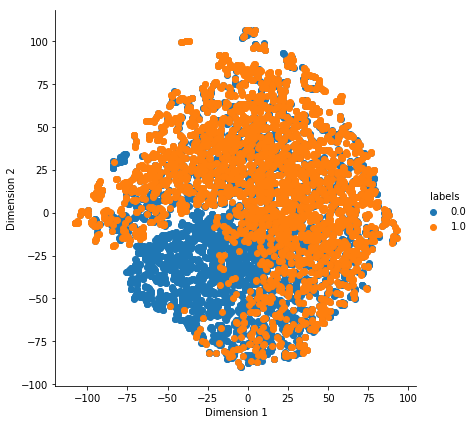


T-SNE Plot for perplexity = 30


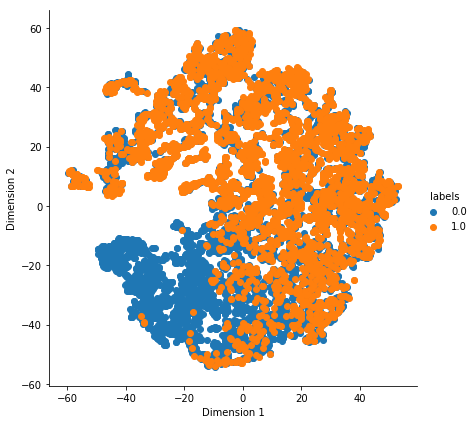


T-SNE Plot for perplexity = 40


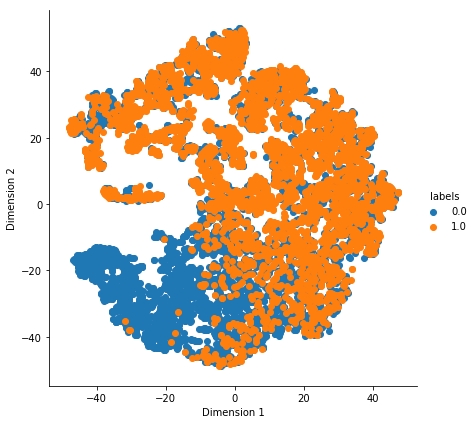


T-SNE Plot for perplexity = 50


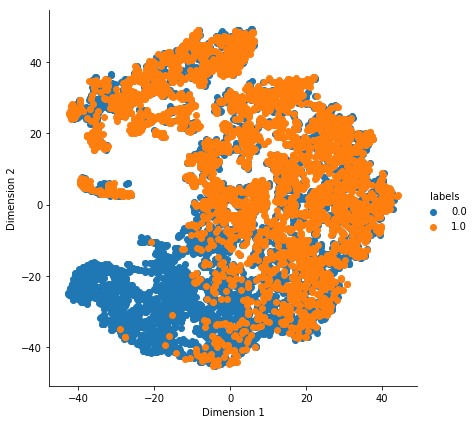


T-SNE Plot for perplexity = 100


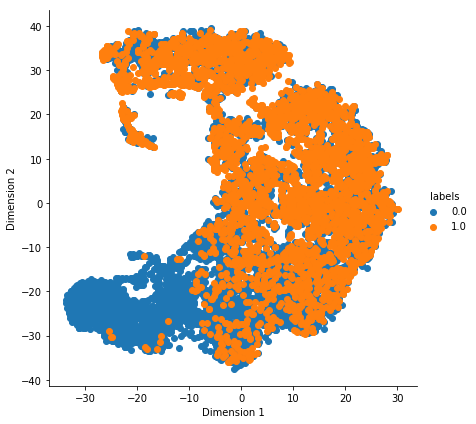


T-SNE Plot for perplexity = 500


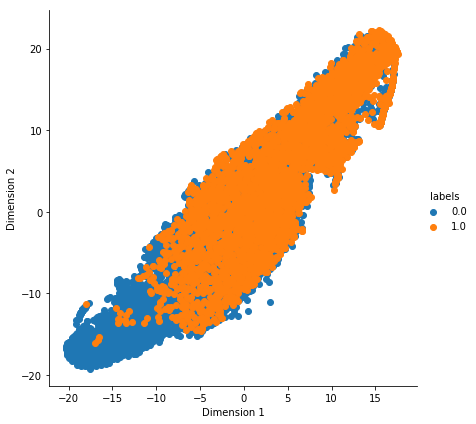

In [119]:
from MulticoreTSNE import MulticoreTSNE as TSNE
def tsne(dataset, labels, perplexity):
    '''This function is used to plot the t-sne for any input dataset using their corresponding class labels,
    using two dimensions.'''
    #TSNE for cleaned data, #10000 data points
    
    #Starting TSNE dataset transform
    model = TSNE(n_components=2, init='random', random_state=0, verbose=2, n_jobs=-1, angle=0.5, method='barnes_hut', perplexity=perplexity, n_iter=2000)
    tsne_data = model.fit_transform(dataset)

    #Creating a new data frame which help us in ploting the result data
    tsne_data = np.vstack((tsne_data.T, labels)).T
    tsne_df = pd.DataFrame(data=tsne_data, columns=("Dimension 1", "Dimension 2", "labels"))
    
    #Info
    print("\nT-SNE Plot for perplexity = {}".format(perplexity))
    
    # Ploting the result of tsne
    sns.FacetGrid(tsne_df, hue="labels", height=6).map(plt.scatter, 'Dimension 1', 'Dimension 2').add_legend()
    plt.show()
    
sampled_dataset=dataset.sample(n=10000, random_state=0)
X = sampled_dataset[['cwc_min', 'cwc_max', 'csc_min', 'csc_max' , 'ctc_min' , 'ctc_max' , 'last_word_eq', 'first_word_eq' , 'abs_len_diff' , 'mean_len' , 'token_set_ratio' , 'token_sort_ratio' ,  'fuzz_ratio' , 'fuzz_partial_ratio' , 'longest_substr_ratio']]
y = sampled_dataset['is_duplicate'].values

#PLot TSNE Using various values of Perplexity
tsne(X, y, 5)
tsne(X, y, 30)
tsne(X, y, 40)
tsne(X, y, 50)
tsne(X, y, 100)
tsne(X, y, 500)

As can be seen from the above plots, the features are partially seperable. However, there is a significant amount of overlap. As the perplexity increases, the data becomes slightly more seperated. This can be explained by the fact that as the perplexity increases the number of neigbourhood distances that are preserved also increases.

### 9.2 Using TSNE (2D) for Dimentionality reduction on the advance features

In [24]:
def tsne_2d_lmplot(p):
    print("T-SNE with perplexity = {}".format(p))
    tsne2d = TSNE(n_components=2,perplexity=p,init='random', 
                  random_state=101,method='barnes_hut',
                  n_iter=1000,verbose=2,angle=0.5,n_jobs=-1).fit_transform(X)
    dataset = pd.DataFrame({'x':tsne2d[:,0], 'y':tsne2d[:,1] ,'label':y})
    # draw the plot in appropriate place in the grid
    sns.lmplot(data=dataset, x='x', y='y', hue='label', fit_reg=False, height=8,palette="Set1",markers=['s','o'])
    plt.title("perplexity : {} and max_iter : {}".format(p, 1000))
    plt.show()

T-SNE with perplexity = 5


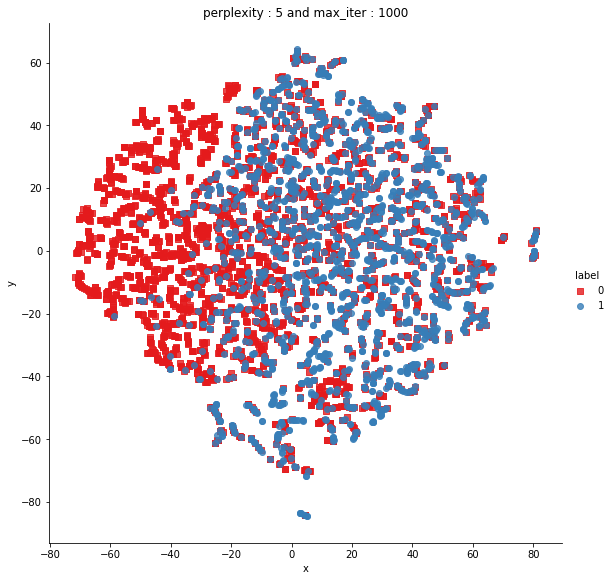

T-SNE with perplexity = 15


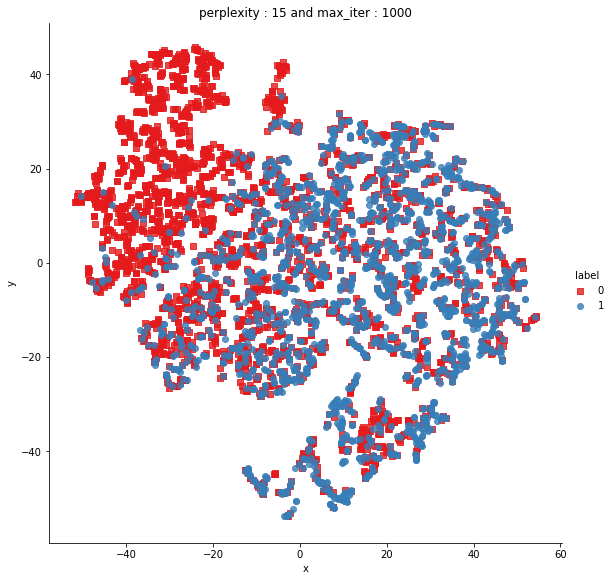

T-SNE with perplexity = 30


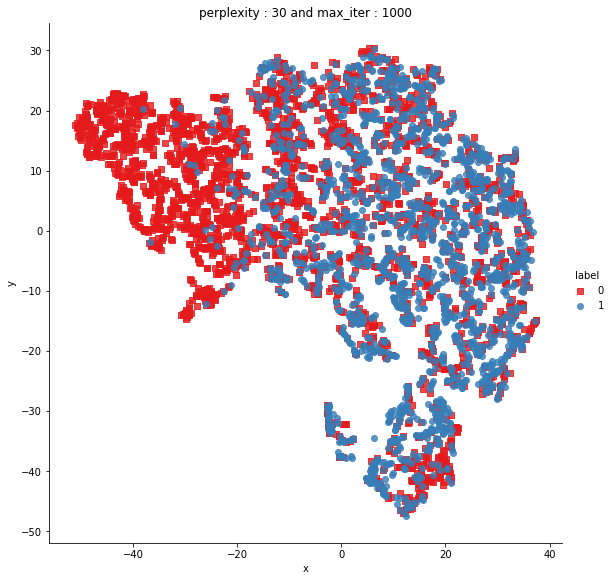

T-SNE with perplexity = 50


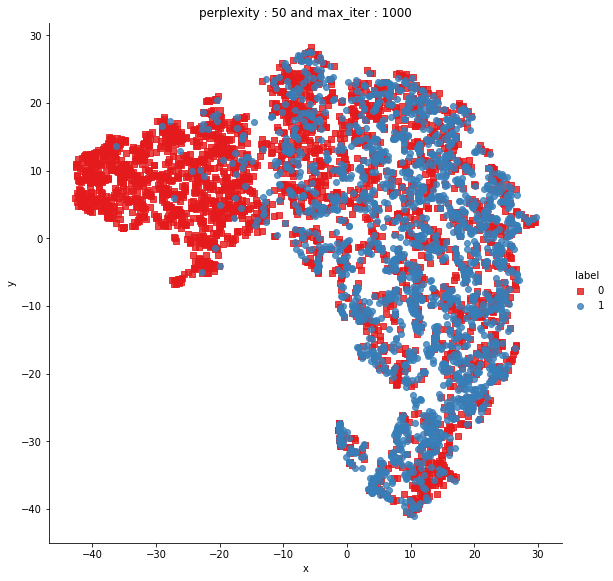

T-SNE with perplexity = 100


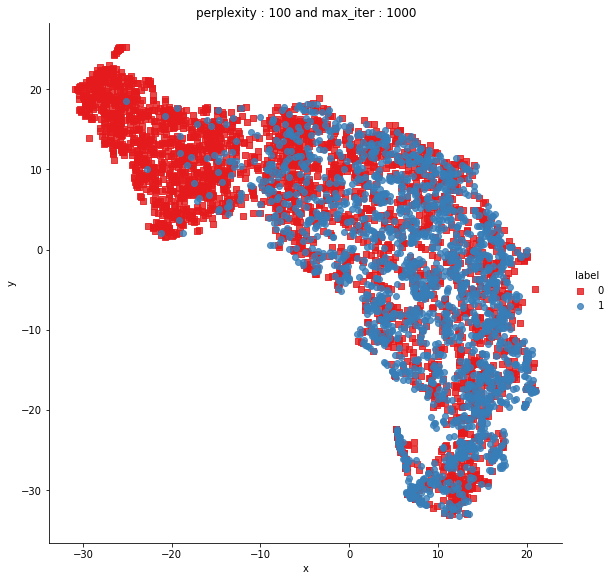

T-SNE with perplexity = 250


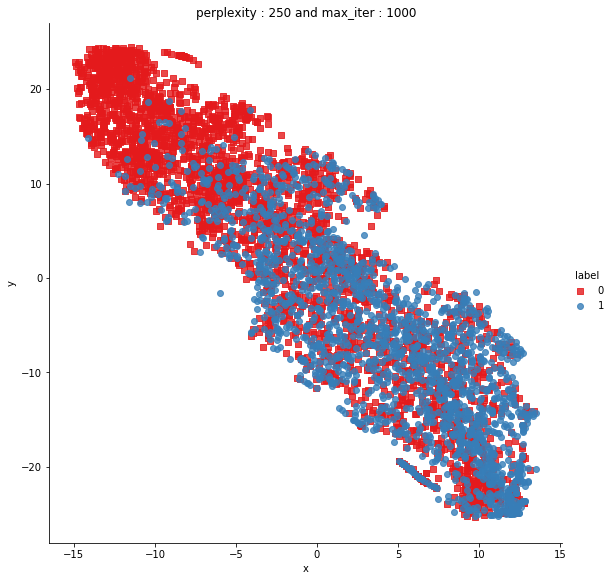

In [25]:
tsne_2d_lmplot(5)
tsne_2d_lmplot(15)
tsne_2d_lmplot(30)
tsne_2d_lmplot(50)
tsne_2d_lmplot(100)
tsne_2d_lmplot(250)

As can be seen from the above plots, the features are partially seperable. However, there is a significant amount of overlap. As the perplexity increases, the data becomes slightly more seperated. This can be explained by the fact that as the perplexity increases the number of neigbourhood distances that are preserved also increases.

### 9.3 Using TSNE (3D) for Dimentionality reduction on the advance features

In [9]:
sampled_dataset=dataset.sample(n=10000, random_state=0)
X = sampled_dataset[['cwc_min', 'cwc_max', 'csc_min', 'csc_max' , 'ctc_min' , 'ctc_max' , 'last_word_eq', 'first_word_eq' , 'abs_len_diff' , 'mean_len' , 'token_set_ratio' , 'token_sort_ratio' ,  'fuzz_ratio' , 'fuzz_partial_ratio' , 'longest_substr_ratio']]
y = sampled_dataset['is_duplicate'].values

from MulticoreTSNE import MulticoreTSNE as TSNE
tsne3d = TSNE(
    n_components=3,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    angle=0.5,n_jobs=-1).fit_transform(X)


In [11]:
import plotly.offline as offline
offline.init_notebook_mode()

trace1 = go.Scatter3d(
    x=tsne3d[:,0],
    y=tsne3d[:,1],
    z=tsne3d[:,2],
    mode='markers',
    marker=dict(
        sizemode='diameter',
        color = y,
        colorscale = 'Portland',
        colorbar = dict(title = 'duplicate'),
        line=dict(color='rgb(40, 50, 10)'),
        opacity=0.75
    )
)

data=[trace1]
layout=dict(height=800, width=800, title='3d embedding with engineered features')
fig=dict(data=data, layout=layout)
offline.iplot(fig, filename='3DBubble',auto_play=True)

### Observation:

The above TSNE plots shows that duplicate and non duplicate questions can be well seperated partially.

## 10. Data Loading and Splitting

### 10.1. Load the feature engineered datasets 

In [6]:
#prepro_features_train.csv (Simple Preprocessing Feartures)
#nlp_features_train.csv (Advance NLP Features)
if os.path.isfile('nlp_features_train.csv'):
    df_adv_feats = pd.read_csv("nlp_features_train.csv",encoding='latin-1')
else:
    print("download nlp_features_train.csv from drive or run previous notebook")

if os.path.isfile('dataset_fe_without_preprocessing_train.csv'):
    df_basic_feats = pd.read_csv("dataset_fe_without_preprocessing_train.csv",encoding='latin-1')
else:
    print("download dataset_fe_without_preprocessing_train.csv from drive or run previous notebook")

In [7]:
df_adv_feats.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,cwc_min,cwc_max,csc_min,csc_max,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio
0,0,1,2,what is the step by step guide to invest in sh...,what is the step by step guide to invest in sh...,0,0.999980,0.833319,0.999983,0.999983,...,0.785709,0.0,1.0,2.0,13.0,100,93,93,100,0.982759
1,1,3,4,what is the story of kohinoor koh i noor dia...,what would happen if the indian government sto...,0,0.799984,0.399996,0.749981,0.599988,...,0.466664,0.0,1.0,5.0,12.5,86,63,66,75,0.596154


In [8]:
df_basic_feats.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,freq_q1-q2
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0,1,1,66,57,14,12,10.0,23.0,0.434783,2,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0,4,1,51,88,8,13,4.0,20.0,0.200000,5,3


In [9]:
#Encoding all the data questions to string
df_adv_feats['question1'] = df_adv_feats['question1'].apply(lambda x: str(x))
df_adv_feats['question2'] = df_adv_feats['question2'].apply(lambda x: str(x))

In [10]:
#Taking the processed texts
df_ques = df_adv_feats[['question1','question2']]

#Extracting only the basic and advance features and nothing else
df_adv = df_adv_feats.iloc[0:,6:]
df_basic = df_basic_feats.iloc[0:,6:]

labels = df_adv_feats[['is_duplicate']]

### 10.2. Combine all the dataframes containing questions, basic and advance features + Save it for later use

In [11]:
#Merge into one single dataframe and save it for later use.
data_df = pd.concat([df_ques, df_basic, df_adv, labels],axis=1)
data_df.to_csv('all_features.csv', index=False)

### 10.3. Load and split the final dataset randomly in 70:30 ratio. (Split and then encode)

In [7]:
#Load the dataset.  Filling the null values with ' '
df = pd.read_csv('all_features.csv').fillna('')

X = df.drop(['is_duplicate'], axis=1)
y = df[['is_duplicate']]

#Split the dataset into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.3, random_state=0)

### 10.4 EDA using Normalised histogram of character count in questions

Mean-Train 59.99, STD-Train 32.09, 
Mean-Test 59.95, STD-Test 32.19, 
Max-Train 1173.00, Max-Test 1173.00


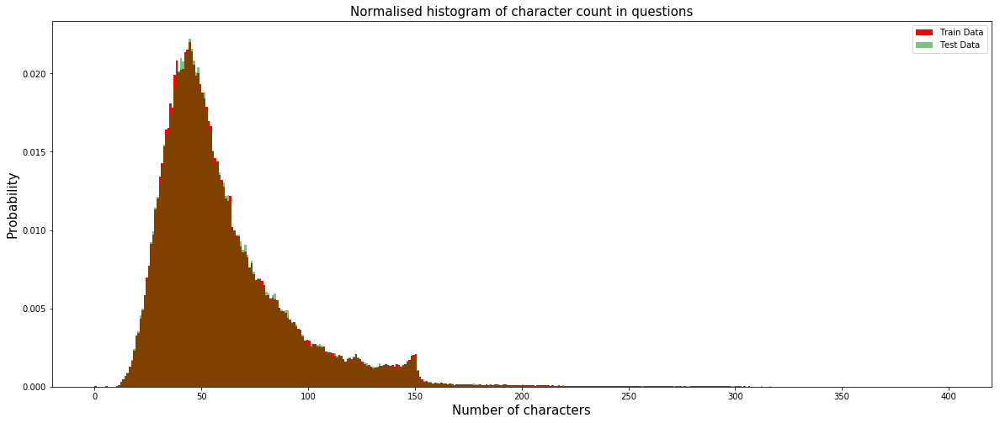

In [25]:
#Refer: https://www.kaggle.com/anokas/data-analysis-xgboost-starter-0-35460-lb/notebook
train_qs = pd.Series(X_train['question1'].tolist() + X_train['question2'].tolist()).astype(str)
test_qs = pd.Series(X_test['question1'].tolist() + X_test['question2'].tolist()).astype(str)

dist_train = train_qs.apply(len)
dist_test = test_qs.apply(len)
plt.figure(figsize=(20, 8))
plt.hist(dist_train, bins=400, range=[0, 400], color='red', normed=True, label='Train Data')
plt.hist(dist_test, bins=400, range=[0, 400], color='green', normed=True, alpha=0.5, label='Test Data')
plt.title('Normalised histogram of character count in questions', fontsize=15)
plt.legend()
plt.xlabel('Number of characters', fontsize=15)
plt.ylabel('Probability', fontsize=15)

print('Mean-Train {:.2f}, STD-Train {:.2f}, \nMean-Test {:.2f}, STD-Test {:.2f}, \nMax-Train {:.2f}, Max-Test {:.2f}'.format(dist_train.mean(), dist_train.std(), dist_test.mean(), dist_test.std(), dist_train.max(), dist_test.max()))

### Observations:

1. We can see that the length of characters of most questions are somewhere between 20 and 150. The median length of questions is somewhere around 55. This means most of the questions pair that are present are highly concentrated in the region of 50 characters.

2. By looking at the distribution of character count in both the train and test set, we can see there is almost a perfect overlap of both the distributions. However we can still see the 'red' color of the Train dsitribution which suggests that the two distributions are very slightly different from each other, inspite of almost a perfect overlap. 

3. The mean values of train and test set are extremely close to each other, also the STD values are extremely close. 

4. The maximum length of characters for the questions present in both the train and test set is just under 1200. 

5. Also, if we notice carefully, there is a very sudden drop in character counts beyond the 150 mark on the X-axis. There are a very very very few number of people who actually writes questions which are greater than 200 characters in length.

6. The dsitribution is skewed towards the lef side. Or else it could have been said to exhibit all the properties of a aussian Distribution.

### 10.5 EDA using Normalised histogram of word count in questions

Mean-Train 12.71, STD-Train 6.72, 
Mean-Test 12.70, STD-Test 6.77, 
Max-Train 271.00, Max-Test 271.00


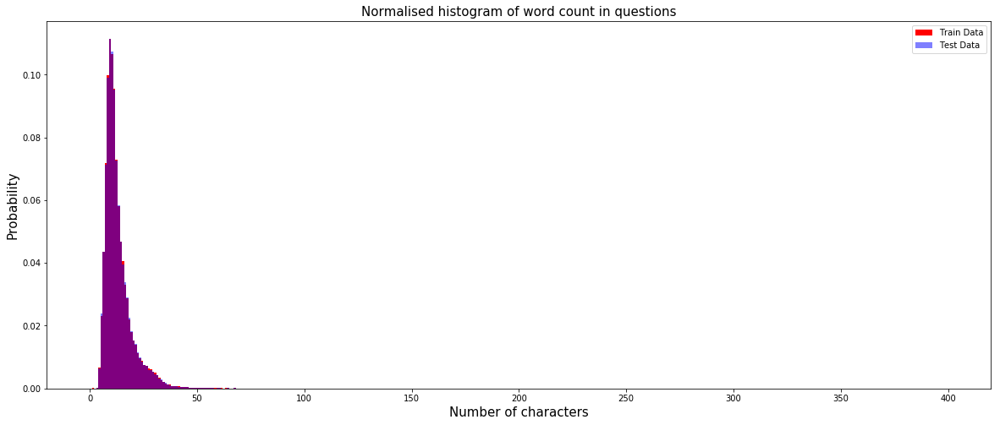

In [27]:
dist_train = train_qs.apply(lambda x: len(x.split(' ')))
dist_test = test_qs.apply(lambda x: len(x.split(' ')))
plt.figure(figsize=(20, 8))
plt.hist(dist_train, bins=400, range=[0, 400], color='red', normed=True, label='Train Data')
plt.hist(dist_test, bins=400, range=[0, 400], color='blue', normed=True, alpha=0.5, label='Test Data')
plt.title('Normalised histogram of word count in questions', fontsize=15)
plt.legend()
plt.xlabel('Number of characters', fontsize=15)
plt.ylabel('Probability', fontsize=15)

print('Mean-Train {:.2f}, STD-Train {:.2f}, \nMean-Test {:.2f}, STD-Test {:.2f}, \nMax-Train {:.2f}, Max-Test {:.2f}'.format(dist_train.mean(), dist_train.std(), dist_test.mean(), dist_test.std(), dist_train.max(), dist_test.max()))

### Observations:

1. Here also we notice the same thing. The distribution of word counts for both the train and test data looks very similar. They are nearly perfectly overlapping with some very slight differences. 
2. Both the distributions are skewed towards the left.
3. The word count for all the questions varies roughly between 5 to 45. 
4. The median word count for the questions in both train and test data are somewhere around the 13 mark. This means most users have written questions which has 10-15 words.
5. The maximum word count present in the questions of both train and test data is slightly under 300. Extremely few questions are there which goes to upto a word count of 271. Most of them are present in the dense region around the 13-15 mark.

## 11. Feature importance of the handmade features using Decision Trees

### 11.1 Load the dataset containing all the hand engineered features

In [25]:
#Load the dataset.  Filling the null values with ' '
df = pd.read_csv('all_features.csv').fillna('')
X = df.drop(['is_duplicate','question1','question2'], axis=1) #This X contains only the hand engineered features
y = df[['is_duplicate']]

X.head()

,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_Total,word_share,freq_q1+q2,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio
0,1,1,66,57,14,12,10.0,23.0,0.434783,2,...,0.785709,0.0,1.0,2.0,13.0,100,93,93,100,0.982759
1,4,1,51,88,8,13,4.0,20.0,0.200000,5,...,0.466664,0.0,1.0,5.0,12.5,86,63,66,75,0.596154
2,1,1,73,59,14,10,4.0,24.0,0.166667,2,...,0.285712,0.0,1.0,4.0,12.0,66,66,54,54,0.166667
3,1,1,50,65,11,9,0.0,19.0,0.000000,2,...,0.000000,0.0,0.0,2.0,12.0,36,36,35,40,0.039216
4,3,1,76,39,13,7,2.0,20.0,0.100000,4,...,0.307690,0.0,1.0,6.0,10.0,67,47,46,56,0.175000


### 11.2 Utility functions needed for Decision Trees

In [76]:
from sklearn.tree import DecisionTreeClassifier
def get_best_param(X, y):
    tuned_parameters = {'max_depth': [1, 5, 10, 25, 50, 75, 100, 150, 250, 500, 750, 1000], 
                        'min_samples_split' : [5, 10, 25, 50, 75, 150, 250, 500]}
    base_estimator = DecisionTreeClassifier(criterion='gini', random_state=0) 
    rsearch_cv = RandomizedSearchCV(estimator=base_estimator, param_distributions=tuned_parameters, n_iter=30, cv=5, scoring='neg_log_loss', n_jobs=-1)
    rsearch_cv.fit(X, y)
    print("Best estimator obtained from CV data: \n", rsearch_cv.best_estimator_)
    print("Best Score : ", rsearch_cv.best_score_)    
    return (rsearch_cv)

#https://scikit-learn.org/stable/modules/tree.html
def visualize_tree(model, f_names, filename):
    from sklearn import tree
    import graphviz
    dot_data = tree.export_graphviz(decision_tree=model, out_file=None, max_depth=4, filled=True, rounded=True, special_characters=True, impurity=True, feature_names=f_names, class_names=['Duplicates','Non Duplicates'])  
    graph = graphviz.Source(dot_data)  
    graph.render(filename, format='png') 
    return graph
    
def top_features(model, n):
    '''Get the most important features for the given input vector.'''
    features=model.feature_importances_
    top_features_index = (-features).argsort()               #Note : Putting a - sign indicates the indexes will be sorted in descending order.
    top_features = np.take(X.columns, top_features_index[:n])

    #Plot the feature importance for all the features
    x = X.columns
    y = features

    plt.figure(figsize=(15, 8))
    plt.title ("VISUALIZING FEATURE IMPORTANCES")
    plt.ylabel('Feature names')
    plt.xlabel('Feature importance score')
    sns.barplot(y,x,orient='h')
    plt.show()
    
    print("The top {} important features are.\n".format(n))
    print(list(top_features)) 

### 11.3 Train the Decision Tree model using the best estimator obtained from above

In [29]:
rsearch_cv = get_best_param(X, y)
model = rsearch_cv.best_estimator_
model.fit(X,y)

Best estimator obtained from CV data: 
 DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=150,
            min_weight_fraction_leaf=0.0, presort=False, random_state=0,
            splitter='best')
Best Score :  -0.3761480527652674


DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=10,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=150,
            min_weight_fraction_leaf=0.0, presort=False, random_state=0,
            splitter='best')

### 11.4 Get the top 15 most important features amongst all the hand engineered features

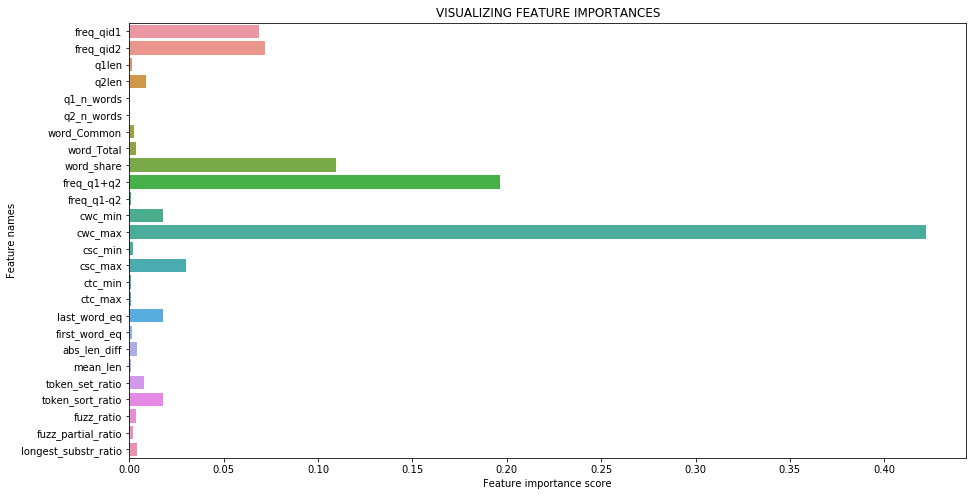

The top 15 important features are.

['cwc_max', 'freq_q1+q2', 'word_share', 'freq_qid2', 'freq_qid1', 'csc_max', 'token_sort_ratio', 'cwc_min', 'last_word_eq', 'q2len', 'token_set_ratio', 'abs_len_diff', 'longest_substr_ratio', 'fuzz_ratio', 'word_Total']


In [77]:
top_features(model, n=15)

### 11.5 Visualize the Decision Tree using Graphviz

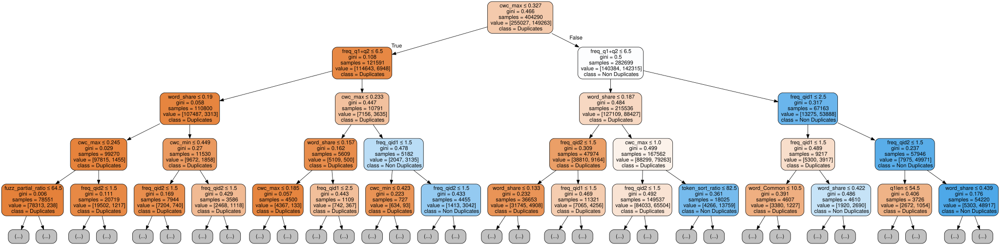

In [47]:
#Call the function above and pass a filename onto it.
f_names=X.columns
graph=visualize_tree(model, f_names, 'Feat_Imp.png')
graph

### Observation:

1. As we can see, 'cwc_max', 'freq_q1+q2', 'word_share', 'freq_qid2', 'freq_qid1', 'csc_max', 'token_sort_ratio', 'cwc_min', 'last_word_eq', 'q2len', 'token_set_ratio', 'abs_len_diff', 'longest_substr_ratio', 'fuzz_ratio', 'word_Total' are the top 15 most important features out of all the basic and advance features that we have extracted. 

2. Using just the hand engineered features and nothing else, our model gave us a log loss value of 0.37, which is pretty good as compared to some of the other models we have trained later. 
3. By visualizing the tree above, we can quickly say how important each of the features are, and how the tree makes it's decisions to reach a particular node.
4. 'word_Common', 'fuzz_partial_ratio', 'csc_min', 'q1len', 'first_word_eq', 'freq_q1-q2', 'ctc_min', 'ctc_max', 'mean_len', 'q1_n_words', 'q2_n_words' are our 11 list important features. However, we will keep them as of now and use them to build our models and see results do we get.

## 12. Converting the questions to weighted TFIDF Word to Vectors

### 12.1. Build the TFIDF Weighted W2V models using the train and test data (Using spacy)

In [14]:
from sklearn.feature_extraction.text import TfidfVectorizer

#Merge questions
questions = list(X_train['question1']) + list(X_train['question2'])

#Initializing the TF-IDF contructor
tf_idf_object = TfidfVectorizer(ngram_range=(1,1)).fit(questions)

- After we find TF-IDF scores, we convert each question to a weighted average of word2vec vectors by these scores.
- here we use a pre-trained GLOVE model which comes free with "Spacy".  https://spacy.io/usage/vectors-similarity
- It is trained on Wikipedia and therefore, it is stronger in terms of word semantics. 

In [15]:
#!python -m spacy download en_core_web_sm

# en_vectors_web_lg, which includes over 1 million unique vectors.
nlp = spacy.load('en_core_web_sm')

# dict key:word and value:tf-idf score
word2tfidf = dict(zip(tf_idf_object.get_feature_names(), tf_idf_object.idf_))

#This fuction will take a dataframe with two question columns. Vectorize each of the question columns seperately and return e merged dataframe containing word vectors of questions
def get_word_vecs(data):
    
    #Converting question 1 to word vectors using spacy
    vecs1 = []
    # https://github.com/noamraph/tqdm
    # tqdm is used to print the progress bar
    for qu1 in tqdm(list(data['question1'])):
        doc1 = nlp(qu1) 
        # 384 is the number of dimensions of vectors 
        mean_vec1 = np.zeros([len(doc1), 384])
        for word1 in doc1:
            # word2vec
            vec1 = word1.vector
            # fetch df score
            try:
                idf = word2tfidf[str(word1)]
            except:
                idf = 0
            # compute final vec
            mean_vec1 += vec1 * idf
        mean_vec1 = mean_vec1.mean(axis=0)
        vecs1.append(mean_vec1)
    data['q1_vectors'] = list(vecs1)
    
    #Converting question 2 to word vectors using spacy
    vecs2 = []
    for qu2 in tqdm(list(data['question2'])):
        doc2 = nlp(qu2) 
        mean_vec2 = np.zeros([len(doc2), 384])
        for word2 in doc2:
            # word2vec
            vec2 = word2.vector
            # fetch df score
            try:
                idf = word2tfidf[str(word2)]
            except:
                #print word
                idf = 0
            # compute final vec
            mean_vec2 += vec2 * idf
        mean_vec2 = mean_vec2.mean(axis=0)
        vecs2.append(mean_vec2)
    data['q2_vectors'] = list(vecs2)
    
    
    df_q1 = pd.DataFrame(data.q1_vectors.values.tolist(), index= data.index)
    df_q2 = pd.DataFrame(data.q2_vectors.values.tolist(), index= data.index)
    
    word_vectors = pd.concat([df_q1, df_q2],axis=1)
    return word_vectors

In [16]:
#Get all the features of test and train vectors
train = get_word_vecs(X_train)
test = get_word_vecs(X_test)

100%|██████████| 121287/121287 [23:53<00:00, 79.35it/s]


### 12.2. Merge all the features and save it for later use

In [17]:
#Prepare the final X_train
feats_tr = X_train.drop(['question1','question2','q1_vectors','q2_vectors'],axis=1)
X_tr = pd.concat([feats_tr, train],axis=1)

#Prepare the final X_test
feats_tst = X_test.drop(['question1','question2','q1_vectors','q2_vectors'],axis=1)
X_tst = pd.concat([feats_tst, test],axis=1)

In [ ]:
#Fill NAN values with zero
X_tr = X_tr.fillna(0)
X_tst = X_tst.fillna(0)

In [18]:
print("Number of features in basic feature-engineering dataframe :", df_basic.shape[1])
print("Number of features in advanced feature-engineering dataframe :", df_adv.shape[1])
print("Number of features in question1 w2v  dataframe :", train.shape[1]//2)
print("Number of features in question2 w2v  dataframe :", train.shape[1]//2)
print("Number of features in final dataframe  :", X_tr.shape[1])

Number of features in basic feature-engineering dataframe : 11
Number of features in advanced feature-engineering dataframe : 15
Number of features in question1 w2v  dataframe : 384
Number of features in question2 w2v  dataframe : 384
Number of features in final dataframe  : 794


In [19]:
#Storing the final data as pickle files
import pickle
with open('X_train_TFIDF_W2V.pkl', 'wb') as file:
    pickle.dump(np.array(X_tr.values), file)
    
with open('X_test_TFIDF_W2V.pkl', 'wb') as file:
    pickle.dump(np.array(X_tst.values), file)
    
with open('y_train_TFIDF_W2V.pkl', 'wb') as file:
    pickle.dump(y_train.values, file)
    
with open('y_test_TFIDF_W2V.pkl', 'wb') as file:
    pickle.dump(y_test.values, file)

## 13. Featurizing text data with tfidf vectors 

<h2> 13.1. Load the original dataset.  </h2>

In [4]:
#Load the dataset.  Filling the null values with ' '
df = pd.read_csv('all_features.csv').fillna('')

X = df.drop(['is_duplicate'], axis=1)
y = df[['is_duplicate']]

#Split the dataset into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.3, random_state=0)

<h2> 13.2. Get the TF-IDF feature representations</h2>

In [12]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer

#Merge questions
questions = list(X_train['question1']) + list(X_train['question2'])

#Initializing the TF-IDF contructor
tf_idf_object = TfidfVectorizer(ngram_range=(1,1)).fit(questions)

<h2> 13.3. Process and save datasets for later use</h2>

In [34]:
import scipy
from scipy.sparse import hstack
import pickle

def convert_tfidf(tf_idf_object, data):
    q1_vectors = tf_idf_object.transform(data['question1'])
    q2_vectors = tf_idf_object.transform(data['question2'])
    feat_vectors = data.drop(['question1','question2'],axis=1)

    #Combining all the feature matices into one single sparse matrix.
    data_matrix = hstack((q1_vectors, q2_vectors, feat_vectors.values)) #Combining all the 4 feature matrices to one single sparse matrix

    print("Number of engineered features:", feat_vectors.shape[1])
    print("Number of TFIDF Features of Question 1 :", q1_vectors.shape[1])
    print("Number of TFIDF Features of Question 2 :", q2_vectors.shape[1])
    print("Number of TFIDF features in final dataframe  :", data_matrix.shape[1])
    print()
    
    return data_matrix

In [35]:
X_tr = convert_tfidf(tf_idf_object, X_train)
X_tst = convert_tfidf(tf_idf_object, X_test)

Number of engineered features: 26
Number of TFIDF Features of Question 1 : 73560
Number of TFIDF Features of Question 2 : 73560
Number of TFIDF features in final dataframe  : 147146

Number of engineered features: 26
Number of TFIDF Features of Question 1 : 73560
Number of TFIDF Features of Question 2 : 73560
Number of TFIDF features in final dataframe  : 147146



In [36]:
print("Shape of the train matrix: ",X_tr.shape)
print("Shape of the test matrix: ",X_tst.shape)

Shape of the train matrix:  (283003, 147146)
Shape of the test matrix:  (121287, 147146)


In [37]:
#Finally save the sparse matrices for later use.
with open('X_train_TFIDF.pkl', 'wb') as file:
    pickle.dump(X_tr, file)

with open('y_train_TFIDF.pkl', 'wb') as file:
    pickle.dump(y_train, file)

with open('X_test_TFIDF.pkl', 'wb') as file:
    pickle.dump(X_tst, file)

with open('y_test_TFIDF.pkl', 'wb') as file:
    pickle.dump(y_test, file)

<h2> 13.4 Reading data from file and storing into sql table </h2>

In [ ]:
'''
#Creating db file from csv
if not os.path.isfile('train.db'):
    disk_engine = create_engine('sqlite:///train.db')
    start = dt.datetime.now()
    chunksize = 180000
    j = 0
    index_start = 1
    for df in pd.read_csv('final_features.csv', names=['Unnamed: 0','id','is_duplicate','cwc_min','cwc_max','csc_min','csc_max','ctc_min','ctc_max','last_word_eq','first_word_eq','abs_len_diff','mean_len','token_set_ratio','token_sort_ratio','fuzz_ratio','fuzz_partial_ratio','longest_substr_ratio','freq_qid1','freq_qid2','q1len','q2len','q1_n_words','q2_n_words','word_Common','word_Total','word_share','freq_q1+q2','freq_q1-q2','0_x','1_x','2_x','3_x','4_x','5_x','6_x','7_x','8_x','9_x','10_x','11_x','12_x','13_x','14_x','15_x','16_x','17_x','18_x','19_x','20_x','21_x','22_x','23_x','24_x','25_x','26_x','27_x','28_x','29_x','30_x','31_x','32_x','33_x','34_x','35_x','36_x','37_x','38_x','39_x','40_x','41_x','42_x','43_x','44_x','45_x','46_x','47_x','48_x','49_x','50_x','51_x','52_x','53_x','54_x','55_x','56_x','57_x','58_x','59_x','60_x','61_x','62_x','63_x','64_x','65_x','66_x','67_x','68_x','69_x','70_x','71_x','72_x','73_x','74_x','75_x','76_x','77_x','78_x','79_x','80_x','81_x','82_x','83_x','84_x','85_x','86_x','87_x','88_x','89_x','90_x','91_x','92_x','93_x','94_x','95_x','96_x','97_x','98_x','99_x','100_x','101_x','102_x','103_x','104_x','105_x','106_x','107_x','108_x','109_x','110_x','111_x','112_x','113_x','114_x','115_x','116_x','117_x','118_x','119_x','120_x','121_x','122_x','123_x','124_x','125_x','126_x','127_x','128_x','129_x','130_x','131_x','132_x','133_x','134_x','135_x','136_x','137_x','138_x','139_x','140_x','141_x','142_x','143_x','144_x','145_x','146_x','147_x','148_x','149_x','150_x','151_x','152_x','153_x','154_x','155_x','156_x','157_x','158_x','159_x','160_x','161_x','162_x','163_x','164_x','165_x','166_x','167_x','168_x','169_x','170_x','171_x','172_x','173_x','174_x','175_x','176_x','177_x','178_x','179_x','180_x','181_x','182_x','183_x','184_x','185_x','186_x','187_x','188_x','189_x','190_x','191_x','192_x','193_x','194_x','195_x','196_x','197_x','198_x','199_x','200_x','201_x','202_x','203_x','204_x','205_x','206_x','207_x','208_x','209_x','210_x','211_x','212_x','213_x','214_x','215_x','216_x','217_x','218_x','219_x','220_x','221_x','222_x','223_x','224_x','225_x','226_x','227_x','228_x','229_x','230_x','231_x','232_x','233_x','234_x','235_x','236_x','237_x','238_x','239_x','240_x','241_x','242_x','243_x','244_x','245_x','246_x','247_x','248_x','249_x','250_x','251_x','252_x','253_x','254_x','255_x','256_x','257_x','258_x','259_x','260_x','261_x','262_x','263_x','264_x','265_x','266_x','267_x','268_x','269_x','270_x','271_x','272_x','273_x','274_x','275_x','276_x','277_x','278_x','279_x','280_x','281_x','282_x','283_x','284_x','285_x','286_x','287_x','288_x','289_x','290_x','291_x','292_x','293_x','294_x','295_x','296_x','297_x','298_x','299_x','300_x','301_x','302_x','303_x','304_x','305_x','306_x','307_x','308_x','309_x','310_x','311_x','312_x','313_x','314_x','315_x','316_x','317_x','318_x','319_x','320_x','321_x','322_x','323_x','324_x','325_x','326_x','327_x','328_x','329_x','330_x','331_x','332_x','333_x','334_x','335_x','336_x','337_x','338_x','339_x','340_x','341_x','342_x','343_x','344_x','345_x','346_x','347_x','348_x','349_x','350_x','351_x','352_x','353_x','354_x','355_x','356_x','357_x','358_x','359_x','360_x','361_x','362_x','363_x','364_x','365_x','366_x','367_x','368_x','369_x','370_x','371_x','372_x','373_x','374_x','375_x','376_x','377_x','378_x','379_x','380_x','381_x','382_x','383_x','0_y','1_y','2_y','3_y','4_y','5_y','6_y','7_y','8_y','9_y','10_y','11_y','12_y','13_y','14_y','15_y','16_y','17_y','18_y','19_y','20_y','21_y','22_y','23_y','24_y','25_y','26_y','27_y','28_y','29_y','30_y','31_y','32_y','33_y','34_y','35_y','36_y','37_y','38_y','39_y','40_y','41_y','42_y','43_y','44_y','45_y','46_y','47_y','48_y','49_y','50_y','51_y','52_y','53_y','54_y','55_y','56_y','57_y','58_y','59_y','60_y','61_y','62_y','63_y','64_y','65_y','66_y','67_y','68_y','69_y','70_y','71_y','72_y','73_y','74_y','75_y','76_y','77_y','78_y','79_y','80_y','81_y','82_y','83_y','84_y','85_y','86_y','87_y','88_y','89_y','90_y','91_y','92_y','93_y','94_y','95_y','96_y','97_y','98_y','99_y','100_y','101_y','102_y','103_y','104_y','105_y','106_y','107_y','108_y','109_y','110_y','111_y','112_y','113_y','114_y','115_y','116_y','117_y','118_y','119_y','120_y','121_y','122_y','123_y','124_y','125_y','126_y','127_y','128_y','129_y','130_y','131_y','132_y','133_y','134_y','135_y','136_y','137_y','138_y','139_y','140_y','141_y','142_y','143_y','144_y','145_y','146_y','147_y','148_y','149_y','150_y','151_y','152_y','153_y','154_y','155_y','156_y','157_y','158_y','159_y','160_y','161_y','162_y','163_y','164_y','165_y','166_y','167_y','168_y','169_y','170_y','171_y','172_y','173_y','174_y','175_y','176_y','177_y','178_y','179_y','180_y','181_y','182_y','183_y','184_y','185_y','186_y','187_y','188_y','189_y','190_y','191_y','192_y','193_y','194_y','195_y','196_y','197_y','198_y','199_y','200_y','201_y','202_y','203_y','204_y','205_y','206_y','207_y','208_y','209_y','210_y','211_y','212_y','213_y','214_y','215_y','216_y','217_y','218_y','219_y','220_y','221_y','222_y','223_y','224_y','225_y','226_y','227_y','228_y','229_y','230_y','231_y','232_y','233_y','234_y','235_y','236_y','237_y','238_y','239_y','240_y','241_y','242_y','243_y','244_y','245_y','246_y','247_y','248_y','249_y','250_y','251_y','252_y','253_y','254_y','255_y','256_y','257_y','258_y','259_y','260_y','261_y','262_y','263_y','264_y','265_y','266_y','267_y','268_y','269_y','270_y','271_y','272_y','273_y','274_y','275_y','276_y','277_y','278_y','279_y','280_y','281_y','282_y','283_y','284_y','285_y','286_y','287_y','288_y','289_y','290_y','291_y','292_y','293_y','294_y','295_y','296_y','297_y','298_y','299_y','300_y','301_y','302_y','303_y','304_y','305_y','306_y','307_y','308_y','309_y','310_y','311_y','312_y','313_y','314_y','315_y','316_y','317_y','318_y','319_y','320_y','321_y','322_y','323_y','324_y','325_y','326_y','327_y','328_y','329_y','330_y','331_y','332_y','333_y','334_y','335_y','336_y','337_y','338_y','339_y','340_y','341_y','342_y','343_y','344_y','345_y','346_y','347_y','348_y','349_y','350_y','351_y','352_y','353_y','354_y','355_y','356_y','357_y','358_y','359_y','360_y','361_y','362_y','363_y','364_y','365_y','366_y','367_y','368_y','369_y','370_y','371_y','372_y','373_y','374_y','375_y','376_y','377_y','378_y','379_y','380_y','381_y','382_y','383_y'], chunksize=chunksize, iterator=True, encoding='utf-8', ):
        df.index += index_start
        j+=1
        print('{} rows'.format(j*chunksize))
        df.to_sql('data', disk_engine, if_exists='append')
        index_start = df.index[-1] + 1
        
#http://www.sqlitetutorial.net/sqlite-python/create-tables/
def create_connection(db_file):
    """ create a database connection to the SQLite database
        specified by db_file
    :param db_file: database file
    :return: Connection object or None
    """
    try:
        conn = sqlite3.connect(db_file)
        return conn
    except Error as e:
        print(e)
 
    return None

def checkTableExists(dbcon):
    cursr = dbcon.cursor()
    str = "select name from sqlite_master where type='table'"
    table_names = cursr.execute(str)
    print("Tables in the databse:")
    tables =table_names.fetchall() 
    print(tables[0][0])
    return(len(tables))
    
read_db = 'train.db'
conn_r = create_connection(read_db)
checkTableExists(conn_r)
conn_r.close()

# try to sample data according to the computing power you have
if os.path.isfile(read_db):
    conn_r = create_connection(read_db)
    if conn_r is not None:
        # for selecting first 1M rows
        # data = pd.read_sql_query("""SELECT * FROM data LIMIT 100001;""", conn_r)
        
        # for selecting random points
        data = pd.read_sql_query("SELECT * FROM data LIMIT 100001;", conn_r)
        conn_r.commit()
        conn_r.close()        
'''

<h2>  13.5 Converting strings to numerics </h2>

In [ ]:
'''# after we read from sql table each entry was read it as a string
# we convert all the features into numeric before we apply any model
cols = list(data.columns)
for i in cols:
    data[i] = data[i].apply(pd.to_numeric)
    print(i)
    
# https://stackoverflow.com/questions/7368789/convert-all-strings-in-a-list-to-int
y_true = list(map(int, y_true.values))'''

<h2> 13.6 Check the distribution of class labels in train and test data</h2>

In [20]:
print("Distribution of output variable in test data", "-"*10)
test_distr = Counter(DataFrame(y_test))
test_len = len(y_test)
print("Class 0: ",int(test_distr[0])/test_len, "Class 1: ",int(test_distr[1])/test_len)

104484

In [21]:
with open('y_train_TFIDF_W2V.pkl', 'rb') as file:
    y_train = pickle.load(file)
    
with open('y_test_TFIDF_W2V.pkl', 'rb') as file:
    y_test = pickle.load(file)

In [33]:
#Effect of stratify=y_true
print("Distribution of output variable in train data", "-"*10)
non_zeros = np.count_nonzero(y_train)
train_len = len(y_train)

print("Class 0: {}%, Class 1: {}%".format(np.round((1-int(non_zeros)/train_len)*100,2), np.round(int(non_zeros)/train_len*100,2)))
print()


print("Distribution of output variable in test data", "-"*10)
non_zeros = np.count_nonzero(y_test)
test_len = len(y_test)

print("Class 0: {}%, Class 1: {}%".format(np.round((1-int(non_zeros)/test_len)*100,2), np.round(int(non_zeros)/test_len*100,2)))
print()

Distribution of output variable in train data ----------
Class 0: 63.08%, Class 1: 36.92%

Distribution of output variable in test data ----------
Class 0: 63.08%, Class 1: 36.92%



<h2> Utility functions used for analysis of Machine Learning models</h2>

In [4]:
# This function plots the confusion matrices given y_i, y_i_hat.
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    # C = 9,9 matrix, each cell (i,j) represents number of points of class i are predicted class j
    
    A =(((C.T)/(C.sum(axis=1))).T)
    #divid each element of the confusion matrix with the sum of elements in that column
    
    # C = [[1, 2],
    #     [3, 4]]
    # C.T = [[1, 3],
    #        [2, 4]]
    # C.sum(axis = 1)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =1) = [[3, 7]]
    # ((C.T)/(C.sum(axis=1))) = [[1/3, 3/7]
    #                           [2/3, 4/7]]

    # ((C.T)/(C.sum(axis=1))).T = [[1/3, 2/3]
    #                           [3/7, 4/7]]
    # sum of row elements = 1
    
    B =(C/C.sum(axis=0))
    #divid each element of the confusion matrix with the sum of elements in that row
    # C = [[1, 2],
    #     [3, 4]]
    # C.sum(axis = 0)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =0) = [[4, 6]]
    # (C/C.sum(axis=0)) = [[1/4, 2/6],
    #                      [3/4, 4/6]] 
    plt.figure(figsize=(20,4))
    
    labels = [0,1]
    # representing A in heatmap format
    cmap=sns.light_palette("blue")
    plt.subplot(1, 3, 1)
    sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Confusion matrix")
    
    plt.subplot(1, 3, 2)
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Precision matrix")
    
    plt.subplot(1, 3, 3)
    # representing B in heatmap format
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix")
    
    plt.show()
    
#Utility function to record time
#I have taken this code from: https://www.kaggle.com/tilii7/hyperparameter-grid-search-with-xgboost
def timer(start_time=None):
    from datetime import datetime
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

<h1> Machine Learning Models using weighted TFIDF Word2Vec models</h1>

In [2]:
#Load the dataset.
import pickle
with open('X_train_TFIDF_W2V.pkl', 'rb') as file:
    X_train = pickle.load(file)
    
with open('X_test_TFIDF_W2V.pkl', 'rb') as file:
    X_test = pickle.load(file)

with open('y_train_TFIDF_W2V.pkl', 'rb') as file:
    y_train = pickle.load(file)
    
with open('y_test_TFIDF_W2V.pkl', 'rb') as file:
    y_test = pickle.load(file)

print("The shape of the train data matrix: ",X_train.shape)
print("The shape of the test data matrix: ",X_test.shape)

The shape of the train data matrix:  (283003, 794)
The shape of the test data matrix:  (121287, 794)


<h2> 1. Building a random model (Finding worst-case log-loss) Using the TFIDF Mean Word Vectors.</h2>

Log loss on Test Data using Random Model 0.8879955767938649


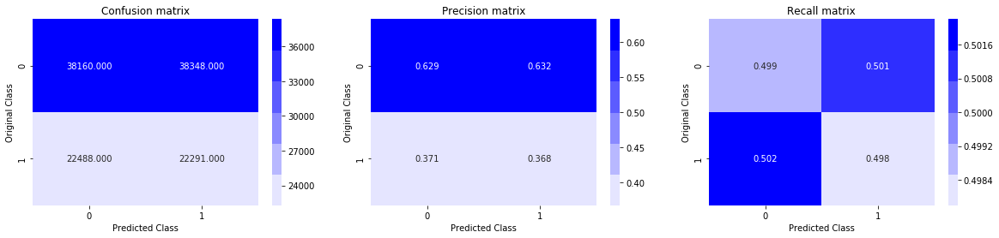

In [37]:
# we need to generate 9 numbers and the sum of numbers should be 1
# one solution is to genarate 9 numbers and divide each of the numbers by their sum
# ref: https://stackoverflow.com/a/18662466/4084039
# we create a output array that has exactly same size as the CV data
predicted_y = np.zeros((test_len,2))
for i in range(test_len):
    rand_probs = np.random.rand(1,2)
    predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])
print("Log loss on Test Data using Random Model",log_loss(y_test, predicted_y, eps=1e-15))

predicted_y =np.argmax(predicted_y, axis=1)
plot_confusion_matrix(y_test, predicted_y)

<h2> 2. Logistic Regression with SGDClassifier + Hyperparameter tuning - Using the TFIDF Mean Word Vectors. </h2>

For values of alpha =  1e-05 The log loss is: 0.48327495476142945
For values of alpha =  0.0001 The log loss is: 0.48626393147253594
For values of alpha =  0.001 The log loss is: 0.48418862118540795
For values of alpha =  0.01 The log loss is: 0.4832708333229682
For values of alpha =  0.1 The log loss is: 0.47744450107218156
For values of alpha =  1 The log loss is: 0.4813630737366242
For values of alpha =  10 The log loss is: 0.5147712417636299


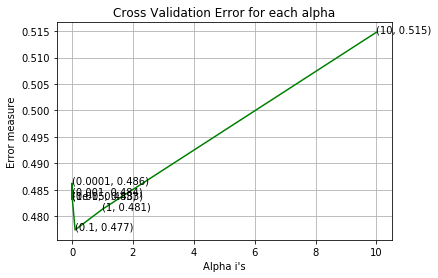

For values of best alpha =  0.1 The train log loss is: 0.4746598159848275
For values of best alpha =  0.1 The test log loss is: 0.47744450107218156

Total number of validation data points : 121287


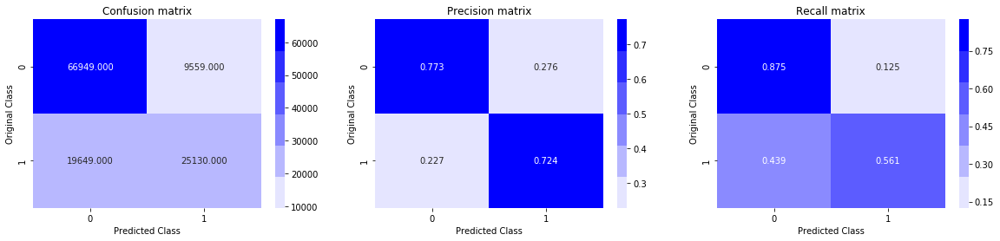

In [38]:
alpha = [10 ** x for x in range(-5, 2)] # hyperparam for SGD classifier.

# read more about SGDClassifier() at http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html
# ------------------------------
# default parameters
# SGDClassifier(loss=’hinge’, penalty=’l2’, alpha=0.0001, l1_ratio=0.15, fit_intercept=True, max_iter=None, tol=None, 
# shuffle=True, verbose=0, epsilon=0.1, n_jobs=1, random_state=None, learning_rate=’optimal’, eta0=0.0, power_t=0.5, 
# class_weight=None, warm_start=False, average=False, n_iter=None)

# some of methods
# fit(X, y[, coef_init, intercept_init, …])	Fit linear model with Stochastic Gradient Descent.
# predict(X)	Predict class labels for samples in X.

#-------------------------------
# video link: 
#------------------------------


log_error_array=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(X_train, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(X_train, y_train)
    predict_y = sig_clf.predict_proba(X_test)
    log_error_array.append(log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(X_train, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_train, y_train)

predict_y = sig_clf.predict_proba(X_train)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(X_test)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(predict_y,axis=1)
print("\nTotal number of validation data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)

<h2> 3. Linear SVM with with SGDClassifier + Hyperparameter tuning - Using the TFIDF Mean Word Vectors. </h2>

For values of alpha =  1e-05 The log loss is: 0.5654152384439007
For values of alpha =  0.0001 The log loss is: 0.4635444049581864
For values of alpha =  0.001 The log loss is: 0.49229141212348754
For values of alpha =  0.01 The log loss is: 0.5427804093672399
For values of alpha =  0.1 The log loss is: 0.5953445824533256
For values of alpha =  1 The log loss is: 0.6260587921211201
For values of alpha =  10 The log loss is: 0.6585278256347589


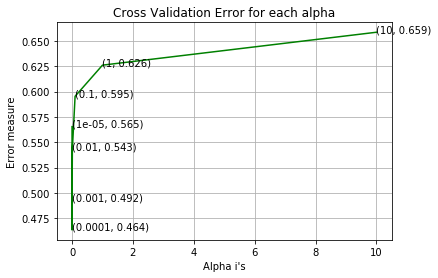

For values of best alpha =  0.0001 The train log loss is: 0.46134535529062326
For values of best alpha =  0.0001 The test log loss is: 0.4635444049581864

Total number of validation data points : 121287


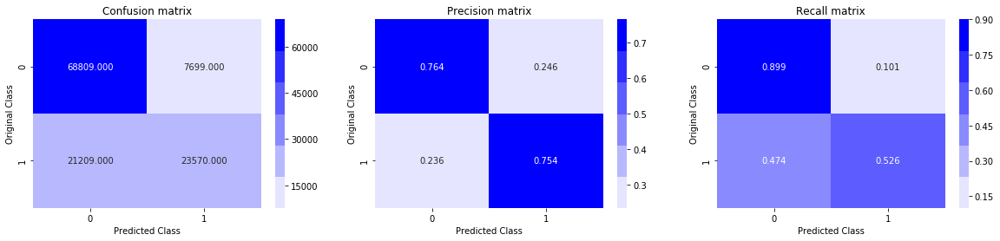

In [39]:
alpha = [10 ** x for x in range(-5, 2)] # hyperparam for SGD classifier.

log_error_array=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l1', loss='hinge', random_state=42)
    clf.fit(X_train, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(X_train, y_train)
    predict_y = sig_clf.predict_proba(X_test)
    log_error_array.append(log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l1', loss='hinge', random_state=42)
clf.fit(X_train, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_train, y_train)

predict_y = sig_clf.predict_proba(X_train)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(X_test)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(predict_y,axis=1)
#print("\nTotal number of validation data points :", len(predicted_y)) #121287
print("\nTotal number of validation data points : 121287")
plot_confusion_matrix(y_test, predicted_y)

<h2> 4. XGBoost Classifier - Using the TFIDF Mean Word Vectors. </h2>

NOTE: DMatrix is a internal data structure that used by XGBoost which is optimized for both memory efficiency and training speed. You can construct DMatrix from numpy.arrays
https://xgboost.readthedocs.io/en/latest/python/python_api.html

[22:29:30] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[0]	train-logloss:0.684849	validation-logloss:0.684854
Multiple eval metrics have been passed: 'validation-logloss' will be used for early stopping.

Will train until validation-logloss hasn't improved in 20 rounds.
[22:29:35] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:29:40] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[2]	train-logloss:0.66879	validation-logloss:0.668813
[22:29:45] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:29:49] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[4]	train-logloss:0.653931	validation-logloss:0.653968
[22:29:54] /workspace/src/tree/updater_prune.cc:74: tree pru

[22:33:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[54]	train-logloss:0.466185	validation-logloss:0.466831
[22:33:47] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:33:52] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[56]	train-logloss:0.462574	validation-logloss:0.46324
[22:33:56] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:34:01] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[58]	train-logloss:0.458996	validation-logloss:0.459701
[22:34:05] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:34:10] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 

[108]	train-logloss:0.405887	validation-logloss:0.407026
[22:38:03] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:38:08] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[110]	train-logloss:0.404664	validation-logloss:0.405827
[22:38:12] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:38:17] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[112]	train-logloss:0.403475	validation-logloss:0.40464
[22:38:22] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:38:27] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[114]	train-logloss:0.402326	validation-logloss:0.403504
[22:38:31] /workspace/src/tree/upda

[22:42:30] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:42:35] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=4
[164]	train-logloss:0.382551	validation-logloss:0.384114
[22:42:40] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:42:44] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=4
[166]	train-logloss:0.382045	validation-logloss:0.383616
[22:42:49] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=4
[22:42:54] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=4
[168]	train-logloss:0.381528	validation-logloss:0.383111
[22:42:58] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nod

[22:47:02] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[218]	train-logloss:0.371626	validation-logloss:0.373517
[22:47:08] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:47:13] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[220]	train-logloss:0.371254	validation-logloss:0.373158
[22:47:18] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:47:23] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[222]	train-logloss:0.370909	validation-logloss:0.372819
[22:47:28] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:47:34] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nod

[272]	train-logloss:0.364032	validation-logloss:0.36626
[22:51:40] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:51:44] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[274]	train-logloss:0.363771	validation-logloss:0.366014
[22:51:50] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:51:55] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[276]	train-logloss:0.363527	validation-logloss:0.365775
[22:52:01] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:52:05] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[278]	train-logloss:0.363302	validation-logloss:0.365557
[22:52:10] /workspace/src/tree/upda

[22:56:10] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:56:14] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[328]	train-logloss:0.357563	validation-logloss:0.360212
[22:56:19] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:56:23] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=4
[330]	train-logloss:0.357375	validation-logloss:0.36004
[22:56:27] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[22:56:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[332]	train-logloss:0.357185	validation-logloss:0.35986
[22:56:36] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes

[23:00:12] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[382]	train-logloss:0.352536	validation-logloss:0.355679
[23:00:17] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[23:00:22] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[384]	train-logloss:0.352347	validation-logloss:0.355522
[23:00:27] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[23:00:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[386]	train-logloss:0.35219	validation-logloss:0.35538
[23:00:37] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[23:00:42] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes

[436]	train-logloss:0.348554	validation-logloss:0.352189
[23:04:40] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[23:04:45] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[438]	train-logloss:0.348423	validation-logloss:0.352076
[23:04:50] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[23:04:55] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[440]	train-logloss:0.348298	validation-logloss:0.35197
[23:05:00] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=4
[23:05:04] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[442]	train-logloss:0.348145	validation-logloss:0.351834
[23:05:09] /workspace/src/tree/upda

[23:09:04] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[23:09:08] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[492]	train-logloss:0.345035	validation-logloss:0.349153
[23:09:12] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[23:09:17] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[494]	train-logloss:0.344921	validation-logloss:0.349047
[23:09:22] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[23:09:26] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[496]	train-logloss:0.344802	validation-logloss:0.348951
[23:09:31] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nod

[23:13:15] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[546]	train-logloss:0.342029	validation-logloss:0.346635
[23:13:19] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=4
[23:13:24] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[548]	train-logloss:0.341938	validation-logloss:0.346558
[23:13:28] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[23:13:33] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[550]	train-logloss:0.341829	validation-logloss:0.346459
[23:13:38] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=4
[23:13:42] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nod


The test log loss is: 0.34446052206299527

Total number of validation data points : 121287


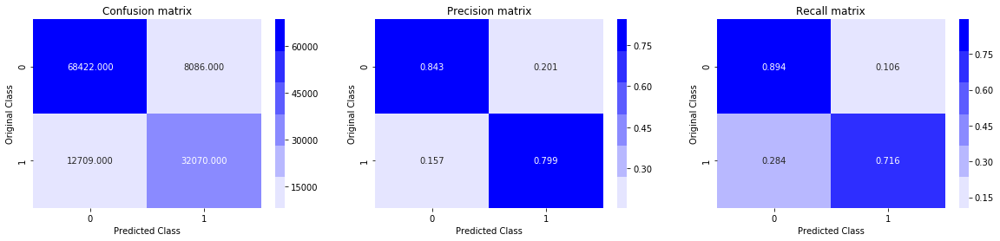

In [40]:
import xgboost as xgb
params = {}
params['objective'] = 'binary:logistic'
params['eval_metric'] = 'logloss'
params['eta'] = 0.02
params['max_depth'] = 4

d_train = xgb.DMatrix(X_train, label=y_train)
d_test = xgb.DMatrix(X_test, label=y_test)

watchlist = [(d_train, 'train'), (d_test, 'validation')]

bst = xgb.train(params, d_train, 600, watchlist, early_stopping_rounds=20, verbose_eval=2)

xgdmat = xgb.DMatrix(X_train,y_train)
predict_y = bst.predict(d_test)
print("\nThe test log loss is:",log_loss(y_test, predict_y, labels=[0, 1], eps=1e-15))

predicted_y =np.array(predict_y>0.5,dtype=int)
print("\nTotal number of validation data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)

<h1> 5. Tasks </h1>

1. Hyperparameter tune XgBoost using RandomSearch to reduce the log-loss.
2. Try out models (Logistic regression, Linear-SVM) with simple TF-IDF vectors instead of TD_IDF weighted word2Vec.

## 5.1 Hyperparameter tune XgBoost using RandomSearch to reduce the log-loss - Using the TFIDF Mean Word Vectors.

In [7]:
#This blog was used as a reference: https://blog.cambridgespark.com/hyperparameter-tuning-in-xgboost-4ff9100a3b2f
import xgboost as xgb

#A parameter grid for XGBoost
params = {
        'min_child_weight': [5,6,7,8,10],
        'gamma': [0.25, 0.50, 0.75],
        'subsample': [0.6, 0.7, 0.8],
        'colsample_bytree': [0.5, 0.6, 0.7],
        'max_depth': [4, 5, 6, 7, 8],
        'n_estimators' : [50, 80, 100, 125, 150]
        }


xgb = xgb.XGBClassifier(learning_rate=0.01, objective='binary:logistic',eta=0.02, silent=False, verbose=10, n_jobs=-1)
random_search = RandomizedSearchCV(xgb, param_distributions=params, n_iter=30, scoring='neg_log_loss', n_jobs=-1, cv=5, verbose=10, random_state=0)

# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
random_search.fit(X_train, y_train)
timer(start_time) # timing ends here for "start_time" variable

print('\n Best hyperparameters:')
print(random_search.best_params_)

#Best cross validation log loss obtained from hyperparameter tuning
print("Best log loss obtained on Cross Validation data using hyperparameter tuning: ",random_search.best_score_)

#Save ranbdom search results in a datframe
results = pd.DataFrame(random_search.cv_results_)
results.to_csv('xgb-random-grid-search-results-01.csv', index=False)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed: 17.5min
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed: 24.7min
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed: 33.6min
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 46.7min
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed: 59.4min
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed: 76.5min
[Parallel(n_jobs=-1)]: Done  69 tasks      | elapsed: 88.4min
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed: 103.7min
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed: 115.7min
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed: 136.7min
[Parallel(n_jobs=-1)]: Done 129 tasks      | elapsed: 150.7min
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed: 167.1min finished


[15:54:09] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 258 extra nodes, 2 pruned nodes, max_depth=8
[15:54:11] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 250 extra nodes, 0 pruned nodes, max_depth=8
[15:54:12] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 258 extra nodes, 2 pruned nodes, max_depth=8
[15:54:13] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 244 extra nodes, 2 pruned nodes, max_depth=8
[15:54:14] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 236 extra nodes, 0 pruned nodes, max_depth=8
[15:54:15] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 254 extra nodes, 2 pruned nodes, max_depth=8
[15:54:17] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 300 extra nodes, 0 pruned nodes, max_depth=8
[15:54:18] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 264 extra nodes, 0 pruned nodes, max_depth=8
[15:54:1

[15:55:28] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 238 extra nodes, 0 pruned nodes, max_depth=8
[15:55:30] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 274 extra nodes, 0 pruned nodes, max_depth=8
[15:55:31] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 250 extra nodes, 2 pruned nodes, max_depth=8
[15:55:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 250 extra nodes, 2 pruned nodes, max_depth=8
[15:55:33] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 254 extra nodes, 2 pruned nodes, max_depth=8
[15:55:34] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 264 extra nodes, 0 pruned nodes, max_depth=8
[15:55:35] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 246 extra nodes, 0 pruned nodes, max_depth=8
[15:55:36] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 220 extra nodes, 0 pruned nodes, max_depth=8
[15:55:3

[15:56:49] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 222 extra nodes, 2 pruned nodes, max_depth=8
[15:56:50] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 246 extra nodes, 4 pruned nodes, max_depth=8
[15:56:52] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 270 extra nodes, 0 pruned nodes, max_depth=8
[15:56:53] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 244 extra nodes, 4 pruned nodes, max_depth=8
[15:56:54] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 246 extra nodes, 2 pruned nodes, max_depth=8
[15:56:55] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 270 extra nodes, 2 pruned nodes, max_depth=8
[15:56:56] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 252 extra nodes, 2 pruned nodes, max_depth=8
[15:56:57] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 216 extra nodes, 4 pruned nodes, max_depth=8
[15:56:5

[01:02:50] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 354 extra nodes, 0 pruned nodes, max_depth=8
[0]	train-logloss:0.683345	validation-logloss:0.683435
Multiple eval metrics have been passed: 'validation-logloss' will be used for early stopping.

Will train until validation-logloss hasn't improved in 20 rounds.
[01:02:55] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 366 extra nodes, 4 pruned nodes, max_depth=8
[01:03:01] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 352 extra nodes, 2 pruned nodes, max_depth=8
[2]	train-logloss:0.664523	validation-logloss:0.664756
[01:03:06] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 340 extra nodes, 2 pruned nodes, max_depth=8
[01:03:12] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 366 extra nodes, 0 pruned nodes, max_depth=8
[4]	train-logloss:0.647486	validation-logloss:0.647867
[01:03:18] /workspace/src/tree/updater_prune.cc:74: tr

[01:07:58] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 380 extra nodes, 6 pruned nodes, max_depth=8
[01:08:03] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 382 extra nodes, 0 pruned nodes, max_depth=8
[54]	train-logloss:0.432761	validation-logloss:0.437348
[01:08:09] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 370 extra nodes, 2 pruned nodes, max_depth=8
[01:08:14] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 370 extra nodes, 2 pruned nodes, max_depth=8
[56]	train-logloss:0.428592	validation-logloss:0.433349
[01:08:20] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 388 extra nodes, 4 pruned nodes, max_depth=8
[01:08:26] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 336 extra nodes, 4 pruned nodes, max_depth=8
[58]	train-logloss:0.424532	validation-logloss:0.429463
[01:08:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 370 extra

[01:13:01] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 256 extra nodes, 4 pruned nodes, max_depth=8
[01:13:07] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 284 extra nodes, 8 pruned nodes, max_depth=8
[108]	train-logloss:0.36443	validation-logloss:0.373066
[01:13:12] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 244 extra nodes, 0 pruned nodes, max_depth=8
[01:13:18] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 296 extra nodes, 0 pruned nodes, max_depth=8
[110]	train-logloss:0.363128	validation-logloss:0.371903
[01:13:23] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 308 extra nodes, 0 pruned nodes, max_depth=8
[01:13:29] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 312 extra nodes, 4 pruned nodes, max_depth=8
[112]	train-logloss:0.361697	validation-logloss:0.370661
[01:13:34] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 294 ext

[01:18:04] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 278 extra nodes, 6 pruned nodes, max_depth=8
[01:18:09] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 226 extra nodes, 0 pruned nodes, max_depth=8
[162]	train-logloss:0.338042	validation-logloss:0.350225
[01:18:14] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 250 extra nodes, 2 pruned nodes, max_depth=8
[01:18:19] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 190 extra nodes, 4 pruned nodes, max_depth=8
[164]	train-logloss:0.33739	validation-logloss:0.349689
[01:18:24] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 218 extra nodes, 0 pruned nodes, max_depth=8
[01:18:29] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 216 extra nodes, 4 pruned nodes, max_depth=8
[166]	train-logloss:0.336789	validation-logloss:0.349186
[01:18:34] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 168 ext

[01:22:35] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 242 extra nodes, 0 pruned nodes, max_depth=8
[01:22:40] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 150 extra nodes, 2 pruned nodes, max_depth=8
[216]	train-logloss:0.324363	validation-logloss:0.3396
[01:22:45] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 240 extra nodes, 0 pruned nodes, max_depth=8
[01:22:50] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 248 extra nodes, 4 pruned nodes, max_depth=8
[218]	train-logloss:0.323911	validation-logloss:0.339305
[01:22:55] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 260 extra nodes, 0 pruned nodes, max_depth=8
[01:23:00] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 142 extra nodes, 0 pruned nodes, max_depth=8
[220]	train-logloss:0.323494	validation-logloss:0.339024
[01:23:05] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 230 extr

[01:27:06] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 156 extra nodes, 0 pruned nodes, max_depth=8
[01:27:11] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 210 extra nodes, 0 pruned nodes, max_depth=8
[270]	train-logloss:0.314373	validation-logloss:0.333308
[01:27:16] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 200 extra nodes, 0 pruned nodes, max_depth=8
[01:27:21] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 152 extra nodes, 0 pruned nodes, max_depth=8
[272]	train-logloss:0.314099	validation-logloss:0.333135
[01:27:26] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 230 extra nodes, 0 pruned nodes, max_depth=8
[01:27:31] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 186 extra nodes, 0 pruned nodes, max_depth=8
[274]	train-logloss:0.313799	validation-logloss:0.332969
[01:27:36] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 164 ex

[01:31:39] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 262 extra nodes, 4 pruned nodes, max_depth=8
[01:31:44] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 284 extra nodes, 2 pruned nodes, max_depth=8
[324]	train-logloss:0.305809	validation-logloss:0.329031
[01:31:50] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 240 extra nodes, 0 pruned nodes, max_depth=8
[01:31:54] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 236 extra nodes, 0 pruned nodes, max_depth=8
[326]	train-logloss:0.305513	validation-logloss:0.32891
[01:32:00] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 346 extra nodes, 0 pruned nodes, max_depth=8
[01:32:05] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 274 extra nodes, 0 pruned nodes, max_depth=8
[328]	train-logloss:0.305136	validation-logloss:0.328748
[01:32:10] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 320 ext

[01:36:20] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 188 extra nodes, 0 pruned nodes, max_depth=8
[01:36:26] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 200 extra nodes, 0 pruned nodes, max_depth=8
[378]	train-logloss:0.297199	validation-logloss:0.325642
[01:36:31] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 212 extra nodes, 0 pruned nodes, max_depth=8
[01:36:36] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 366 extra nodes, 0 pruned nodes, max_depth=8
[380]	train-logloss:0.296874	validation-logloss:0.325516
[01:36:41] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 174 extra nodes, 2 pruned nodes, max_depth=8
[01:36:46] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 186 extra nodes, 0 pruned nodes, max_depth=8
[382]	train-logloss:0.296674	validation-logloss:0.325431
[01:36:52] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 286 ex

[01:41:02] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 226 extra nodes, 0 pruned nodes, max_depth=8
[01:41:07] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 196 extra nodes, 0 pruned nodes, max_depth=8
[432]	train-logloss:0.289853	validation-logloss:0.323041
[01:41:12] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 354 extra nodes, 0 pruned nodes, max_depth=8
[01:41:18] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 312 extra nodes, 0 pruned nodes, max_depth=8
[434]	train-logloss:0.289476	validation-logloss:0.322897
[01:41:23] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 228 extra nodes, 0 pruned nodes, max_depth=8
[01:41:28] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 264 extra nodes, 0 pruned nodes, max_depth=8
[436]	train-logloss:0.289248	validation-logloss:0.322833
[01:41:34] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 326 ex

[01:45:45] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 376 extra nodes, 0 pruned nodes, max_depth=8
[01:45:50] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 152 extra nodes, 0 pruned nodes, max_depth=8
[486]	train-logloss:0.282632	validation-logloss:0.320709
[01:45:55] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 140 extra nodes, 0 pruned nodes, max_depth=8
[01:46:00] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 288 extra nodes, 0 pruned nodes, max_depth=8
[488]	train-logloss:0.28244	validation-logloss:0.320662
[01:46:05] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 286 extra nodes, 0 pruned nodes, max_depth=8
[01:46:11] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 320 extra nodes, 0 pruned nodes, max_depth=8
[490]	train-logloss:0.282112	validation-logloss:0.320526
[01:46:16] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 222 ext

[01:50:31] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 320 extra nodes, 0 pruned nodes, max_depth=8
[01:50:37] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 320 extra nodes, 0 pruned nodes, max_depth=8
[540]	train-logloss:0.275788	validation-logloss:0.318743
[01:50:42] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 216 extra nodes, 0 pruned nodes, max_depth=8
[01:50:47] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 278 extra nodes, 0 pruned nodes, max_depth=8
[542]	train-logloss:0.275544	validation-logloss:0.318694
[01:50:53] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 346 extra nodes, 0 pruned nodes, max_depth=8
[01:50:58] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 214 extra nodes, 0 pruned nodes, max_depth=8
[544]	train-logloss:0.275268	validation-logloss:0.318606
[01:51:03] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 352 ex

[01:55:33] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 290 extra nodes, 0 pruned nodes, max_depth=8
[01:55:38] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 128 extra nodes, 0 pruned nodes, max_depth=8
[594]	train-logloss:0.26942	validation-logloss:0.317016
[01:55:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 372 extra nodes, 0 pruned nodes, max_depth=8
[01:55:49] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 236 extra nodes, 0 pruned nodes, max_depth=8
[596]	train-logloss:0.269162	validation-logloss:0.316948
[01:55:54] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 300 extra nodes, 0 pruned nodes, max_depth=8
[01:56:01] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 268 extra nodes, 0 pruned nodes, max_depth=8
[598]	train-logloss:0.268908	validation-logloss:0.316881
[01:56:08] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 402 ext

[02:00:53] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 352 extra nodes, 2 pruned nodes, max_depth=8
[02:00:59] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 220 extra nodes, 0 pruned nodes, max_depth=8
[648]	train-logloss:0.263201	validation-logloss:0.315439
[02:01:04] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 288 extra nodes, 0 pruned nodes, max_depth=8
[02:01:11] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 320 extra nodes, 0 pruned nodes, max_depth=8
[650]	train-logloss:0.26294	validation-logloss:0.315361
[02:01:17] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 302 extra nodes, 0 pruned nodes, max_depth=8
[02:01:22] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 210 extra nodes, 2 pruned nodes, max_depth=8
[652]	train-logloss:0.262692	validation-logloss:0.315289
[02:01:27] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 132 ext

[02:05:56] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 286 extra nodes, 0 pruned nodes, max_depth=8
[02:06:02] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 244 extra nodes, 0 pruned nodes, max_depth=8
[702]	train-logloss:0.257476	validation-logloss:0.314069
[02:06:08] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 168 extra nodes, 0 pruned nodes, max_depth=8
[02:06:14] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 360 extra nodes, 0 pruned nodes, max_depth=8
[704]	train-logloss:0.257263	validation-logloss:0.314029
[02:06:20] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 330 extra nodes, 0 pruned nodes, max_depth=8
[02:06:25] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 150 extra nodes, 0 pruned nodes, max_depth=8
[706]	train-logloss:0.257038	validation-logloss:0.313949
[02:06:31] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 194 ex

[02:11:05] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 300 extra nodes, 0 pruned nodes, max_depth=8
[02:11:10] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 236 extra nodes, 0 pruned nodes, max_depth=8
[756]	train-logloss:0.252129	validation-logloss:0.312884
[02:11:15] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 166 extra nodes, 0 pruned nodes, max_depth=8
[02:11:21] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 250 extra nodes, 0 pruned nodes, max_depth=8
[758]	train-logloss:0.251971	validation-logloss:0.31284
[02:11:26] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 172 extra nodes, 0 pruned nodes, max_depth=8
[02:11:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 246 extra nodes, 0 pruned nodes, max_depth=8
[760]	train-logloss:0.251809	validation-logloss:0.3128
[02:11:38] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 270 extra

[02:16:20] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 250 extra nodes, 0 pruned nodes, max_depth=8
[02:16:25] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 240 extra nodes, 0 pruned nodes, max_depth=8
[810]	train-logloss:0.246872	validation-logloss:0.311823
[02:16:31] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 320 extra nodes, 0 pruned nodes, max_depth=8
[02:16:38] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 282 extra nodes, 0 pruned nodes, max_depth=8
[812]	train-logloss:0.246653	validation-logloss:0.311762
[02:16:44] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 348 extra nodes, 0 pruned nodes, max_depth=8
[02:16:50] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 314 extra nodes, 0 pruned nodes, max_depth=8
[814]	train-logloss:0.246396	validation-logloss:0.311707
[02:16:55] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 296 ex

[02:21:39] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 220 extra nodes, 0 pruned nodes, max_depth=8
[02:21:44] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 220 extra nodes, 0 pruned nodes, max_depth=8
[864]	train-logloss:0.241944	validation-logloss:0.310689
[02:21:50] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 278 extra nodes, 0 pruned nodes, max_depth=8
[02:21:55] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 214 extra nodes, 0 pruned nodes, max_depth=8
[866]	train-logloss:0.241754	validation-logloss:0.310652
[02:22:00] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 314 extra nodes, 0 pruned nodes, max_depth=8
[02:22:06] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 268 extra nodes, 0 pruned nodes, max_depth=8
[868]	train-logloss:0.241547	validation-logloss:0.31062
[02:22:12] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 148 ext

[02:27:08] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 162 extra nodes, 4 pruned nodes, max_depth=8
[02:27:14] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 270 extra nodes, 0 pruned nodes, max_depth=8
[918]	train-logloss:0.237	validation-logloss:0.309597
[02:27:20] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 166 extra nodes, 0 pruned nodes, max_depth=8
[02:27:26] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 264 extra nodes, 0 pruned nodes, max_depth=8
[920]	train-logloss:0.236849	validation-logloss:0.309564
[02:27:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 324 extra nodes, 0 pruned nodes, max_depth=8
[02:27:37] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 152 extra nodes, 2 pruned nodes, max_depth=8
[922]	train-logloss:0.23668	validation-logloss:0.309536
[02:27:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 286 extra 

[02:32:15] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 336 extra nodes, 0 pruned nodes, max_depth=8
[02:32:21] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 316 extra nodes, 0 pruned nodes, max_depth=8
[972]	train-logloss:0.232032	validation-logloss:0.308527
[02:32:26] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 264 extra nodes, 0 pruned nodes, max_depth=8
[02:32:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 232 extra nodes, 0 pruned nodes, max_depth=8
[974]	train-logloss:0.231867	validation-logloss:0.308506
[02:32:37] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 102 extra nodes, 0 pruned nodes, max_depth=8
[02:32:42] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 266 extra nodes, 0 pruned nodes, max_depth=8
[976]	train-logloss:0.231736	validation-logloss:0.308472
[02:32:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 336 ex

[02:37:07] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 176 extra nodes, 0 pruned nodes, max_depth=8
[02:37:13] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 310 extra nodes, 0 pruned nodes, max_depth=8
[1026]	train-logloss:0.227699	validation-logloss:0.307616
[02:37:18] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 258 extra nodes, 0 pruned nodes, max_depth=8
[02:37:23] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 208 extra nodes, 0 pruned nodes, max_depth=8
[1028]	train-logloss:0.227549	validation-logloss:0.307592
[02:37:29] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 234 extra nodes, 0 pruned nodes, max_depth=8
[02:37:33] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 134 extra nodes, 0 pruned nodes, max_depth=8
[1030]	train-logloss:0.227434	validation-logloss:0.307575
[02:37:39] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 286

[1078]	train-logloss:0.223461	validation-logloss:0.306764
[02:41:53] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 280 extra nodes, 0 pruned nodes, max_depth=8
[02:41:58] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 278 extra nodes, 0 pruned nodes, max_depth=8
[1080]	train-logloss:0.223289	validation-logloss:0.306727
[02:42:03] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 248 extra nodes, 0 pruned nodes, max_depth=8
[02:42:09] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 212 extra nodes, 0 pruned nodes, max_depth=8
[1082]	train-logloss:0.223137	validation-logloss:0.306705
[02:42:15] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 250 extra nodes, 0 pruned nodes, max_depth=8
[02:42:20] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 202 extra nodes, 0 pruned nodes, max_depth=8
[1084]	train-logloss:0.22299	validation-logloss:0.306666
[02:42:27] /workspace/src

[1132]	train-logloss:0.219309	validation-logloss:0.30595
[02:46:44] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 210 extra nodes, 0 pruned nodes, max_depth=8
[02:46:49] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 190 extra nodes, 0 pruned nodes, max_depth=8
[1134]	train-logloss:0.219177	validation-logloss:0.30593
[02:46:54] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 240 extra nodes, 0 pruned nodes, max_depth=8
[02:46:59] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 138 extra nodes, 2 pruned nodes, max_depth=8
[1136]	train-logloss:0.219057	validation-logloss:0.305903
[02:47:05] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 400 extra nodes, 0 pruned nodes, max_depth=8
[02:47:10] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 336 extra nodes, 0 pruned nodes, max_depth=8
[1138]	train-logloss:0.218807	validation-logloss:0.305875
[02:47:15] /workspace/src/

[1186]	train-logloss:0.215178	validation-logloss:0.305204
[02:51:26] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 336 extra nodes, 0 pruned nodes, max_depth=8
[02:51:31] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 202 extra nodes, 0 pruned nodes, max_depth=8
[1188]	train-logloss:0.215011	validation-logloss:0.30518
[02:51:36] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 166 extra nodes, 0 pruned nodes, max_depth=8
[02:51:41] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 220 extra nodes, 0 pruned nodes, max_depth=8
[1190]	train-logloss:0.214896	validation-logloss:0.305153
[02:51:47] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 328 extra nodes, 0 pruned nodes, max_depth=8
[02:51:52] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 264 extra nodes, 0 pruned nodes, max_depth=8
[1192]	train-logloss:0.214698	validation-logloss:0.305117
[02:51:57] /workspace/src

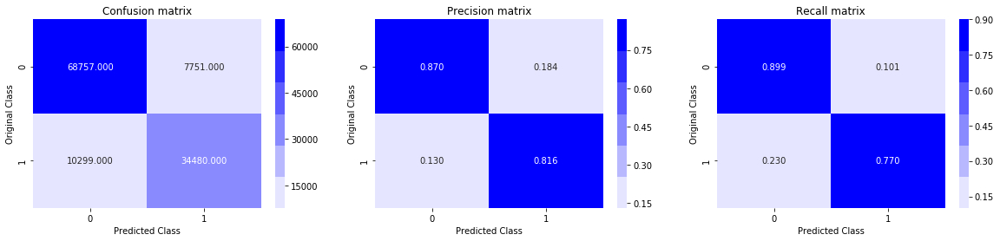


 Time taken: 1 hours 49 minutes and 58.73 seconds.


In [5]:
#Best Hyperparameters are: {'subsample': 0.6, 'n_estimators': 150, 'min_child_weight': 8, 'max_depth': 8, 'gamma': 0.25, 'colsample_bytree': 0.7}


#Training the model with the best params obtained using hyperparameter tuning
import xgboost as xgb
params = {}
params['objective'] = 'binary:logistic'
params['eval_metric'] = 'logloss'
params['eta'] = 0.02
params['max_depth'] = 8
params['subsample'] = 0.6
params['n_estimators'] = 150
params['min_child_weight'] = 8
params['gamma'] = 0.25
params['colsample_bytree'] = 0.7

start_time = timer(None) # timing starts from this point for "start_time" variable
d_train = xgb.DMatrix(X_train, label=y_train)
d_test = xgb.DMatrix(X_test, label=y_test)

watchlist = [(d_train, 'train'), (d_test, 'validation')]
bst = xgb.train(params, d_train, 1200, watchlist, early_stopping_rounds=20, verbose_eval=2)

xgdmat = xgb.DMatrix(X_train,y_train)
predict_y = bst.predict(d_test)
print("\nThe train log loss is:",log_loss(y_train, bst.predict(d_train), labels=[0, 1], eps=1e-15))
print("\nThe test log loss is:",log_loss(y_test, predict_y, labels=[0, 1], eps=1e-15))

predicted_y =np.array(predict_y>0.5,dtype=int)
print("\nTotal number of validation data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)
timer(start_time) # timing starts from this point for "start_time" variable

## 5.2 Logistic Regression - Using TF*IDF representations

In [2]:
#Load the TFIDF sparse matrices.
import pickle
with open('X_train_TFIDF.pkl', 'rb') as file:
    X_train = pickle.load(file)
    
with open('X_test_TFIDF.pkl', 'rb') as file:
    X_test = pickle.load(file)

with open('y_train_TFIDF.pkl', 'rb') as file:
    y_train = pickle.load(file)
    
with open('y_test_TFIDF.pkl', 'rb') as file:
    y_test = pickle.load(file)
    
print("Dimensions of train and test data:")
print("X_train:",X_train.shape, "y_train :",y_train.shape)
print("X_test:",X_test.shape, "y_test :",y_test.shape)

Dimensions of train and test data:
X_train: (283003, 147146) y_train : (283003, 1)
X_test: (121287, 147146) y_test : (121287, 1)


For values of C =  1e-05 The log loss is: 0.47528403382160284
For values of C =  3.359818286283781e-05 The log loss is: 0.4644363494339062
For values of C =  0.00011288378916846884 The log loss is: 0.45931194417210164
For values of C =  0.000379269019073225 The log loss is: 0.456615472088504
For values of C =  0.0012742749857031334 The log loss is: 0.45649148888554986
For values of C =  0.004281332398719391 The log loss is: 0.4538116062128731
For values of C =  0.01438449888287663 The log loss is: 0.45892678391137126
For values of C =  0.04832930238571752 The log loss is: 0.4570264193148789
For values of C =  0.1623776739188721 The log loss is: 0.4569916226796212
For values of C =  0.5455594781168515 The log loss is: 0.45618122344254236
For values of C =  1.8329807108324339 The log loss is: 0.4574346870498099
For values of C =  6.1584821106602545 The log loss is: 0.4574377184537728
For values of C =  20.6913808111479 The log loss is: 0.45522199536188085
For values of C =  69.5192796177

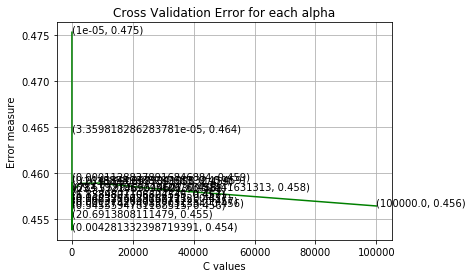

For values of best C =  0.004281332398719391 The train log loss is: 0.45633899698512154
For values of best C =  0.004281332398719391 The test log loss is: 0.4575878242313523

Total number of validation data points : 121287


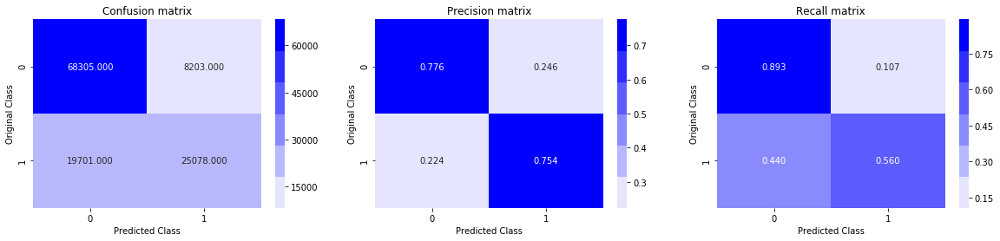

In [7]:
C_vals = np.logspace(-5,5,20) # hyperparam for LR classifier.

st=dt.now()
log_error_array=[]
for i in C_vals:
    clf = LogisticRegression(penalty='l2', C=i, multi_class='ovr', solver='lbfgs', random_state=0, n_jobs=-1) #Time taken by 'libgs' is about two minutes. For other's it's roughly about one hour.
    clf.fit(X_train, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(X_train, y_train)
    predict_y = sig_clf.predict_proba(X_test)
    log_error_array.append(log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of C = ', i, "The log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

print("Time taken to perform Hyperparameter tuning: ",dt.now()-st)

fig, ax = plt.subplots()
ax.plot(C_vals, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((C_vals[i],np.round(txt,3)), (C_vals[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("C values")
plt.ylabel("Error measure")
plt.show()

#Train the model with the best value of Hyperparameter.
best_C = np.argmin(log_error_array)
clf = LogisticRegression(penalty='l2', multi_class='ovr', solver='lbfgs', random_state=0, n_jobs=-1) #Time taken by 'libgs' is about two minutes. For other's it's roughly about one hour.
clf.fit(X_train, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_train, y_train)

predict_y = sig_clf.predict_proba(X_train)
print('For values of best C = ', C_vals[best_C], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(X_test)
print('For values of best C = ', C_vals[best_C], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
predicted_y = np.argmax(predict_y,axis=1)
print("\nTotal number of validation data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)

## 5.3 Logistic Regression with SGDClassifier with 'l1' penalty + Hyperparameter tuning -  Using TF*IDF representations

For values of alpha =  1e-05 The log loss is: 0.4472563936768041
For values of alpha =  2.3357214690901213e-05 The log loss is: 0.4540199150700537
For values of alpha =  5.4555947811685143e-05 The log loss is: 0.46982209323704993
For values of alpha =  0.00012742749857031334 The log loss is: 0.49121241464130233
For values of alpha =  0.00029763514416313193 The log loss is: 0.5034242656262481
For values of alpha =  0.0006951927961775605 The log loss is: 0.5079872451813526
For values of alpha =  0.001623776739188721 The log loss is: 0.5125149594032578
For values of alpha =  0.00379269019073225 The log loss is: 0.5151456905730273
For values of alpha =  0.008858667904100823 The log loss is: 0.5187190576830818
For values of alpha =  0.02069138081114788 The log loss is: 0.5184687789598725
For values of alpha =  0.04832930238571752 The log loss is: 0.5154287333431915
For values of alpha =  0.11288378916846883 The log loss is: 0.5042136955853856
For values of alpha =  0.26366508987303555 The l

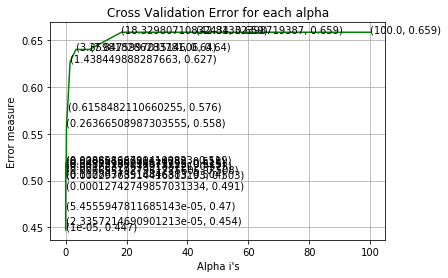

For values of best alpha =  1e-05 The train log loss is: 0.4467274605019805
For values of best alpha =  1e-05 The test log loss is: 0.4472563936768041

Total number of validation data points : 121287


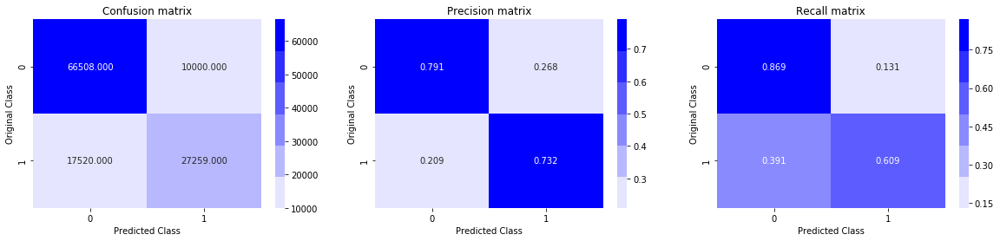

In [8]:
alpha = np.logspace(-5,2,20) # hyperparam for SGD classifier.

st=dt.now()
log_error_array=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l1', loss='log', random_state=42, n_jobs=-1)
    clf.fit(X_train, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(X_train, y_train)
    predict_y = sig_clf.predict_proba(X_test)
    log_error_array.append(log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

print("Time taken to perform Hyperparameter tuning: ",dt.now()-st)

fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()

#Train the model with the best value of Hyperparameter.
best_alpha = np.argmin(log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l1', loss='log', random_state=42, n_jobs=-1)
clf.fit(X_train, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_train, y_train)

predict_y = sig_clf.predict_proba(X_train)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(X_test)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
predicted_y = np.argmax(predict_y,axis=1)
print("\nTotal number of validation data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)

## 5.4 Logistic Regression with SGDClassifier with 'l2' penalty + Hyperparameter tuning - TFIDF Model

For values of alpha =  1e-05 The log loss is: 0.4491094225030333
For values of alpha =  2.3357214690901213e-05 The log loss is: 0.44478545447717116
For values of alpha =  5.4555947811685143e-05 The log loss is: 0.44904211826785223
For values of alpha =  0.00012742749857031334 The log loss is: 0.44160521688522875
For values of alpha =  0.00029763514416313193 The log loss is: 0.442342712602639
For values of alpha =  0.0006951927961775605 The log loss is: 0.45313415877648444
For values of alpha =  0.001623776739188721 The log loss is: 0.44899765132927977
For values of alpha =  0.00379269019073225 The log loss is: 0.4428405571050513
For values of alpha =  0.008858667904100823 The log loss is: 0.4468233764433642
For values of alpha =  0.02069138081114788 The log loss is: 0.4542724871352879
For values of alpha =  0.04832930238571752 The log loss is: 0.4602968597862595
For values of alpha =  0.11288378916846883 The log loss is: 0.46583986852154025
For values of alpha =  0.26366508987303555 Th

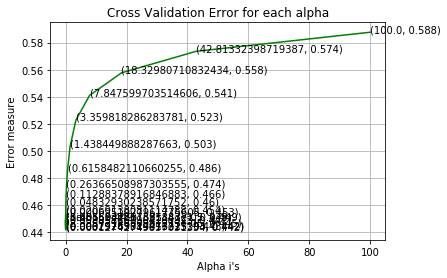

For values of best alpha =  0.00012742749857031334 The train log loss is: 0.44052774756664115
For values of best alpha =  0.00012742749857031334 The test log loss is: 0.44160521688522875

Total number of validation data points : 121287


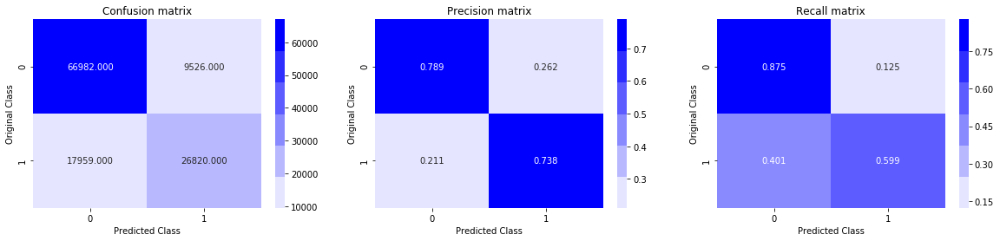

In [9]:
alpha = np.logspace(-5,2,20) # hyperparam for SGD classifier.

st=dt.now()
log_error_array=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42, n_jobs=-1)
    clf.fit(X_train, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(X_train, y_train)
    predict_y = sig_clf.predict_proba(X_test)
    log_error_array.append(log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

print("Time taken to perform Hyperparameter tuning: ",dt.now()-st)

fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()

#Train the model with the best value of Hyperparameter.
best_alpha = np.argmin(log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42, n_jobs=-1)
clf.fit(X_train, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_train, y_train)

predict_y = sig_clf.predict_proba(X_train)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(X_test)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
predicted_y = np.argmax(predict_y,axis=1)
print("\nTotal number of validation data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)

## 5.5 Linear SVM with SGDClassifier + Hyperparameter tuning - TFIDF Model

For values of alpha =  1e-05 The log loss is: 0.4452036947557074
For values of alpha =  2.3357214690901213e-05 The log loss is: 0.45769286594278324
For values of alpha =  5.4555947811685143e-05 The log loss is: 0.4698467995052274
For values of alpha =  0.00012742749857031334 The log loss is: 0.49282169088990857
For values of alpha =  0.00029763514416313193 The log loss is: 0.5036116028254444
For values of alpha =  0.0006951927961775605 The log loss is: 0.5086210807287471
For values of alpha =  0.001623776739188721 The log loss is: 0.5123922234669638
For values of alpha =  0.00379269019073225 The log loss is: 0.5138938157099444
For values of alpha =  0.008858667904100823 The log loss is: 0.5159681124981125
For values of alpha =  0.02069138081114788 The log loss is: 0.5134916335972257
For values of alpha =  0.04832930238571752 The log loss is: 0.5228351373414909
For values of alpha =  0.11288378916846883 The log loss is: 0.5087319087144415
For values of alpha =  0.26366508987303555 The l

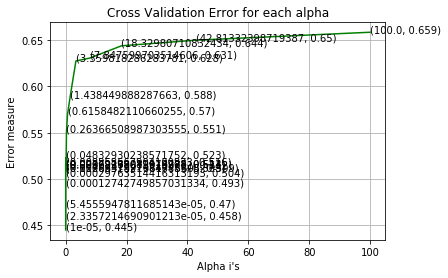

For values of best alpha =  1e-05 The train log loss is: 0.4448767889294988
For values of best alpha =  1e-05 The test log loss is: 0.4452036947557074

Total number of validation data points : 121287


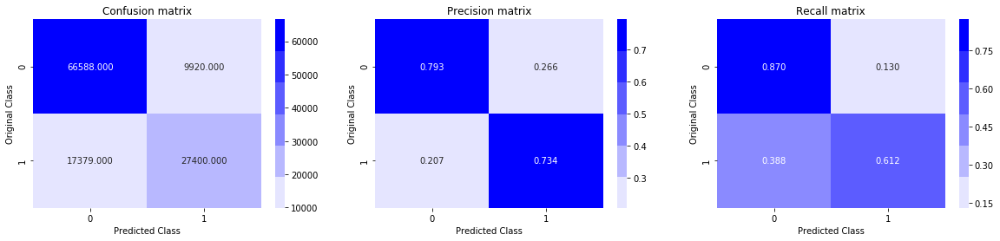

In [10]:
alpha = np.logspace(-5,2,20) # hyperparam for SGD classifier.

st=dt.now()
log_error_array=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l1', loss='hinge', random_state=42, n_jobs=-1)
    clf.fit(X_train, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(X_train, y_train)
    predict_y = sig_clf.predict_proba(X_test)
    log_error_array.append(log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

print("Time taken to perform Hyperparameter tuning: ",dt.now()-st)

fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()

#Train the model with the best value of Hyperparameter.
best_alpha = np.argmin(log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l1', loss='hinge', random_state=42, n_jobs=-1)
clf.fit(X_train, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_train, y_train)

predict_y = sig_clf.predict_proba(X_train)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(X_test)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
predicted_y = np.argmax(predict_y,axis=1)
print("\nTotal number of validation data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)

<h2> 5.6 XGBoost Classifier - Using the TFIDF Scores. </h2>

[10:35:55] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 340 extra nodes, 0 pruned nodes, max_depth=8
[0]	train-logloss:0.683177	validation-logloss:0.683219
Multiple eval metrics have been passed: 'validation-logloss' will be used for early stopping.

Will train until validation-logloss hasn't improved in 20 rounds.
[10:35:56] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 358 extra nodes, 0 pruned nodes, max_depth=8
[10:35:57] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 334 extra nodes, 2 pruned nodes, max_depth=8
[2]	train-logloss:0.664298	validation-logloss:0.664435
[10:35:58] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 298 extra nodes, 2 pruned nodes, max_depth=8
[10:36:00] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 338 extra nodes, 4 pruned nodes, max_depth=8
[4]	train-logloss:0.649231	validation-logloss:0.649423
[10:36:01] /workspace/src/tree/updater_prune.cc:74: tr

[10:37:02] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 342 extra nodes, 4 pruned nodes, max_depth=8
[10:37:03] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 322 extra nodes, 0 pruned nodes, max_depth=8
[54]	train-logloss:0.435485	validation-logloss:0.438212
[10:37:05] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 320 extra nodes, 8 pruned nodes, max_depth=8
[10:37:06] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 342 extra nodes, 4 pruned nodes, max_depth=8
[56]	train-logloss:0.431346	validation-logloss:0.434175
[10:37:07] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 294 extra nodes, 2 pruned nodes, max_depth=8
[10:37:08] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 304 extra nodes, 6 pruned nodes, max_depth=8
[58]	train-logloss:0.427632	validation-logloss:0.430541
[10:37:10] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 344 extra

[10:38:12] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 256 extra nodes, 0 pruned nodes, max_depth=8
[10:38:14] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 264 extra nodes, 0 pruned nodes, max_depth=8
[108]	train-logloss:0.36828	validation-logloss:0.373239
[10:38:15] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 288 extra nodes, 2 pruned nodes, max_depth=8
[10:38:17] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 268 extra nodes, 6 pruned nodes, max_depth=8
[110]	train-logloss:0.366876	validation-logloss:0.371919
[10:38:18] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 240 extra nodes, 2 pruned nodes, max_depth=8
[10:38:19] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 200 extra nodes, 8 pruned nodes, max_depth=8
[112]	train-logloss:0.365614	validation-logloss:0.370718
[10:38:21] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 278 ext

[10:39:20] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 146 extra nodes, 2 pruned nodes, max_depth=8
[10:39:21] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 224 extra nodes, 0 pruned nodes, max_depth=8
[162]	train-logloss:0.343304	validation-logloss:0.35015
[10:39:22] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 202 extra nodes, 0 pruned nodes, max_depth=8
[10:39:23] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 128 extra nodes, 0 pruned nodes, max_depth=8
[164]	train-logloss:0.342787	validation-logloss:0.349665
[10:39:24] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 164 extra nodes, 2 pruned nodes, max_depth=8
[10:39:26] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 174 extra nodes, 2 pruned nodes, max_depth=8
[166]	train-logloss:0.342225	validation-logloss:0.349162
[10:39:27] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 180 ext

[10:40:22] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 188 extra nodes, 0 pruned nodes, max_depth=8
[10:40:23] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 166 extra nodes, 2 pruned nodes, max_depth=8
[216]	train-logloss:0.332649	validation-logloss:0.340555
[10:40:24] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 160 extra nodes, 2 pruned nodes, max_depth=8
[10:40:25] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 82 extra nodes, 4 pruned nodes, max_depth=8
[218]	train-logloss:0.332371	validation-logloss:0.34031
[10:40:26] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 72 extra nodes, 0 pruned nodes, max_depth=8
[10:40:27] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 82 extra nodes, 2 pruned nodes, max_depth=8
[220]	train-logloss:0.332185	validation-logloss:0.340145
[10:40:29] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 92 extra n

[10:41:26] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 86 extra nodes, 2 pruned nodes, max_depth=8
[10:41:27] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 158 extra nodes, 0 pruned nodes, max_depth=8
[270]	train-logloss:0.326722	validation-logloss:0.335483
[10:41:28] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 66 extra nodes, 4 pruned nodes, max_depth=8
[10:41:29] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 112 extra nodes, 0 pruned nodes, max_depth=8
[272]	train-logloss:0.326584	validation-logloss:0.335364
[10:41:30] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 68 extra nodes, 2 pruned nodes, max_depth=8
[10:41:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 162 extra nodes, 8 pruned nodes, max_depth=8
[274]	train-logloss:0.326348	validation-logloss:0.335157
[10:41:33] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 156 extra

[10:42:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 74 extra nodes, 0 pruned nodes, max_depth=8
[10:42:33] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 186 extra nodes, 4 pruned nodes, max_depth=8
[324]	train-logloss:0.321969	validation-logloss:0.331584
[10:42:35] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 224 extra nodes, 2 pruned nodes, max_depth=8
[10:42:36] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52 extra nodes, 0 pruned nodes, max_depth=8
[326]	train-logloss:0.321751	validation-logloss:0.331405
[10:42:37] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 94 extra nodes, 2 pruned nodes, max_depth=8
[10:42:39] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 80 extra nodes, 0 pruned nodes, max_depth=8
[328]	train-logloss:0.321638	validation-logloss:0.33132
[10:42:40] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 74 extra no

[10:43:47] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 56 extra nodes, 0 pruned nodes, max_depth=8
[378]	train-logloss:0.318472	validation-logloss:0.328862
[10:43:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 68 extra nodes, 0 pruned nodes, max_depth=8
[10:43:50] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 128 extra nodes, 2 pruned nodes, max_depth=8
[380]	train-logloss:0.318337	validation-logloss:0.328759
[10:43:51] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 102 extra nodes, 0 pruned nodes, max_depth=8
[10:43:52] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 110 extra nodes, 0 pruned nodes, max_depth=8
[382]	train-logloss:0.318184	validation-logloss:0.328635
[10:43:54] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 80 extra nodes, 0 pruned nodes, max_depth=8
[10:43:55] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50 extra 

[10:44:54] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 58 extra nodes, 0 pruned nodes, max_depth=8
[10:44:56] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 62 extra nodes, 0 pruned nodes, max_depth=8
[434]	train-logloss:0.315273	validation-logloss:0.326479
[10:44:57] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 68 extra nodes, 0 pruned nodes, max_depth=8
[10:44:58] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 64 extra nodes, 2 pruned nodes, max_depth=8
[436]	train-logloss:0.315198	validation-logloss:0.326429
[10:44:59] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 60 extra nodes, 2 pruned nodes, max_depth=8
[10:45:00] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 112 extra nodes, 0 pruned nodes, max_depth=8
[438]	train-logloss:0.315081	validation-logloss:0.326348
[10:45:02] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 64 extra no

[10:46:01] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 68 extra nodes, 0 pruned nodes, max_depth=8
[488]	train-logloss:0.312532	validation-logloss:0.324479
[10:46:02] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 138 extra nodes, 2 pruned nodes, max_depth=8
[10:46:04] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50 extra nodes, 0 pruned nodes, max_depth=8
[490]	train-logloss:0.312443	validation-logloss:0.324416
[10:46:05] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 78 extra nodes, 0 pruned nodes, max_depth=8
[10:46:06] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 64 extra nodes, 0 pruned nodes, max_depth=8
[492]	train-logloss:0.312382	validation-logloss:0.324377
[10:46:07] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 146 extra nodes, 0 pruned nodes, max_depth=8
[10:46:08] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 70 extra n

[10:47:06] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 62 extra nodes, 0 pruned nodes, max_depth=8
[10:47:07] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 66 extra nodes, 0 pruned nodes, max_depth=8
[544]	train-logloss:0.310055	validation-logloss:0.322739
[10:47:09] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=8
[10:47:10] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 78 extra nodes, 2 pruned nodes, max_depth=8
[546]	train-logloss:0.310002	validation-logloss:0.322703
[10:47:11] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52 extra nodes, 0 pruned nodes, max_depth=8
[10:47:12] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 110 extra nodes, 2 pruned nodes, max_depth=8
[548]	train-logloss:0.309931	validation-logloss:0.322652
[10:47:13] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44 extra no

[10:48:10] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50 extra nodes, 0 pruned nodes, max_depth=8
[598]	train-logloss:0.308047	validation-logloss:0.321354
[10:48:12] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 236 extra nodes, 0 pruned nodes, max_depth=8
[10:48:13] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 48 extra nodes, 0 pruned nodes, max_depth=8
[600]	train-logloss:0.3079	validation-logloss:0.321247
[10:48:14] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 100 extra nodes, 0 pruned nodes, max_depth=8
[10:48:15] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 92 extra nodes, 0 pruned nodes, max_depth=8
[602]	train-logloss:0.307808	validation-logloss:0.321185
[10:48:17] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 68 extra nodes, 0 pruned nodes, max_depth=8
[10:48:18] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 74 extra nod

[10:49:14] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 164 extra nodes, 2 pruned nodes, max_depth=8
[10:49:16] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 122 extra nodes, 0 pruned nodes, max_depth=8
[654]	train-logloss:0.305865	validation-logloss:0.319868
[10:49:17] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52 extra nodes, 0 pruned nodes, max_depth=8
[10:49:18] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 82 extra nodes, 0 pruned nodes, max_depth=8
[656]	train-logloss:0.305791	validation-logloss:0.319815
[10:49:19] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 72 extra nodes, 0 pruned nodes, max_depth=8
[10:49:20] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[658]	train-logloss:0.305731	validation-logloss:0.319772
[10:49:21] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra n

[10:50:19] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 74 extra nodes, 0 pruned nodes, max_depth=8
[708]	train-logloss:0.30396	validation-logloss:0.31859
[10:50:20] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40 extra nodes, 0 pruned nodes, max_depth=8
[10:50:22] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 62 extra nodes, 0 pruned nodes, max_depth=8
[710]	train-logloss:0.303912	validation-logloss:0.318561
[10:50:23] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52 extra nodes, 0 pruned nodes, max_depth=8
[10:50:24] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=8
[712]	train-logloss:0.303871	validation-logloss:0.318539
[10:50:25] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44 extra nodes, 0 pruned nodes, max_depth=8
[10:50:26] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 56 extra nodes

[10:51:22] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra nodes, 0 pruned nodes, max_depth=8
[10:51:23] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[764]	train-logloss:0.302096	validation-logloss:0.317429
[10:51:24] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=8
[10:51:26] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 68 extra nodes, 0 pruned nodes, max_depth=8
[766]	train-logloss:0.302047	validation-logloss:0.317393
[10:51:27] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40 extra nodes, 0 pruned nodes, max_depth=8
[10:51:28] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50 extra nodes, 0 pruned nodes, max_depth=8
[768]	train-logloss:0.302007	validation-logloss:0.317364
[10:51:29] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 204 extra no

[10:52:25] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50 extra nodes, 0 pruned nodes, max_depth=8
[818]	train-logloss:0.300448	validation-logloss:0.316334
[10:52:26] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 58 extra nodes, 0 pruned nodes, max_depth=8
[10:52:28] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra nodes, 0 pruned nodes, max_depth=8
[820]	train-logloss:0.300414	validation-logloss:0.316308
[10:52:29] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42 extra nodes, 0 pruned nodes, max_depth=8
[10:52:30] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 58 extra nodes, 0 pruned nodes, max_depth=8
[822]	train-logloss:0.300365	validation-logloss:0.316279
[10:52:31] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 118 extra nodes, 0 pruned nodes, max_depth=8
[10:52:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34 extra no

[10:53:28] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 48 extra nodes, 0 pruned nodes, max_depth=8
[10:53:29] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 64 extra nodes, 2 pruned nodes, max_depth=8
[874]	train-logloss:0.298813	validation-logloss:0.315338
[10:53:31] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 62 extra nodes, 0 pruned nodes, max_depth=8
[10:53:31] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra nodes, 0 pruned nodes, max_depth=8
[876]	train-logloss:0.298767	validation-logloss:0.315304
[10:53:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 60 extra nodes, 0 pruned nodes, max_depth=8
[10:53:34] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34 extra nodes, 0 pruned nodes, max_depth=8
[878]	train-logloss:0.298731	validation-logloss:0.315285
[10:53:35] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra nod

[10:54:29] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 76 extra nodes, 0 pruned nodes, max_depth=8
[928]	train-logloss:0.297544	validation-logloss:0.31453
[10:54:30] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 58 extra nodes, 0 pruned nodes, max_depth=8
[10:54:31] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 254 extra nodes, 0 pruned nodes, max_depth=8
[930]	train-logloss:0.297401	validation-logloss:0.314445
[10:54:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 60 extra nodes, 0 pruned nodes, max_depth=8
[10:54:34] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44 extra nodes, 0 pruned nodes, max_depth=8
[932]	train-logloss:0.297364	validation-logloss:0.314429
[10:54:35] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 74 extra nodes, 0 pruned nodes, max_depth=8
[10:54:36] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nod

[10:55:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34 extra nodes, 0 pruned nodes, max_depth=8
[10:55:33] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42 extra nodes, 0 pruned nodes, max_depth=8
[984]	train-logloss:0.296093	validation-logloss:0.313713
[10:55:34] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 56 extra nodes, 0 pruned nodes, max_depth=8
[10:55:35] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra nodes, 0 pruned nodes, max_depth=8
[986]	train-logloss:0.296062	validation-logloss:0.3137
[10:55:37] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44 extra nodes, 0 pruned nodes, max_depth=8
[10:55:38] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra nodes, 0 pruned nodes, max_depth=8
[988]	train-logloss:0.296031	validation-logloss:0.31368
[10:55:39] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 72 extra nodes,

[10:56:33] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52 extra nodes, 0 pruned nodes, max_depth=8
[10:56:35] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 56 extra nodes, 0 pruned nodes, max_depth=8
[1038]	train-logloss:0.295093	validation-logloss:0.313141
[10:56:36] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34 extra nodes, 0 pruned nodes, max_depth=8
[10:56:37] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 54 extra nodes, 2 pruned nodes, max_depth=8
[1040]	train-logloss:0.29506	validation-logloss:0.313124
[10:56:38] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50 extra nodes, 0 pruned nodes, max_depth=8
[10:56:39] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38 extra nodes, 0 pruned nodes, max_depth=8
[1042]	train-logloss:0.295021	validation-logloss:0.313098
[10:56:40] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40 extra n

[10:57:33] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52 extra nodes, 0 pruned nodes, max_depth=8
[10:57:35] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 60 extra nodes, 0 pruned nodes, max_depth=8
[1092]	train-logloss:0.293792	validation-logloss:0.312375
[10:57:36] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=8
[10:57:37] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=8
[1094]	train-logloss:0.293763	validation-logloss:0.312355
[10:57:38] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 104 extra nodes, 0 pruned nodes, max_depth=8
[10:57:40] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38 extra nodes, 0 pruned nodes, max_depth=8
[1096]	train-logloss:0.293693	validation-logloss:0.312309
[10:57:41] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42 extra

[10:58:36] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 54 extra nodes, 0 pruned nodes, max_depth=8
[10:58:37] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 86 extra nodes, 0 pruned nodes, max_depth=8
[1146]	train-logloss:0.292595	validation-logloss:0.311662
[10:58:39] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra nodes, 0 pruned nodes, max_depth=8
[10:58:40] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 58 extra nodes, 0 pruned nodes, max_depth=8
[1148]	train-logloss:0.292568	validation-logloss:0.311651
[10:58:41] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 54 extra nodes, 0 pruned nodes, max_depth=8
[10:58:42] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 68 extra nodes, 0 pruned nodes, max_depth=8
[1150]	train-logloss:0.292527	validation-logloss:0.311628
[10:58:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra 

[10:59:37] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra nodes, 0 pruned nodes, max_depth=8
[10:59:38] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 86 extra nodes, 2 pruned nodes, max_depth=8
[1200]	train-logloss:0.291602	validation-logloss:0.311122
[10:59:40] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42 extra nodes, 0 pruned nodes, max_depth=8
[10:59:41] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 48 extra nodes, 0 pruned nodes, max_depth=8
[1202]	train-logloss:0.29157	validation-logloss:0.311106
[10:59:42] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38 extra nodes, 0 pruned nodes, max_depth=8
[10:59:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 58 extra nodes, 0 pruned nodes, max_depth=8
[1204]	train-logloss:0.291539	validation-logloss:0.311089
[10:59:44] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40 extra n

[11:00:39] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[11:00:40] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=8
[1254]	train-logloss:0.290541	validation-logloss:0.310506
[11:00:41] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40 extra nodes, 0 pruned nodes, max_depth=8
[11:00:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 58 extra nodes, 0 pruned nodes, max_depth=8
[1256]	train-logloss:0.290505	validation-logloss:0.310487
[11:00:44] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra nodes, 0 pruned nodes, max_depth=8
[11:00:45] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=8
[1258]	train-logloss:0.290478	validation-logloss:0.310472
[11:00:46] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra 

[11:01:39] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 78 extra nodes, 0 pruned nodes, max_depth=8
[11:01:40] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 100 extra nodes, 2 pruned nodes, max_depth=8
[1308]	train-logloss:0.28954	validation-logloss:0.309978
[11:01:42] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 72 extra nodes, 0 pruned nodes, max_depth=8
[11:01:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 148 extra nodes, 0 pruned nodes, max_depth=8
[1310]	train-logloss:0.289456	validation-logloss:0.309936
[11:01:44] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34 extra nodes, 0 pruned nodes, max_depth=8
[11:01:45] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[1312]	train-logloss:0.289433	validation-logloss:0.309925
[11:01:46] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra

[11:02:40] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44 extra nodes, 0 pruned nodes, max_depth=8
[11:02:41] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50 extra nodes, 0 pruned nodes, max_depth=8
[1362]	train-logloss:0.288551	validation-logloss:0.309452
[11:02:42] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=8
[11:02:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[1364]	train-logloss:0.288531	validation-logloss:0.309438
[11:02:45] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52 extra nodes, 0 pruned nodes, max_depth=8
[11:02:46] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 54 extra nodes, 0 pruned nodes, max_depth=8
[1366]	train-logloss:0.288498	validation-logloss:0.309422
[11:02:47] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra 

[11:03:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38 extra nodes, 0 pruned nodes, max_depth=8
[11:03:44] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42 extra nodes, 0 pruned nodes, max_depth=8
[1416]	train-logloss:0.287474	validation-logloss:0.308856
[11:03:46] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 60 extra nodes, 0 pruned nodes, max_depth=8
[11:03:47] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 64 extra nodes, 0 pruned nodes, max_depth=8
[1418]	train-logloss:0.287434	validation-logloss:0.308838
[11:03:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 92 extra nodes, 2 pruned nodes, max_depth=8
[11:03:49] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 76 extra nodes, 2 pruned nodes, max_depth=8
[1420]	train-logloss:0.287371	validation-logloss:0.308813
[11:03:50] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra 

[11:04:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[11:04:44] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 52 extra nodes, 0 pruned nodes, max_depth=8
[1470]	train-logloss:0.286451	validation-logloss:0.308327
[11:04:45] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 102 extra nodes, 0 pruned nodes, max_depth=8
[11:04:46] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 68 extra nodes, 2 pruned nodes, max_depth=8
[1472]	train-logloss:0.286377	validation-logloss:0.308284
[11:04:47] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=8
[11:04:49] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22 extra nodes, 0 pruned nodes, max_depth=8
[1474]	train-logloss:0.286358	validation-logloss:0.308272
[11:04:50] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra

[11:05:45] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 90 extra nodes, 0 pruned nodes, max_depth=8
[11:05:46] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42 extra nodes, 2 pruned nodes, max_depth=8
[1524]	train-logloss:0.285426	validation-logloss:0.307796
[11:05:47] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=8
[11:05:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra nodes, 0 pruned nodes, max_depth=8
[1526]	train-logloss:0.285407	validation-logloss:0.307785
[11:05:49] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra nodes, 0 pruned nodes, max_depth=8
[11:05:50] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra nodes, 0 pruned nodes, max_depth=8
[1528]	train-logloss:0.285386	validation-logloss:0.307778
[11:05:51] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 62 extra 

[11:06:49] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34 extra nodes, 0 pruned nodes, max_depth=8
[11:06:51] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra nodes, 0 pruned nodes, max_depth=8
[1578]	train-logloss:0.284501	validation-logloss:0.307296
[11:06:52] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34 extra nodes, 0 pruned nodes, max_depth=8
[11:06:53] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 48 extra nodes, 2 pruned nodes, max_depth=8
[1580]	train-logloss:0.284478	validation-logloss:0.307286
[11:06:54] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra nodes, 0 pruned nodes, max_depth=8
[11:06:55] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[1582]	train-logloss:0.284461	validation-logloss:0.307276
[11:06:56] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra 

[11:07:50] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=8
[11:07:51] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18 extra nodes, 0 pruned nodes, max_depth=8
[1632]	train-logloss:0.283567	validation-logloss:0.306849
[11:07:53] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=8
[11:07:54] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 48 extra nodes, 0 pruned nodes, max_depth=8
[1634]	train-logloss:0.283537	validation-logloss:0.306829
[11:07:55] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34 extra nodes, 0 pruned nodes, max_depth=8
[11:07:56] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[1636]	train-logloss:0.283499	validation-logloss:0.306803
[11:07:57] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 54 extra 

[11:08:54] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 48 extra nodes, 0 pruned nodes, max_depth=8
[11:08:55] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[1686]	train-logloss:0.282734	validation-logloss:0.306402
[11:08:56] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44 extra nodes, 0 pruned nodes, max_depth=8
[11:08:58] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra nodes, 0 pruned nodes, max_depth=8
[1688]	train-logloss:0.282713	validation-logloss:0.306385
[11:08:59] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 88 extra nodes, 0 pruned nodes, max_depth=8
[11:09:00] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50 extra nodes, 0 pruned nodes, max_depth=8
[1690]	train-logloss:0.282651	validation-logloss:0.306349
[11:09:01] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34 extra 

[11:09:56] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=8
[11:09:57] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22 extra nodes, 0 pruned nodes, max_depth=8
[1740]	train-logloss:0.281788	validation-logloss:0.305923
[11:09:58] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42 extra nodes, 0 pruned nodes, max_depth=8
[11:09:59] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18 extra nodes, 0 pruned nodes, max_depth=8
[1742]	train-logloss:0.28177	validation-logloss:0.305912
[11:10:00] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42 extra nodes, 0 pruned nodes, max_depth=8
[11:10:01] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 104 extra nodes, 0 pruned nodes, max_depth=8
[1744]	train-logloss:0.281723	validation-logloss:0.305899
[11:10:03] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 74 extra 

[11:11:01] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34 extra nodes, 0 pruned nodes, max_depth=8
[11:11:02] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 60 extra nodes, 0 pruned nodes, max_depth=8
[1794]	train-logloss:0.281043	validation-logloss:0.305591
[11:11:03] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 64 extra nodes, 0 pruned nodes, max_depth=8
[11:11:04] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40 extra nodes, 0 pruned nodes, max_depth=8
[1796]	train-logloss:0.281011	validation-logloss:0.305579
[11:11:06] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra nodes, 0 pruned nodes, max_depth=8
[11:11:07] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[1798]	train-logloss:0.280996	validation-logloss:0.305572
[11:11:08] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra 

[11:12:06] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=8
[11:12:07] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38 extra nodes, 0 pruned nodes, max_depth=8
[1848]	train-logloss:0.280283	validation-logloss:0.305226
[11:12:08] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[11:12:09] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34 extra nodes, 0 pruned nodes, max_depth=8
[1850]	train-logloss:0.280265	validation-logloss:0.305221
[11:12:10] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 56 extra nodes, 0 pruned nodes, max_depth=8
[11:12:11] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38 extra nodes, 0 pruned nodes, max_depth=8
[1852]	train-logloss:0.280239	validation-logloss:0.305204
[11:12:13] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra 

[11:13:09] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 62 extra nodes, 2 pruned nodes, max_depth=8
[11:13:10] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=8
[1902]	train-logloss:0.2794	validation-logloss:0.304785
[11:13:11] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=8
[11:13:12] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 4 pruned nodes, max_depth=8
[1904]	train-logloss:0.279383	validation-logloss:0.304776
[11:13:13] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 100 extra nodes, 0 pruned nodes, max_depth=8
[11:13:15] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=8
[1906]	train-logloss:0.279351	validation-logloss:0.304764
[11:13:16] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 100 extra 

[11:14:11] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=8
[11:14:12] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=8
[1956]	train-logloss:0.278577	validation-logloss:0.304408
[11:14:14] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=8
[11:14:14] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=8
[1958]	train-logloss:0.278556	validation-logloss:0.304395
[11:14:16] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=8
[11:14:17] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18 extra nodes, 0 pruned nodes, max_depth=8
[1960]	train-logloss:0.278538	validation-logloss:0.304388
[11:14:18] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 72 extra 

[11:15:13] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=8
[11:15:15] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 48 extra nodes, 2 pruned nodes, max_depth=8
[2010]	train-logloss:0.277866	validation-logloss:0.304062
[11:15:16] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22 extra nodes, 0 pruned nodes, max_depth=8
[11:15:17] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 74 extra nodes, 0 pruned nodes, max_depth=8
[2012]	train-logloss:0.27784	validation-logloss:0.304049
[11:15:18] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra nodes, 0 pruned nodes, max_depth=8
[11:15:19] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44 extra nodes, 0 pruned nodes, max_depth=8
[2014]	train-logloss:0.27782	validation-logloss:0.304044
[11:15:20] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra no

[11:16:16] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=8
[11:16:17] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 194 extra nodes, 0 pruned nodes, max_depth=8
[2064]	train-logloss:0.277018	validation-logloss:0.303637
[11:16:18] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 78 extra nodes, 0 pruned nodes, max_depth=8
[11:16:19] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra nodes, 0 pruned nodes, max_depth=8
[2066]	train-logloss:0.276988	validation-logloss:0.303628
[11:16:21] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40 extra nodes, 0 pruned nodes, max_depth=8
[11:16:22] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[2068]	train-logloss:0.276971	validation-logloss:0.303622
[11:16:23] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra

[11:17:18] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[11:17:19] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra nodes, 0 pruned nodes, max_depth=8
[2118]	train-logloss:0.276433	validation-logloss:0.303359
[11:17:20] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22 extra nodes, 0 pruned nodes, max_depth=8
[11:17:21] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra nodes, 0 pruned nodes, max_depth=8
[2120]	train-logloss:0.27642	validation-logloss:0.303352
[11:17:23] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 58 extra nodes, 0 pruned nodes, max_depth=8
[11:17:24] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra nodes, 0 pruned nodes, max_depth=8
[2122]	train-logloss:0.276396	validation-logloss:0.303341
[11:17:25] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40 extra n

[11:18:20] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 136 extra nodes, 0 pruned nodes, max_depth=8
[11:18:21] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34 extra nodes, 0 pruned nodes, max_depth=8
[2172]	train-logloss:0.275719	validation-logloss:0.303011
[11:18:22] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra nodes, 0 pruned nodes, max_depth=8
[11:18:24] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40 extra nodes, 0 pruned nodes, max_depth=8
[2174]	train-logloss:0.2757	validation-logloss:0.303008
[11:18:25] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[11:18:26] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22 extra nodes, 0 pruned nodes, max_depth=8
[2176]	train-logloss:0.275684	validation-logloss:0.302999
[11:18:27] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40 extra n

[11:19:23] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 70 extra nodes, 0 pruned nodes, max_depth=8
[11:19:25] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra nodes, 0 pruned nodes, max_depth=8
[2226]	train-logloss:0.27506	validation-logloss:0.302714
[11:19:26] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra nodes, 0 pruned nodes, max_depth=8
[11:19:27] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 74 extra nodes, 0 pruned nodes, max_depth=8
[2228]	train-logloss:0.275023	validation-logloss:0.302698
[11:19:28] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=8
[11:19:30] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra nodes, 0 pruned nodes, max_depth=8
[2230]	train-logloss:0.27501	validation-logloss:0.302691
[11:19:31] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra no

[11:20:25] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34 extra nodes, 0 pruned nodes, max_depth=8
[11:20:26] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=8
[2280]	train-logloss:0.274391	validation-logloss:0.302435
[11:20:27] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50 extra nodes, 0 pruned nodes, max_depth=8
[11:20:28] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50 extra nodes, 0 pruned nodes, max_depth=8
[2282]	train-logloss:0.274363	validation-logloss:0.302418
[11:20:30] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=8
[11:20:31] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra nodes, 0 pruned nodes, max_depth=8
[2284]	train-logloss:0.274346	validation-logloss:0.302414
[11:20:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50 extra 

[11:21:27] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44 extra nodes, 0 pruned nodes, max_depth=8
[11:21:29] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 92 extra nodes, 0 pruned nodes, max_depth=8
[2334]	train-logloss:0.273705	validation-logloss:0.302154
[11:21:30] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 56 extra nodes, 0 pruned nodes, max_depth=8
[11:21:31] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra nodes, 0 pruned nodes, max_depth=8
[2336]	train-logloss:0.273681	validation-logloss:0.302146
[11:21:32] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50 extra nodes, 0 pruned nodes, max_depth=8
[11:21:34] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[2338]	train-logloss:0.273661	validation-logloss:0.302139
[11:21:35] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra 

[11:22:33] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra nodes, 0 pruned nodes, max_depth=8
[11:22:34] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44 extra nodes, 0 pruned nodes, max_depth=8
[2388]	train-logloss:0.273038	validation-logloss:0.301868
[11:22:35] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 2 pruned nodes, max_depth=8
[11:22:36] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 136 extra nodes, 0 pruned nodes, max_depth=8
[2390]	train-logloss:0.272966	validation-logloss:0.301833
[11:22:38] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra nodes, 0 pruned nodes, max_depth=8
[11:22:39] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra nodes, 0 pruned nodes, max_depth=8
[2392]	train-logloss:0.272952	validation-logloss:0.30183
[11:22:40] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 58 extra 

[11:23:35] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=8
[11:23:37] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra nodes, 0 pruned nodes, max_depth=8
[2442]	train-logloss:0.272361	validation-logloss:0.301616
[11:23:38] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 78 extra nodes, 0 pruned nodes, max_depth=8
[11:23:39] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18 extra nodes, 0 pruned nodes, max_depth=8
[2444]	train-logloss:0.272338	validation-logloss:0.30161
[11:23:40] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra nodes, 0 pruned nodes, max_depth=8
[11:23:41] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=8
[2446]	train-logloss:0.27232	validation-logloss:0.301602
[11:23:42] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38 extra no

[11:24:39] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 34 extra nodes, 0 pruned nodes, max_depth=8
[11:24:40] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40 extra nodes, 2 pruned nodes, max_depth=8
[2496]	train-logloss:0.271762	validation-logloss:0.301339
[11:24:42] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38 extra nodes, 0 pruned nodes, max_depth=8
[11:24:43] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra nodes, 0 pruned nodes, max_depth=8
[2498]	train-logloss:0.271749	validation-logloss:0.301335
[11:24:44] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 100 extra nodes, 0 pruned nodes, max_depth=8
[11:24:45] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 40 extra nodes, 0 pruned nodes, max_depth=8
[2500]	train-logloss:0.271701	validation-logloss:0.30131
[11:24:46] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra 

[11:25:44] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50 extra nodes, 0 pruned nodes, max_depth=8
[11:25:45] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 82 extra nodes, 2 pruned nodes, max_depth=8
[2550]	train-logloss:0.271102	validation-logloss:0.301078
[11:25:47] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 58 extra nodes, 0 pruned nodes, max_depth=8
[11:25:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 42 extra nodes, 0 pruned nodes, max_depth=8
[2552]	train-logloss:0.271073	validation-logloss:0.301065
[11:25:49] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra nodes, 0 pruned nodes, max_depth=8
[11:25:50] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra nodes, 0 pruned nodes, max_depth=8
[2554]	train-logloss:0.271059	validation-logloss:0.301058
[11:25:52] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra 

[11:26:47] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[11:26:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 128 extra nodes, 0 pruned nodes, max_depth=8
[2604]	train-logloss:0.2704	validation-logloss:0.300786
[11:26:49] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[11:26:50] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 90 extra nodes, 0 pruned nodes, max_depth=8
[2606]	train-logloss:0.270367	validation-logloss:0.300777
[11:26:51] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 106 extra nodes, 2 pruned nodes, max_depth=8
[11:26:52] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 134 extra nodes, 0 pruned nodes, max_depth=8
[2608]	train-logloss:0.270297	validation-logloss:0.30074
[11:26:53] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra 

[11:27:48] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 94 extra nodes, 0 pruned nodes, max_depth=8
[11:27:50] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 30 extra nodes, 0 pruned nodes, max_depth=8
[2658]	train-logloss:0.269735	validation-logloss:0.300466
[11:27:51] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22 extra nodes, 0 pruned nodes, max_depth=8
[11:27:52] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra nodes, 0 pruned nodes, max_depth=8
[2660]	train-logloss:0.269724	validation-logloss:0.300462
[11:27:53] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=8
[11:27:54] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44 extra nodes, 0 pruned nodes, max_depth=8
[2662]	train-logloss:0.269705	validation-logloss:0.300455
[11:27:55] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 82 extra 

[11:28:50] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 76 extra nodes, 0 pruned nodes, max_depth=8
[11:28:52] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44 extra nodes, 0 pruned nodes, max_depth=8
[2712]	train-logloss:0.269149	validation-logloss:0.300225
[11:28:53] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38 extra nodes, 0 pruned nodes, max_depth=8
[11:28:54] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra nodes, 0 pruned nodes, max_depth=8
[2714]	train-logloss:0.269136	validation-logloss:0.300219
[11:28:55] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=8
[11:28:56] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 32 extra nodes, 2 pruned nodes, max_depth=8
[2716]	train-logloss:0.269121	validation-logloss:0.300214
[11:28:57] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra 

[11:29:52] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra nodes, 0 pruned nodes, max_depth=8
[11:29:53] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra nodes, 0 pruned nodes, max_depth=8
[2766]	train-logloss:0.268528	validation-logloss:0.299971
[11:29:55] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 112 extra nodes, 0 pruned nodes, max_depth=8
[11:29:56] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 46 extra nodes, 0 pruned nodes, max_depth=8
[2768]	train-logloss:0.268479	validation-logloss:0.299955
[11:29:57] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=8
[11:29:58] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18 extra nodes, 0 pruned nodes, max_depth=8
[2770]	train-logloss:0.268465	validation-logloss:0.299952
[11:29:59] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 148 extr

[11:30:55] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22 extra nodes, 0 pruned nodes, max_depth=8
[11:30:56] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 96 extra nodes, 0 pruned nodes, max_depth=8
[2820]	train-logloss:0.267854	validation-logloss:0.299659
[11:30:57] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44 extra nodes, 0 pruned nodes, max_depth=8
[11:30:58] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra nodes, 0 pruned nodes, max_depth=8
[2822]	train-logloss:0.267839	validation-logloss:0.299653
[11:30:59] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=8
[11:31:00] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 20 extra nodes, 0 pruned nodes, max_depth=8
[2824]	train-logloss:0.267825	validation-logloss:0.299649
[11:31:01] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 26 extra 

[11:31:55] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50 extra nodes, 0 pruned nodes, max_depth=8
[11:31:56] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18 extra nodes, 0 pruned nodes, max_depth=8
[2874]	train-logloss:0.267376	validation-logloss:0.299483
[11:31:57] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 58 extra nodes, 0 pruned nodes, max_depth=8
[11:31:58] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50 extra nodes, 2 pruned nodes, max_depth=8
[2876]	train-logloss:0.267354	validation-logloss:0.299484
[11:31:59] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 18 extra nodes, 2 pruned nodes, max_depth=8
[11:32:01] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 38 extra nodes, 0 pruned nodes, max_depth=8
[2878]	train-logloss:0.267341	validation-logloss:0.299483
[11:32:02] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 48 extra 

[11:32:56] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=8
[11:32:57] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 58 extra nodes, 0 pruned nodes, max_depth=8
[2928]	train-logloss:0.266843	validation-logloss:0.299266
[11:32:58] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 56 extra nodes, 0 pruned nodes, max_depth=8
[11:32:59] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 130 extra nodes, 0 pruned nodes, max_depth=8
[2930]	train-logloss:0.266795	validation-logloss:0.299246
[11:33:00] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 24 extra nodes, 0 pruned nodes, max_depth=8
[11:33:02] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22 extra nodes, 0 pruned nodes, max_depth=8
[2932]	train-logloss:0.266782	validation-logloss:0.299241
[11:33:02] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 66 extra

[11:33:56] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 44 extra nodes, 0 pruned nodes, max_depth=8
[11:33:58] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 36 extra nodes, 0 pruned nodes, max_depth=8
[2982]	train-logloss:0.266324	validation-logloss:0.299078
[11:33:59] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 50 extra nodes, 0 pruned nodes, max_depth=8
[11:34:00] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 72 extra nodes, 0 pruned nodes, max_depth=8
[2984]	train-logloss:0.266282	validation-logloss:0.299062
[11:34:01] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=8
[11:34:02] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 28 extra nodes, 0 pruned nodes, max_depth=8
[2986]	train-logloss:0.266271	validation-logloss:0.299054
[11:34:03] /workspace/src/tree/updater_prune.cc:74: tree pruning end, 1 roots, 22 extra 

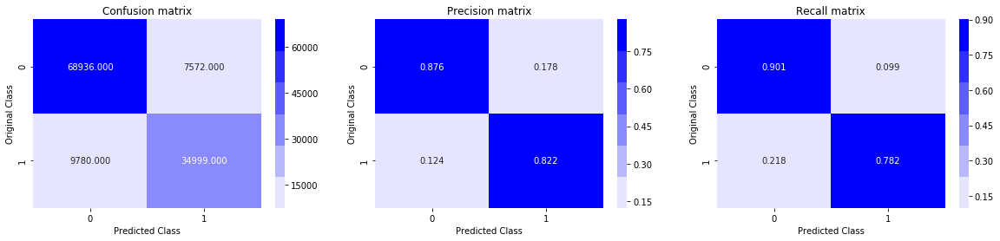


 Time taken: 0 hours 58 minutes and 35.71 seconds.


In [6]:
#Here we are building an Xgboost model based on the hyperparameters we had obtained from the random search in the previous section above. Note that due to the computational constraints, I have not done grid search
#seperately on TFIDF data. Let's just use the parameters obtained in section 4.5 as an estimation.
#

#Training the model with the best params obtained using hyperparameter tuning
import xgboost as xgb
params = {}
params['objective'] = 'binary:logistic'
params['eval_metric'] = 'logloss'
params['eta'] = 0.02
params['max_depth'] = 8
params['subsample'] = 0.6
params['n_estimators'] = 150
params['min_child_weight'] = 8
params['gamma'] = 0.25
params['colsample_bytree'] = 0.7

start_time = timer(None) # timing starts from this point for "start_time" variable
d_train = xgb.DMatrix(X_train, label=y_train)
d_test = xgb.DMatrix(X_test, label=y_test)


watchlist = [(d_train, 'train'), (d_test, 'validation')]
bst = xgb.train(params, d_train, 3000, watchlist, early_stopping_rounds=20, verbose_eval=2)

xgdmat = xgb.DMatrix(X_train,y_train)
predict_y = bst.predict(d_test)
print("\nThe test log loss is:",log_loss(y_test, predict_y, labels=[0, 1], eps=1e-15))

predicted_y =np.array(predict_y>0.5,dtype=int)
print("\nTotal number of validation data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)
timer(start_time)

### Comparing performance for all the models.

In [7]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

from prettytable import PrettyTable

table =PrettyTable()
table.field_names = ["Model", "Vectorizer", "Log Loss", "Class 0 Precision", "Class 1 Precision","Class 0 Recall","Class 1 Recall"]
table.add_row(["Random Model",'Weighted TFIDF W2V', 0.8879, 0.629,0.368,0.499,0.498])
table.add_row(["SGDClassifier(loss='log')",'Weighted TFIDF W2V', 0.4774, 0.773,0.724,0.875,0.561])
table.add_row(["SGDClassifier(loss='hinge')",'Weighted TFIDF W2V', 0.4635, 0.764,0.754,0.899,0.526])
table.add_row(["XGBoost Model",'Weighted TFIDF W2V', 0.3444, 0.843,0.799,0.894,0.716])
table.add_row(["XGBoost (hyp tuned)",'Weighted TFIDF W2V', 0.3050, 0.870,0.816,0.899,0.770])

table.add_row(["Logistic Regression",'TF-IDF ', 0.4575, 0.776,0.754,0.893,0.560])
table.add_row(["SGDClassifier(loss='log',penalty='l1')",'TF-IDF ', 0.4472, 0.791,0.732,0.869,0.609])
table.add_row(["SGDClassifier(loss='log',penalty='l2')",'TF-IDF ', 0.4416, 0.789,0.738,0.875,0.599])
table.add_row(["SGDClassifier(loss='hinge',penalty='l1')",'TF-IDF ', 0.4452, 0.793,0.734,0.870,0.612])
table.add_row(["XGBoost",'TF-IDF ', 0.299, 0.876,0.822,0.901,0.782])

print(table)

+------------------------------------------+--------------------+----------+-------------------+-------------------+----------------+----------------+
|                  Model                   |     Vectorizer     | Log Loss | Class 0 Precision | Class 1 Precision | Class 0 Recall | Class 1 Recall |
+------------------------------------------+--------------------+----------+-------------------+-------------------+----------------+----------------+
|               Random Model               | Weighted TFIDF W2V |  0.8879  |       0.629       |       0.368       |     0.499      |     0.498      |
|        SGDClassifier(loss='log')         | Weighted TFIDF W2V |  0.4774  |       0.773       |       0.724       |     0.875      |     0.561      |
|       SGDClassifier(loss='hinge')        | Weighted TFIDF W2V |  0.4635  |       0.764       |       0.754       |     0.899      |     0.526      |
|              XGBoost Model               | Weighted TFIDF W2V |  0.3444  |       0.843      

## Conclusion: 

The main objective of this Case Study is to classify a new question on Quora as either a duplicate of an existing question or not. Each day thousands of questions are asked on Quora. So there's bound to be questions that are duplicates. Imagine two people asking two differently worded questions which basically have the same meaning and hence the same answer. In this case if two questions are classified as duplicates of one another, using this flag, both the questions can be linked to the same set of answers. If they were not classified as duplicates of each other, then there would be seperate answers for each of these questions. This is not the ideal scenario. Because, ideally we would want the system to pick up duplicate questions and assign answers to a new duplicate question which has been answered for an earlier question. So having said that, the main objective of this experiment was to build an intelligent system which can classify new questions to be duplicate or not of all the existing questions.

For the given task, we are provided with a dataset which contains almost 400K sample pairs of questions. Each of these data points has a label 'is_duplicate'. 'is_duplicate' = 0, if the pairs of questions are not duplicate of one another. 'is_duplicate' = 1, if the pair of questions are duplicates! The problem that we have is a binary classification problem, since, for a given pair of question have to predict either 'is_duplicate' equal to 0 or 1. The metric that we will chose for this problem is 'log loss'. We will also use a binary confusion, precision and recall matrices to get more crisp ideas about individual classes. 

Few things to keep in mind:

1. The cost of misclassification is very very high: Imagine if we wrongly tag a question to be duplicate of another question, the user might be redirected to the answer page that is not meant for the new question that he has asked. This wil absolutely hinder user experience!

2. Idealy, we would want a probability value (P) of Q1 being similar to Q2. We can now set a threshold like if P > 0.95, then we will classify the questions to be duplicate of one another. After getting the probability scores, we can experiment with different values of P. For example we can try with P=0.95. If we are satisfied with the result then it's fine. If not, we can always go ahead and increase the threshold to 0.99 in order to avoid misclassification. 


Why have we chosen our metric to be 'log loss' ?

As we have discussed above, we will use our Key Performance Indicator to be 'log' loss. Minimising the Log Loss is basically equivalent to maximising the accuracy of the classifier. In order to calculate Log loss, the classifier must actually assign a probability value for each of the class labels. Ideally as the predicted class probabilities improve, the Log loss keeps on reducing. Log loss penalises the classifier very heavily if it classifies a Class 0 to be Class 1 and vice versa.  For example, if for a particular observation, the classifier assigns a very small probability to the correct class then the corresponding contribution to the Log Loss will be very large. Naturally this is going to have a significant impact on the overall Log Loss for the classifier,which will then become higher. But, in other scenario if the classifier assigns a high probability value to the correct class, then the Log loss will reduce significantly. Now, imagine a scenario where the model doesn't predict probability scores. It only predicts class labels. In this case, class labels can be either 0 or 1. So we won't get a deep understanding or any interpretability about why a particular pair of question has been labeled as either 0 or 1. Chosing the KPI as Log loss gives us this freedom. We can interpret the models. We can say this two questions are 95% similar or 80% similar, instead of just bluntly classifying them as duplicates.

For deep understanding of log loss please visit: https://datawookie.netlify.com/blog/2015/12/making-sense-of-logarithmic-loss/

Anyway, lets move on to EDA. A high level overview reveals that there are almost 250K question pairs that aren't duplicates and almost 150K question pairs are duplicates. Also, there are a total of 537933 unique questions out of which 111780 of questions occurs more than once. The maximum number of times any question is repeated across the entire data is 157. Thankfully, there are no duplicate pairs of questions. 

Before the data cleaning stage, we have done some basic feature engineering. For more information please refer to section 3.3. On analysing our 'word_share' feature we have seen that the two classes are partially seperable with some overlap. In general, as the 'word_share' count increases, the probability of any pair of questions to be duplicates also increases. This suggest that 'word_share' might be an important feature as far as this problem is concerned. The feature 'word_Common' might not be hugely important, as there is a lot of overlap between the classes. 

Also, I have used Decision Trees to determine the most important features out of all the 26 hand crafter features we have extracted from the text data.

We have removed HTML tags from each of the questions, removed all the punctuations, stopwords. We have expanded themost commonly used English contractions for each questions. We have also performed Stemming using SnowBall stemmer. 

After performing data cleaning, we have extracted some advance features. The four most important amongst them are - fuzz_ratio, fuzz_partial_ratio, token_sort_ratio, token_set_ratio and longest_substring_ratio. Go to section 3.5 for further details. On plotting the word cloud we have observed that 16110763 words are there in all the questions belonging to duplicate questions and almost 33201102 are there in the non duplicate pairs.

We have used these advance features to plot a TSNE plot. By looking at the plot, we can clearly see that the two classes can be seperated nicely, with some overlapping. This suggests that the advance features are useful in some ways.  

Now that we have extracted our basic and advance features, it's time for us to featurize the text in questions. We will use two approach here - using simple TFIDF Features and using TFIDF Weighted Word2Vec representations. We will combine all the features we have obtained into one single data frame and apply Machine Learning models on top of it.

Before building our models, the first thing we need to do is to build a baseline (random) model. Why this is done? Well, we have selected our KPI to be log loss. We all know that the minimum value of log loss is 0, but the maximum value goes till infinity! So we want to determine using a random model what our worst case log loss will be. In a random model - for every data point we generate the predicted class labels randomly. This is the most dumb model we can ever build. The log loss for this model is 0.88. So using this value we will clearly get an idea what out worst case log loss should be! Now using ML models, we will try and reduce this log loss and bring it as close to 0 as possible. 


The models we have used are Logistic Regression with SGDClassifier, Linear SVM with SGD Classifier, a simple Logistic Regression model and XGBoost model. Amongst all the featurizations and all the models that we have used, the XGBoost model applied on the simple TFIDF Vectorizors gave us the least value of test log loss - 0.299. The train log loss obtained using this model is 0.266. The small difference in the train and test log loss suggests that we might have a bit of overfitting (very small)




In [2]:
import pdfkit
pdfkit.from_file('Quora Predicting Question Similarity.html', 'Quora Predicting Question Similarity.pdf')

Loading page (1/2)
Printing pages (2/2)                                               
Done                                                           


True